In [ ]:
# This document shows how the first set of 52 tools were scored. A separate python script is available to run the benchmark on a new tool. 

# Process with dbNSFP

In [ ]:
%%bash
# combine the clinvar variants and all variants from the 107 individuals
cat allVariantsFromTestSamples.txt allTestVariants.txt | sed 's/^X/23/' | sed 's/^Y/24/' | sort -k1n,1n -k2n,2n -k3,3 -k4,4 | uniq | sed 's/^23/X/' | sed 's/^24/Y/' | sed 's/^/chr/' > allVariants.txt 

# download dbNSFP4.4 
aws s3 cp s3://dbnsfp/dbNSFP4.4a.zip . 
unzip dbNSFP4.4a.zip

# extract the relevant dbNSFP scores for each variant in allVariants.txt
java search_dbNSFP44a -i allVariants.txt -o allVariants_dbNSFPScores.txt -v hg19 -w 1,8,9,3,4,38,41,44,47,50,54,59,62,65,68,70,73,77,80,83,85,90,92,94,96,99,102,105,108,111,114,116,118,120,123,124,125,128,134,136,140,143,146,149,151,163,166,168,170,172,174,176,178,181,183

In [66]:
# Groom the dbNSFP output and merge on Maverick and MAPPIN scores
import pandas
fullListSNVs=pandas.read_csv('allVariants_dbNSFPScores.txt',sep='\t',low_memory=False)

# autosomal only
fullListSNVs=fullListSNVs.loc[~(fullListSNVs['hg19_chr'].isin(['X','Y'])),:].reset_index(drop=True)
fullListSNVs['hg19_chr']=fullListSNVs.loc[:,'hg19_chr'].astype(int)

# combine on the Maverick and MAPPIN
# Maverick scores downloaded from https://zenodo.org/records/7838659
maverick=pandas.read_csv('MaverickResults_allSNVs_GRCh37.txt',sep='\t',low_memory=False)
maverick=maverick.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','geneName','proteinChange','Maverick_BenignScore','Maverick_DomScore','Maverick_RecScore']]
fullListSNVs=fullListSNVs.merge(maverick,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
# MAPPIN scores downloaded from https://figshare.com/articles/dataset/MAPPIN_Method_for_Annotating_Predicting_Pathogenicity_and_mode_of_Inheritance_for_Nonsynonymous_variants/4639789
mappin=pandas.read_csv('hg19.nsSNV.mappin.prediction.scores',sep='\t',low_memory=False)
mappin=mappin.loc[:,['#CHR','POS','BENIGN_SCORE','DOMINANT_SCORE','RECESSIVE_SCORE']].rename(columns={'#CHR':'hg19_chr','POS':'hg19_pos(1-based)','BENIGN_SCORE':'MAPPIN_Benign','DOMINANT_SCORE':'MAPPIN_Dominant','RECESSIVE_SCORE':'MAPPIN_Recessive'})
mappin=mappin.loc[~(mappin['hg19_chr'].isin(['chrX','chrY','chrMT','chrM'])),:]
mappin['hg19_chr']=mappin.loc[:,'hg19_chr'].str[3:].astype(int)
fullListSNVs=fullListSNVs.merge(mappin,how='inner',on=['hg19_chr','hg19_pos(1-based)'])
fullListSNVs.to_csv('allVariants_dbNSFPScores_v2.txt',sep='\t',index=False)
fullListSNVs


,#chr,hg19_chr,hg19_pos(1-based),ref,alt,SIFT_score,SIFT4G_score,Polyphen2_HDIV_score,Polyphen2_HVAR_score,LRT_score,...,bStatistic,gnomAD_exomes_AF,geneName,proteinChange,Maverick_BenignScore,Maverick_DomScore,Maverick_RecScore,MAPPIN_Benign,MAPPIN_Dominant,MAPPIN_Recessive
0,1,1,69134,A,G,.;0.129,.;0.107,.;0.0,.;0.001,0.263780,...,994,2.666600e-02,OR4F5,p.E15G,1.000000,6.699941e-32,1.953899e-12,0.08175,0.29685,0.62140
1,1,1,69511,A,G,.;0.652,.;0.676,.;0.0,.;0.0,0.000427,...,994,9.496910e-01,OR4F5,p.T141A,1.000000,3.698261e-34,5.076734e-13,0.08460,0.28930,0.62610
2,1,1,69569,T,C,.;1.0,.;1.0,.;0.0,.;0.0,0.000413,...,994,2.307020e-04,OR4F5,p.L160P,0.798975,1.847664e-04,2.008407e-01,0.07615,0.29390,0.62995
3,1,1,69761,A,T,.;0.01,.;0.122,.;0.322,.;0.229,0.889311,...,994,9.168460e-02,OR4F5,p.D224V,1.000000,1.554906e-34,1.402833e-12,0.08650,0.28750,0.62600
4,1,1,865665,G,A,.;0.27;0.152;.;.;.;.;.;.;.;.,.;0.203;0.123;0.326;0.128;0.202;0.098;0.096;0....,.;.;0.008;.;.;.;.;.;.;.;.,.;.;0.002;.;.;.;.;.;.;.;.,0.107275,...,940,7.795250e-04,SAMD11,p.R68Q,0.999903,1.467715e-08,9.679770e-05,0.29500,0.07210,0.63290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83819,9,9,140918181,A,G,0.759;.;0.756;0.757;0.757;0.757,0.782;0.783;0.78;0.78;0.78;0.78,.;.;.;0.0;.;0.0,.;.;.;0.0;.;0.0,0.000003,...,982,1.808830e-02,CACNA1B,p.T996A,1.000000,0.000000e+00,5.258997e-16,0.08520,0.41590,0.49890
83820,9,9,140952560,G,A,0.042;.;0.025;0.03;0.023;0.038,0.02;0.02;0.02;0.02;0.02;0.02,.;.;.;1.0;.;1.0,.;.;.;1.0;.;1.0,0.000000,...,987,4.332160e-04,CACNA1B,p.R1389H,0.995656,1.206659e-07,4.344134e-03,0.44780,0.21830,0.33390
83821,9,9,140972648,G,A,0.072;.;0.086;0.092;0.083;0.097,0.116;0.118;0.141;0.144;0.138;0.141,.;.;0.989;0.995;.;0.995,.;.;0.871;0.871;.;0.871,0.000000,...,994,1.604690e-05,CACNA1B,p.E1678K,0.852051,2.592167e-03,1.453567e-01,0.06165,0.37925,0.55910
83822,9,9,141015172,C,T,0.0;.;0.0;0.0;0.0;0.0,0.001;0.001;0.016;0.016;0.017;0.017,.;.;.;1.0;.;1.0,.;.;.;0.977;.;0.983,0.927270,...,994,5.210040e-05,CACNA1B,p.R2110W,0.999569,1.298354e-06,4.300152e-04,0.15800,0.37125,0.47075


In [67]:
import pandas
fullListSNVs=pandas.read_csv('allVariants_dbNSFPScores_v2.txt',sep='\t',low_memory=False)
# split the set into maxes and mins
maxes=fullListSNVs.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','Polyphen2_HDIV_score','Polyphen2_HVAR_score','MutationTaster_score','MutationAssessor_score','VEST4_score',
                          'MetaSVM_score','MetaLR_score','MetaRNN_score','M-CAP_score','REVEL_score','MutPred_score','MVP_score','gMVP_score','MPC_score','PrimateAI_score','DEOGEN2_score',
                          'BayesDel_addAF_score','BayesDel_noAF_score','ClinPred_score','LIST-S2_score','VARITY_R_score','VARITY_ER_score','VARITY_R_LOO_score','VARITY_ER_LOO_score',
                          'CADD_raw','DANN_score','fathmm-MKL_coding_score','fathmm-XF_coding_score','Eigen-raw_coding','Eigen-PC-raw_coding','GenoCanyon_score',
                          'integrated_fitCons_score','GERP++_RS','phyloP100way_vertebrate','phyloP470way_mammalian','phyloP17way_primate','phastCons100way_vertebrate',
                          'phastCons470way_mammalian','phastCons17way_primate','SiPhy_29way_logOdds']].reset_index(drop=True)
mins=fullListSNVs.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','SIFT_score','SIFT4G_score','LRT_score','FATHMM_score','PROVEAN_score','bStatistic']].reset_index(drop=True)
zygosity=fullListSNVs.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','Aloft_prob_Tolerant','Aloft_prob_Recessive','Aloft_prob_Dominant','Maverick_BenignScore','Maverick_DomScore','Maverick_RecScore','MAPPIN_Benign','MAPPIN_Dominant','MAPPIN_Recessive']].reset_index(drop=True)



In [68]:
for col in ['Polyphen2_HDIV_score','Polyphen2_HVAR_score','MutationTaster_score','MutationAssessor_score','VEST4_score',
                          'MetaSVM_score','MetaLR_score','MetaRNN_score','M-CAP_score','REVEL_score','MutPred_score','MVP_score','gMVP_score','MPC_score','PrimateAI_score','DEOGEN2_score',
                          'BayesDel_addAF_score','BayesDel_noAF_score','ClinPred_score','LIST-S2_score','VARITY_R_score','VARITY_ER_score','VARITY_R_LOO_score','VARITY_ER_LOO_score',
                          'fathmm-MKL_coding_score','fathmm-XF_coding_score','Eigen-raw_coding','Eigen-PC-raw_coding',
                          'GERP++_RS','phyloP100way_vertebrate','phyloP470way_mammalian','phyloP17way_primate','phastCons100way_vertebrate',
                          'phastCons470way_mammalian','phastCons17way_primate','SiPhy_29way_logOdds']:
    maxes[col]=maxes.loc[:,col].str.split(';',expand=True).replace('',-1000).replace('.',-1000).fillna(-1000).astype(float).max(axis=1)
maxes


,hg19_chr,hg19_pos(1-based),ref,alt,Polyphen2_HDIV_score,Polyphen2_HVAR_score,MutationTaster_score,MutationAssessor_score,VEST4_score,MetaSVM_score,...,GenoCanyon_score,integrated_fitCons_score,GERP++_RS,phyloP100way_vertebrate,phyloP470way_mammalian,phyloP17way_primate,phastCons100way_vertebrate,phastCons470way_mammalian,phastCons17way_primate,SiPhy_29way_logOdds
0,1,69134,A,G,0.000,0.001,0.998383,1.545,0.107,-0.9720,...,0.000003,0.487112,2.310,0.405,-1000.000,0.489,0.000,0.000,0.003,8.5094
1,1,69511,A,G,0.000,0.000,0.999965,-0.855,0.026,-0.9967,...,0.000002,0.487112,1.150,-0.684,-1000.000,-0.694,0.000,0.000,0.114,4.1978
2,1,69569,T,C,0.000,0.000,1.000000,-3.100,0.173,-0.9347,...,0.000002,0.487112,2.310,1.013,-1000.000,-0.773,0.000,0.001,0.477,7.5385
3,1,69761,A,T,0.322,0.229,0.999990,0.475,0.071,-1.1242,...,0.000001,0.487112,0.892,0.513,-1000.000,0.329,0.000,0.000,0.052,6.1223
4,1,865665,G,A,0.008,0.002,0.999219,1.375,0.257,-1.0382,...,0.009664,0.597740,1.760,0.322,-1000.000,-0.745,0.107,0.000,0.003,7.4746
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83819,9,140918181,A,G,0.000,0.000,1.000000,0.000,0.037,-0.0099,...,0.989360,0.597740,0.483,-0.399,0.109,-0.593,0.368,0.088,0.010,-1000.0000
83820,9,140952560,G,A,1.000,1.000,1.000000,1.825,0.764,1.1048,...,1.000000,0.615465,5.330,9.858,11.848,0.676,1.000,1.000,0.991,19.4443
83821,9,140972648,G,A,0.995,0.871,1.000000,1.725,0.698,-0.5247,...,1.000000,0.706298,5.800,9.846,9.831,0.676,1.000,1.000,0.020,20.0537
83822,9,141015172,C,T,1.000,0.983,1.000000,3.005,0.593,0.9886,...,0.788683,0.554377,3.710,1.806,1.668,0.522,0.885,0.990,0.985,14.0691


In [69]:
# rescale the columns as needed
# phyloP_100way scores range from -20.0 to 10.003
# phyloP_470way scores range from -20 to 11.936
# phyloP_15way scores range from -13.362 to 0.756
# SiPhy scores range from 0 to 37.9718
# CADD scores range from -6.458163 to 18.301497
# GERP scores range from -12.3 to 6.17
# MetaSVM scores range from -2 to 3
# MPC scores range from 0 to 5
# MutationAssessor scores range from -5.17 to 6.49
# Eigen-raw_coding scores range from -4.155 to 1.323
# Eigen-PC-raw_coding scores range from -4.236 to 1.205
# BayesDel_addAF scores range from -1.11707 to 0.750927
# BayesDel_noAF scores range from -1.31914 to 0.840878
maxes.loc[maxes['CADD_raw']==-1000,'CADD_raw']=-6.458163
maxes.loc[maxes['GERP++_RS']==-1000,'GERP++_RS']=-12.3
maxes.loc[maxes['MetaSVM_score']==-1000,'MetaSVM_score']=-2
maxes.loc[maxes['MPC_score']==-1000,'MPC_score']=0
maxes.loc[maxes['phyloP100way_vertebrate']==-1000,'phyloP100way_vertebrate']=-20
maxes.loc[maxes['phyloP470way_mammalian']==-1000,'phyloP470way_mammalian']=-20
maxes.loc[maxes['phyloP17way_primate']==-1000,'phyloP17way_primate']=-13.362
maxes.loc[maxes['SiPhy_29way_logOdds']==-1000,'SiPhy_29way_logOdds']=0
maxes.loc[maxes['MutationAssessor_score']==-1000,'MutationAssessor_score']=-5.17
maxes.loc[maxes['Eigen-raw_coding']==-1000,'Eigen-raw_coding']=-4.155
maxes.loc[maxes['Eigen-PC-raw_coding']==-1000,'Eigen-PC-raw_coding']=-4.236
maxes.loc[maxes['BayesDel_addAF_score']==-1000,'Eigen-PC-raw_coding']=-1.11707
maxes.loc[maxes['BayesDel_noAF_score']==-1000,'Eigen-PC-raw_coding']=-1.31914
maxes=maxes.replace(-1000,0)
maxes['CADD_raw']=(maxes.loc[:,'CADD_raw']+6.458163)/(18.301497+6.458163)
maxes['GERP++_RS']=(maxes.loc[:,'GERP++_RS']+12.3)/(12.3+6.17)
maxes['MetaSVM_score']=(maxes.loc[:,'MetaSVM_score']+2)/(3+2)
maxes['MPC_score']=(maxes.loc[:,'MPC_score']-0)/(5-0)
maxes['phyloP100way_vertebrate']=(maxes.loc[:,'phyloP100way_vertebrate']+20)/(10.003+20)
maxes['phyloP470way_mammalian']=(maxes.loc[:,'phyloP470way_mammalian']+20)/(11.936+20)
maxes['phyloP17way_primate']=(maxes.loc[:,'phyloP17way_primate'].astype(float)+13.362)/(0.756+13.362)
maxes['SiPhy_29way_logOdds']=(maxes.loc[:,'SiPhy_29way_logOdds'].astype(float)-0)/(37.9718-0)
maxes['MutationAssessor_score']=(maxes.loc[:,'MutationAssessor_score']+5.17)/(6.49+5.17)
maxes['Eigen-raw_coding']=(maxes.loc[:,'Eigen-raw_coding']+4.155)/(1.323+4.155)
maxes['Eigen-PC-raw_coding']=(maxes.loc[:,'Eigen-PC-raw_coding']+4.236)/(1.205+4.236)
maxes['BayesDel_addAF_score']=(maxes.loc[:,'BayesDel_addAF_score']+1.11707)/(0.750927+1.11707)
maxes['BayesDel_noAF_score']=(maxes.loc[:,'BayesDel_noAF_score']+1.31914)/(0.840878+1.31914)
maxes

,hg19_chr,hg19_pos(1-based),ref,alt,Polyphen2_HDIV_score,Polyphen2_HVAR_score,MutationTaster_score,MutationAssessor_score,VEST4_score,MetaSVM_score,...,GenoCanyon_score,integrated_fitCons_score,GERP++_RS,phyloP100way_vertebrate,phyloP470way_mammalian,phyloP17way_primate,phastCons100way_vertebrate,phastCons470way_mammalian,phastCons17way_primate,SiPhy_29way_logOdds
0,1,69134,A,G,0.000,0.001,0.998383,0.575901,0.107,0.20560,...,0.000003,0.487112,0.791012,0.680099,0.000000,0.981088,0.000,0.000,0.003,0.224098
1,1,69511,A,G,0.000,0.000,0.999965,0.370069,0.026,0.20066,...,0.000002,0.487112,0.728208,0.643802,0.000000,0.897294,0.000,0.000,0.114,0.110550
2,1,69569,T,C,0.000,0.000,1.000000,0.177530,0.173,0.21306,...,0.000002,0.487112,0.791012,0.700363,0.000000,0.891699,0.000,0.001,0.477,0.198529
3,1,69761,A,T,0.322,0.229,0.999990,0.484134,0.071,0.17516,...,0.000001,0.487112,0.714239,0.683698,0.000000,0.969755,0.000,0.000,0.052,0.161233
4,1,865665,G,A,0.008,0.002,0.999219,0.561321,0.257,0.19236,...,0.009664,0.597740,0.761234,0.677332,0.000000,0.893682,0.107,0.000,0.003,0.196846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83819,9,140918181,A,G,0.000,0.000,1.000000,0.443396,0.037,0.39802,...,0.989360,0.597740,0.692095,0.653301,0.629666,0.904448,0.368,0.088,0.010,0.000000
83820,9,140952560,G,A,1.000,1.000,1.000000,0.599914,0.764,0.62096,...,1.000000,0.615465,0.954521,0.995167,0.997244,0.994333,1.000,1.000,0.991,0.512072
83821,9,140972648,G,A,0.995,0.871,1.000000,0.591338,0.698,0.29506,...,1.000000,0.706298,0.979968,0.994767,0.934087,0.994333,1.000,1.000,0.020,0.528121
83822,9,141015172,C,T,1.000,0.983,1.000000,0.701115,0.593,0.59772,...,0.788683,0.554377,0.866811,0.726794,0.678482,0.983425,0.885,0.990,0.985,0.370514


In [70]:
for col in ['SIFT_score','SIFT4G_score','FATHMM_score','PROVEAN_score']:
    mins[col]=mins.loc[:,col].str.split(';',expand=True).replace('.',1000).fillna(1000).astype(float).min(axis=1)
# rescale the columns as needed
# bStatistic scores range from 0 to 1000
# FATHMM scores range from -16.13 to 10.64
# PROVEAN scores range from -14 to 14
mins.loc[mins['FATHMM_score']==1000,'FATHMM_score']=10.64
mins.loc[mins['PROVEAN_score']==1000,'PROVEAN_score']=14
mins['FATHMM_score']=(mins.loc[:,'FATHMM_score']+16.13)/(10.64+16.13)
mins['PROVEAN_score']=(mins.loc[:,'PROVEAN_score']+14)/(14+14)
mins['LRT_score']=mins.loc[:,'LRT_score'].replace('.',1000).fillna(1000).astype(float)
mins['bStatistic']=mins.loc[:,'bStatistic'].replace('.',1000).fillna(1000).astype(float)
mins['bStatistic']=(mins.loc[:,'bStatistic']-0)/(1000-0)
mins=mins.replace(1000,1)
# flip the mins
for col in ['SIFT_score','SIFT4G_score','LRT_score','FATHMM_score','PROVEAN_score','bStatistic']:
    mins[col]=1-mins.loc[:,col]
mins


,hg19_chr,hg19_pos(1-based),ref,alt,SIFT_score,SIFT4G_score,LRT_score,FATHMM_score,PROVEAN_score,bStatistic
0,1,69134,A,G,0.871,0.893,0.736220,0.121031,0.627143,0.006
1,1,69511,A,G,0.348,0.324,0.999573,0.350392,0.445000,0.006
2,1,69569,T,C,0.000,0.000,0.999587,0.066866,0.165714,0.006
3,1,69761,A,T,0.990,0.878,0.110689,0.072843,0.579286,0.006
4,1,865665,G,A,0.848,0.904,0.892725,0.000000,0.569643,0.060
...,...,...,...,...,...,...,...,...,...,...
83819,9,140918181,A,G,0.244,0.220,0.999997,0.542398,0.505000,0.018
83820,9,140952560,G,A,0.977,0.980,1.000000,0.584236,0.676786,0.013
83821,9,140972648,G,A,0.928,0.884,1.000000,0.580501,0.592857,0.006
83822,9,141015172,C,T,1.000,0.999,0.072730,0.576018,0.749643,0.006


In [71]:
# clean up Aloft's columns
for col in ['Aloft_prob_Tolerant','Aloft_prob_Recessive','Aloft_prob_Dominant']:
    zygosity[col]=zygosity.loc[:,col].str.replace('|',';',regex=False).str.split(';',expand=True).replace('.',0).replace('',0).fillna(0).astype(float).max(axis=1)
zygosity


,hg19_chr,hg19_pos(1-based),ref,alt,Aloft_prob_Tolerant,Aloft_prob_Recessive,Aloft_prob_Dominant,Maverick_BenignScore,Maverick_DomScore,Maverick_RecScore,MAPPIN_Benign,MAPPIN_Dominant,MAPPIN_Recessive
0,1,69134,A,G,0.0,0.0,0.0,1.000000,6.699941e-32,1.953899e-12,0.08175,0.29685,0.62140
1,1,69511,A,G,0.0,0.0,0.0,1.000000,3.698261e-34,5.076734e-13,0.08460,0.28930,0.62610
2,1,69569,T,C,0.0,0.0,0.0,0.798975,1.847664e-04,2.008407e-01,0.07615,0.29390,0.62995
3,1,69761,A,T,0.0,0.0,0.0,1.000000,1.554906e-34,1.402833e-12,0.08650,0.28750,0.62600
4,1,865665,G,A,0.0,0.0,0.0,0.999903,1.467715e-08,9.679770e-05,0.29500,0.07210,0.63290
...,...,...,...,...,...,...,...,...,...,...,...,...,...
83819,9,140918181,A,G,0.0,0.0,0.0,1.000000,0.000000e+00,5.258997e-16,0.08520,0.41590,0.49890
83820,9,140952560,G,A,0.0,0.0,0.0,0.995656,1.206659e-07,4.344134e-03,0.44780,0.21830,0.33390
83821,9,140972648,G,A,0.0,0.0,0.0,0.852051,2.592167e-03,1.453567e-01,0.06165,0.37925,0.55910
83822,9,141015172,C,T,0.0,0.0,0.0,0.999569,1.298354e-06,4.300152e-04,0.15800,0.37125,0.47075


In [72]:
#recombine the rescaled data
variantScores=pandas.concat([fullListSNVs.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','geneName','proteinChange']],maxes.iloc[:,4:],mins.iloc[:,4:],zygosity.iloc[:,4:]],axis=1)
# if anything is below 0, up it to 0
for col in ['Polyphen2_HDIV_score','Polyphen2_HVAR_score','MutationTaster_score','MutationAssessor_score','VEST4_score',
                          'MetaSVM_score','MetaLR_score','MetaRNN_score','M-CAP_score','REVEL_score','MutPred_score','MVP_score','gMVP_score','MPC_score','PrimateAI_score','DEOGEN2_score',
                          'BayesDel_addAF_score','BayesDel_noAF_score','ClinPred_score','LIST-S2_score','VARITY_R_score','VARITY_ER_score','VARITY_R_LOO_score','VARITY_ER_LOO_score',
                          'CADD_raw','DANN_score','fathmm-MKL_coding_score','fathmm-XF_coding_score','Eigen-raw_coding','Eigen-PC-raw_coding','GenoCanyon_score',
                          'integrated_fitCons_score','GERP++_RS','phyloP100way_vertebrate','phyloP470way_mammalian','phyloP17way_primate','phastCons100way_vertebrate',
                          'phastCons470way_mammalian','phastCons17way_primate','SiPhy_29way_logOdds','SIFT_score','SIFT4G_score','LRT_score','FATHMM_score','PROVEAN_score','bStatistic',
                           'Aloft_prob_Tolerant','Aloft_prob_Recessive','Aloft_prob_Dominant','Maverick_BenignScore','Maverick_DomScore','Maverick_RecScore','MAPPIN_Benign','MAPPIN_Dominant',
                        'MAPPIN_Recessive']:
    variantScores.loc[variantScores[col]<0,col]=0


In [73]:
variantScores.to_csv('allVariants_dbNSFPScores_v3.txt',sep='\t',index=False)

In [74]:
variantScores

,hg19_chr,hg19_pos(1-based),ref,alt,geneName,proteinChange,Polyphen2_HDIV_score,Polyphen2_HVAR_score,MutationTaster_score,MutationAssessor_score,...,bStatistic,Aloft_prob_Tolerant,Aloft_prob_Recessive,Aloft_prob_Dominant,Maverick_BenignScore,Maverick_DomScore,Maverick_RecScore,MAPPIN_Benign,MAPPIN_Dominant,MAPPIN_Recessive
0,1,69134,A,G,OR4F5,p.E15G,0.000,0.001,0.998383,0.575901,...,0.006,0.0,0.0,0.0,1.000000,6.699941e-32,1.953899e-12,0.08175,0.29685,0.62140
1,1,69511,A,G,OR4F5,p.T141A,0.000,0.000,0.999965,0.370069,...,0.006,0.0,0.0,0.0,1.000000,3.698261e-34,5.076734e-13,0.08460,0.28930,0.62610
2,1,69569,T,C,OR4F5,p.L160P,0.000,0.000,1.000000,0.177530,...,0.006,0.0,0.0,0.0,0.798975,1.847664e-04,2.008407e-01,0.07615,0.29390,0.62995
3,1,69761,A,T,OR4F5,p.D224V,0.322,0.229,0.999990,0.484134,...,0.006,0.0,0.0,0.0,1.000000,1.554906e-34,1.402833e-12,0.08650,0.28750,0.62600
4,1,865665,G,A,SAMD11,p.R68Q,0.008,0.002,0.999219,0.561321,...,0.060,0.0,0.0,0.0,0.999903,1.467715e-08,9.679770e-05,0.29500,0.07210,0.63290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83819,9,140918181,A,G,CACNA1B,p.T996A,0.000,0.000,1.000000,0.443396,...,0.018,0.0,0.0,0.0,1.000000,0.000000e+00,5.258997e-16,0.08520,0.41590,0.49890
83820,9,140952560,G,A,CACNA1B,p.R1389H,1.000,1.000,1.000000,0.599914,...,0.013,0.0,0.0,0.0,0.995656,1.206659e-07,4.344134e-03,0.44780,0.21830,0.33390
83821,9,140972648,G,A,CACNA1B,p.E1678K,0.995,0.871,1.000000,0.591338,...,0.006,0.0,0.0,0.0,0.852051,2.592167e-03,1.453567e-01,0.06165,0.37925,0.55910
83822,9,141015172,C,T,CACNA1B,p.R2110W,1.000,0.983,1.000000,0.701115,...,0.006,0.0,0.0,0.0,0.999569,1.298354e-06,4.300152e-04,0.15800,0.37125,0.47075


# Add on additional scores

## AlphaMissense

In [75]:
# AlphaMissense scores downloaded from https://console.cloud.google.com/storage/browser/dm_alphamissense
import pandas
AlphaMissense=pandas.read_csv('AlphaMissense_hg19.tsv',sep='\t',low_memory=False,skiprows=3)
AlphaMissense=AlphaMissense.rename(columns={'#CHROM':'hg19_chr','POS':'hg19_pos(1-based)','REF':'ref','ALT':'alt','am_pathogenicity':'AlphaMissense_score'})
AlphaMissense=AlphaMissense.loc[((AlphaMissense['hg19_chr']!='chrX') & (AlphaMissense['hg19_chr']!='chrY') & (AlphaMissense['hg19_chr']!='chrMT') & (AlphaMissense['hg19_chr']!='chrM')),:].reset_index(drop=True)
AlphaMissense['hg19_chr']=AlphaMissense.loc[:,'hg19_chr'].str[3:].astype(int)
AlphaMissense

,hg19_chr,hg19_pos(1-based),ref,alt,genome,uniprot_id,transcript_id,protein_variant,AlphaMissense_score,am_class
0,1,69094,G,T,hg19,Q8NH21,ENST00000335137.3,V2L,0.2937,benign
1,1,69094,G,C,hg19,Q8NH21,ENST00000335137.3,V2L,0.2937,benign
2,1,69094,G,A,hg19,Q8NH21,ENST00000335137.3,V2M,0.3296,benign
3,1,69095,T,C,hg19,Q8NH21,ENST00000335137.3,V2A,0.2609,benign
4,1,69095,T,A,hg19,Q8NH21,ENST00000335137.3,V2E,0.2922,benign
...,...,...,...,...,...,...,...,...,...,...
66958360,9,141016446,T,A,hg19,Q00975,ENST00000371372.1,C2339S,0.9244,pathogenic
66958361,9,141016447,G,T,hg19,Q00975,ENST00000371372.1,C2339F,0.8531,pathogenic
66958362,9,141016447,G,C,hg19,Q00975,ENST00000371372.1,C2339S,0.9244,pathogenic
66958363,9,141016447,G,A,hg19,Q00975,ENST00000371372.1,C2339Y,0.9029,pathogenic


In [76]:
fullListSNVs=pandas.read_csv('allVariants_dbNSFPScores_v3.txt',sep='\t',low_memory=False)
fullListSNVs=fullListSNVs.merge(AlphaMissense.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','AlphaMissense_score']],how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
fullListSNVs.to_csv('allVariants_dbNSFPScores_v3_AlphaMissenseSubset.txt',sep='\t',index=False)
fullListSNVs

,hg19_chr,hg19_pos(1-based),ref,alt,geneName,proteinChange,Polyphen2_HDIV_score,Polyphen2_HVAR_score,MutationTaster_score,MutationAssessor_score,...,Aloft_prob_Tolerant,Aloft_prob_Recessive,Aloft_prob_Dominant,Maverick_BenignScore,Maverick_DomScore,Maverick_RecScore,MAPPIN_Benign,MAPPIN_Dominant,MAPPIN_Recessive,AlphaMissense_score
0,1,69134,A,G,OR4F5,p.E15G,0.000,0.001,0.998383,0.575901,...,0.0,0.0,0.0,1.000000,6.699941e-32,1.953899e-12,0.08175,0.29685,0.62140,0.0854
1,1,69511,A,G,OR4F5,p.T141A,0.000,0.000,0.999965,0.370069,...,0.0,0.0,0.0,1.000000,3.698261e-34,5.076734e-13,0.08460,0.28930,0.62610,0.0543
2,1,69569,T,C,OR4F5,p.L160P,0.000,0.000,1.000000,0.177530,...,0.0,0.0,0.0,0.798975,1.847664e-04,2.008407e-01,0.07615,0.29390,0.62995,0.0296
3,1,69761,A,T,OR4F5,p.D224V,0.322,0.229,0.999990,0.484134,...,0.0,0.0,0.0,1.000000,1.554906e-34,1.402833e-12,0.08650,0.28750,0.62600,0.1062
4,1,865665,G,A,SAMD11,p.R68Q,0.008,0.002,0.999219,0.561321,...,0.0,0.0,0.0,0.999903,1.467715e-08,9.679770e-05,0.29500,0.07210,0.63290,0.0629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69237,9,140917779,G,T,CACNA1B,p.A862S,0.761,0.141,1.000000,0.425815,...,0.0,0.0,0.0,1.000000,0.000000e+00,2.142289e-16,0.07100,0.42710,0.50190,0.0859
69238,9,140918181,A,G,CACNA1B,p.T996A,0.000,0.000,1.000000,0.443396,...,0.0,0.0,0.0,1.000000,0.000000e+00,5.258997e-16,0.08520,0.41590,0.49890,0.0563
69239,9,140952560,G,A,CACNA1B,p.R1389H,1.000,1.000,1.000000,0.599914,...,0.0,0.0,0.0,0.995656,1.206659e-07,4.344134e-03,0.44780,0.21830,0.33390,0.7078
69240,9,140972648,G,A,CACNA1B,p.E1678K,0.995,0.871,1.000000,0.591338,...,0.0,0.0,0.0,0.852051,2.592167e-03,1.453567e-01,0.06165,0.37925,0.55910,0.1455


## ESM1b

In [1]:
# ESM1b scores downloaded from https://huggingface.co/spaces/ntranoslab/esm_variants

# prepare the subset of variants for this tool
thisToolName='ESM1b'
thisToolColumnName='ESMScore'
thisToolColumnName2='ESMScoreRecoded'


import pandas
fullListSNVs=pandas.read_csv('variantScores/allVariants_dbNSFPScores_v3.txt',sep='\t',low_memory=False)
# parse up the proteinChange column
fullListSNVs['refResidue']=fullListSNVs.loc[:,'proteinChange'].str[2]
fullListSNVs['altResidue']=fullListSNVs.loc[:,'proteinChange'].str[-1]
fullListSNVs['changePos']=fullListSNVs.loc[:,'proteinChange'].str[3:-1]
fullListSNVs=fullListSNVs.loc[fullListSNVs['altResidue']!='X',:].reset_index(drop=True) # no stop-gain SNVs
# load the ESM1b score for each variant
geneMap=pandas.read_csv('ALL_hum_isoforms_ESM1b_LLR/contents_u_df.csv',sep=',',low_memory=False,index_col=0)
fullListSNVs[thisToolColumnName]=1
for i in range(len(fullListSNVs)):
    if i%1000==0:
        print('Row ' + str(i))
    geneName=fullListSNVs.loc[i,'geneName']
    geneIDsList=geneMap.loc[geneMap['gene']==geneName,'id'].values
    if len(geneIDsList)==0:
        continue
    for geneID in geneIDsList:
        thisResidueNum=fullListSNVs.loc[i,'changePos']
        thisResidueRef=fullListSNVs.loc[i,'refResidue']
        thisResidueAlt=fullListSNVs.loc[i,'altResidue']
        thisGene=pandas.read_csv('C:/Users/Matt/Downloads/ALL_hum_isoforms_ESM1b_LLR/content/ALL_hum_isoforms_ESM1b_LLR/' + geneID + '_LLR.csv',sep=',',low_memory=False,index_col=0)
        if thisResidueRef + ' ' + thisResidueNum in thisGene.columns.values:
            fullListSNVs.loc[i,thisToolColumnName]=thisGene.loc[thisResidueAlt,thisResidueRef + ' ' + thisResidueNum]
            break
fullListSNVs=fullListSNVs.loc[fullListSNVs[thisToolColumnName]<1,:].reset_index(drop=True)
fullListSNVs[thisToolColumnName2]=1-((fullListSNVs.loc[:,thisToolColumnName]-fullListSNVs.loc[:,thisToolColumnName].min())/(fullListSNVs.loc[:,thisToolColumnName].max()-fullListSNVs.loc[:,thisToolColumnName].min()))
fullListSNVs.to_csv('variantScores/allVariants_dbNSFPScores_v3_' + thisToolName + 'Subset.txt',sep='\t',index=False)
fullListSNVs

Row 0
Row 1000
Row 2000
Row 3000
Row 4000
Row 5000
Row 6000
Row 7000
Row 8000
Row 9000
Row 10000
Row 11000
Row 12000
Row 13000
Row 14000
Row 15000
Row 16000
Row 17000
Row 18000
Row 19000
Row 20000
Row 21000
Row 22000
Row 23000
Row 24000
Row 25000
Row 26000
Row 27000
Row 28000
Row 29000
Row 30000
Row 31000
Row 32000
Row 33000
Row 34000
Row 35000
Row 36000
Row 37000
Row 38000
Row 39000
Row 40000
Row 41000
Row 42000
Row 43000
Row 44000
Row 45000
Row 46000
Row 47000
Row 48000
Row 49000
Row 50000
Row 51000
Row 52000
Row 53000
Row 54000
Row 55000
Row 56000
Row 57000
Row 58000
Row 59000
Row 60000
Row 61000
Row 62000
Row 63000
Row 64000
Row 65000
Row 66000
Row 67000
Row 68000
Row 69000
Row 70000
Row 71000
Row 72000
Row 73000


,hg19_chr,hg19_pos(1-based),ref,alt,geneName,proteinChange,Polyphen2_HDIV_score,Polyphen2_HVAR_score,MutationTaster_score,MutationAssessor_score,...,Maverick_DomScore,Maverick_RecScore,MAPPIN_Benign,MAPPIN_Dominant,MAPPIN_Recessive,refResidue,altResidue,changePos,ESMScore,ESMScoreRecoded
0,1,69134,A,G,OR4F5,p.E15G,0.000,0.001,0.998383,0.575901,...,6.699941e-32,1.953899e-12,0.08175,0.29685,0.62140,E,G,15,-5.511,0.273017
1,1,69511,A,G,OR4F5,p.T141A,0.000,0.000,0.999965,0.370069,...,3.698261e-34,5.076734e-13,0.08460,0.28930,0.62610,T,A,141,-2.206,0.134390
2,1,69569,T,C,OR4F5,p.L160P,0.000,0.000,1.000000,0.177530,...,1.847664e-04,2.008407e-01,0.07615,0.29390,0.62995,L,P,160,0.701,0.012458
3,1,69761,A,T,OR4F5,p.D224V,0.322,0.229,0.999990,0.484134,...,1.554906e-34,1.402833e-12,0.08650,0.28750,0.62600,D,V,224,-4.763,0.241643
4,1,881918,G,A,NOC2L,p.S556L,0.484,0.183,0.999200,0.689537,...,6.176152e-34,4.304846e-12,0.91530,0.02390,0.06080,S,L,556,-6.302,0.306195
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31323,9,140693284,G,A,EHMT1,p.C842Y,0.999,0.979,1.000000,0.535163,...,8.652328e-01,4.826163e-02,0.02150,0.72930,0.24920,C,Y,842,-16.026,0.714064
31324,9,140695342,G,T,EHMT1,p.G873V,1.000,0.999,1.000000,0.771441,...,7.116054e-01,5.544370e-02,0.02140,0.72785,0.25075,G,V,873,-12.520,0.567006
31325,9,140708941,T,C,EHMT1,p.M1080T,0.088,0.112,0.999967,0.532590,...,4.959744e-01,6.507834e-02,0.02295,0.72245,0.25460,M,T,1080,-8.320,0.390839
31326,9,140710453,T,C,EHMT1,p.C1105R,1.000,1.000,1.000000,0.814322,...,9.915878e-01,7.269913e-03,0.02135,0.72695,0.25170,C,R,1105,-13.148,0.593348


## EVE

In [ ]:
# EVE data downloaded from https://evemodel.org/
# preprocessing

# I downloaded the 'vcf_files_missense_mutations' folder of EVE predictions. On each vcf file, I ran GATK VariantsToTable to extract the chrom, pos, ref, alt, and EVE score
# then I concatenated all of them together
# here I will filter down to only the SNVs and will correct the nomenclature to make it standard
import pandas
import numpy as np
from difflib import SequenceMatcher
EVE=pandas.read_csv('EVE/combined.txt.gz',sep='\t',low_memory=False,compression='gzip')

EVE['mismatchCol0']=0
EVE['mismatchCol1']=0
EVE['mismatchCol2']=0
EVE.loc[(EVE.loc[:,'REF'].str[0]!=EVE.loc[:,'ALT'].str[0]),'mismatchCol0']=1
EVE.loc[(EVE.loc[:,'REF'].str[1]!=EVE.loc[:,'ALT'].str[1]),'mismatchCol1']=1
EVE.loc[(EVE.loc[:,'REF'].str[2]!=EVE.loc[:,'ALT'].str[2]),'mismatchCol2']=1
EVE['totalMismatches']=EVE.loc[:,['mismatchCol0','mismatchCol1','mismatchCol2']].sum(axis=1)
# keep only SNVs
EVE2=EVE.loc[EVE['totalMismatches']==1,:].reset_index(drop=True)

EVE2.loc[EVE['mismatchCol0']==1,'mismatchCol']=0
EVE2.loc[EVE['mismatchCol1']==1,'mismatchCol']=1
EVE2.loc[EVE['mismatchCol2']==1,'mismatchCol']=2
EVE2=EVE2.loc[EVE2['mismatchCol']>=0,:].reset_index(drop=True)
EVE2.loc[EVE2['mismatchCol1']==1,'POS']=EVE2.loc[EVE2['mismatchCol1']==1,'POS']+1
EVE2.loc[EVE2['mismatchCol2']==1,'POS']=EVE2.loc[EVE2['mismatchCol2']==1,'POS']+1
EVE2['REF2']='Z'
EVE2['ALT2']='Z'
EVE2.loc[EVE2['mismatchCol0']==1,'REF2']=EVE2.loc[EVE2['mismatchCol0']==1,'REF'].str[0]
EVE2.loc[EVE2['mismatchCol0']==1,'ALT2']=EVE2.loc[EVE2['mismatchCol0']==1,'ALT'].str[0]
EVE2.loc[EVE2['mismatchCol1']==1,'REF2']=EVE2.loc[EVE2['mismatchCol1']==1,'REF'].str[1]
EVE2.loc[EVE2['mismatchCol1']==1,'ALT2']=EVE2.loc[EVE2['mismatchCol1']==1,'ALT'].str[1]
EVE2.loc[EVE2['mismatchCol2']==1,'REF2']=EVE2.loc[EVE2['mismatchCol2']==1,'REF'].str[2]
EVE2.loc[EVE2['mismatchCol2']==1,'ALT2']=EVE2.loc[EVE2['mismatchCol2']==1,'ALT'].str[2]
EVE3=EVE2.loc[:,['CHROM','POS','REF2','ALT2','EVE']].rename(columns={'REF2':'ref','ALT2':'alt','CHROM':'hg19_chr','POS':'hg19_pos(1-based)'}).sort_values(by=['hg19_chr','hg19_pos(1-based)','alt'],ascending=True)
EVE3.to_csv('variantScores/allSNVs_EVE.txt.gz',sep='\t',index=False,compression='gzip')
EVE3


,hg19_chr,hg19_pos(1-based),ref,alt,EVE
5211976,1,961387,G,A,0.072384
5211974,1,961387,G,C,0.092426
5211975,1,961387,G,T,0.060169
5211972,1,961388,C,A,0.098362
5211973,1,961388,C,G,0.149438
...,...,...,...,...,...
9586203,Y,2787539,T,A,0.299150
9586199,Y,2787539,G,C,0.302173
9586205,Y,2787539,T,C,0.395692
9586204,Y,2787539,T,G,0.342572


## PrimateAI-3D

In [12]:
# PrimateAI-3D scores downloaded from Illumina Basespace (had to email for access)
# preprocessing

# The input file is in GRCh38 coordinates and needs to be converted to hg19 coordinates. 
import pandas
from tqdm import tqdm
PrimateAI3D=pandas.read_csv('PrimateAI-3D_scores.csv.gz',sep=',',low_memory=False,compression='gzip')
tqdm.pandas()

#from liftover import get_lifter
#converter = get_lifter('hg38','hg19')
# convert hg38 coordinates to hg19
def convertCoords(row):
    converted=converter[row.chr][row.pos]
    if len(converted)>0:
        converted=converted[0]
    else:
        return '-1',-1
    return converted[0],converted[1]
PrimateAI3D[['hg19_chr','hg19_pos(1-based)']]=PrimateAI3D.progress_apply(convertCoords,axis=1,result_type='expand')
# keep just the hg19 results
PrimateAI3D['hg19_pos(1-based)']=PrimateAI3D.loc[:,'hg19_pos(1-based)'].astype(int)
PrimateAI3D=PrimateAI3D.loc[PrimateAI3D['hg19_pos(1-based)']>0,:].reset_index(drop=True)
PrimateAI3D=PrimateAI3D.rename(columns={'non_flipped_ref':'ref','non_flipped_alt':'alt'})
PrimateAI3D=PrimateAI3D.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','score_PAI3D']].reset_index(drop=True)
PrimateAI3D.to_csv('PrimateAI-3D_scores_hg19.txt.gz',sep='\t',index=False,compression='gzip')
PrimateAI3D

,hg19_chr,hg19_pos(1-based),ref,alt,score_PAI3D
0,chr1,69134,A,G,0.489459
1,chr1,69101,A,G,0.644101
2,chr1,69916,A,G,0.816457
3,chr1,69940,A,G,0.657667
4,chr1,69952,A,G,0.657810
...,...,...,...,...,...
69726873,chr3,128848929,A,G,0.487433
69726874,chr3,128848929,A,C,0.680989
69726875,chr3,128848928,T,C,0.489871
69726876,chr3,128848928,T,G,0.493245


# Run VarPB (2021 - 2023)

## Data Processing

In [1]:
import scipy.stats
import pandas
import numpy as np
variantScores=pandas.read_csv('variantScores/allVariants_dbNSFPScores_v3.txt',sep='\t',low_memory=False)
testSampleVariants=pandas.read_csv('testSamples/allSamplesExonicVariants.txt',sep='\t',low_memory=False)
# drop variants that are homozygous ref
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['genotype']==0),:].reset_index(drop=True)
# drop non-autosomal variants
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['hg19_chr'].isin(['X','Y'])),:]
testSampleVariants['hg19_chr']=testSampleVariants.loc[:,'hg19_chr'].astype(int)
sampleIDs=testSampleVariants.loc[:,'sampleID'].drop_duplicates(keep='first').reset_index(drop=True)



variantScores['Maverick_noZygosity']=variantScores.loc[:,'Maverick_DomScore'] + variantScores.loc[:,'Maverick_RecScore']
variantScores['MAPPIN_noZygosity']=variantScores.loc[:,'MAPPIN_Dominant'] + variantScores.loc[:,'MAPPIN_Recessive']
standardTools=['Polyphen2_HDIV_score','Polyphen2_HVAR_score','MutationTaster_score','MutationAssessor_score','VEST4_score','MetaSVM_score','MetaLR_score','MetaRNN_score',
               'M-CAP_score','REVEL_score','MutPred_score','MVP_score','gMVP_score','MPC_score','PrimateAI_score',
               'BayesDel_addAF_score','BayesDel_noAF_score','ClinPred_score','LIST-S2_score','VARITY_R_score','VARITY_ER_score','VARITY_R_LOO_score','VARITY_ER_LOO_score',
               'DEOGEN2_score','CADD_raw','DANN_score','fathmm-MKL_coding_score','fathmm-XF_coding_score','Eigen-raw_coding','Eigen-PC-raw_coding','GenoCanyon_score',
               'integrated_fitCons_score','GERP++_RS','phyloP100way_vertebrate','phyloP470way_mammalian','phyloP17way_primate','phastCons100way_vertebrate',
               'phastCons470way_mammalian','phastCons17way_primate','SiPhy_29way_logOdds','SIFT_score','SIFT4G_score','LRT_score','FATHMM_score','PROVEAN_score','bStatistic',
               'Maverick_noZygosity','MAPPIN_noZygosity']
variantScores2=variantScores.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','geneName','Maverick_DomScore','Maverick_RecScore','MAPPIN_Dominant','MAPPIN_Recessive'] + standardTools]

known2021Rec=pandas.read_csv('testSets/2021_autosomalRecessive_notInClinvarAtAllBefore2021.txt',sep='\t',low_memory=False)
known2021Rec2=known2021Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2021Dom=pandas.read_csv('testSets/2021_autosomalDominant_notInClinvarAtAllBefore2021.txt',sep='\t',low_memory=False)
known2021Dom2=known2021Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

known2022Rec=pandas.read_csv('testSets/2022_autosomalRecessive_notInClinvarAtAllBefore2022.txt',sep='\t',low_memory=False)
known2022Rec2=known2022Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2022Dom=pandas.read_csv('testSets/2022_autosomalDominant_notInClinvarAtAllBefore2022.txt',sep='\t',low_memory=False)
known2022Dom2=known2022Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

known2023Rec=pandas.read_csv('testSets/2023_autosomalRecessive_notInClinvarAtAllBefore2023.txt',sep='\t',low_memory=False)
known2023Rec2=known2023Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2023Dom=pandas.read_csv('testSets/2023_autosomalDominant_notInClinvarAtAllBefore2023.txt',sep='\t',low_memory=False)
known2023Dom2=known2023Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

# create the score collection variables
standardToolsRanks2021=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2021Rec2)+len(known2021Dom2)),len(standardTools))),columns=standardTools)
maverickRanks2021=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2021Rec2)+len(known2021Dom2)),2)),columns=['Maverick','classLabel'])
mappinRanks2021=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2021Rec2)+len(known2021Dom2)),2)),columns=['MAPPIN','classLabel'])
standardToolsRanks2022=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2022Rec2)+len(known2022Dom2)),len(standardTools))),columns=standardTools)
maverickRanks2022=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2022Rec2)+len(known2022Dom2)),2)),columns=['Maverick','classLabel'])
mappinRanks2022=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2022Rec2)+len(known2022Dom2)),2)),columns=['MAPPIN','classLabel'])
standardToolsRanks2023=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2023Rec2)+len(known2023Dom2)),len(standardTools))),columns=standardTools)
maverickRanks2023=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2023Rec2)+len(known2023Dom2)),2)),columns=['Maverick','classLabel'])
mappinRanks2023=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2023Rec2)+len(known2023Dom2)),2)),columns=['MAPPIN','classLabel'])

maverickRanks2021['classLabel']=1
maverickRanks2022['classLabel']=1
maverickRanks2023['classLabel']=1
mappinRanks2021['classLabel']=1
mappinRanks2022['classLabel']=1
mappinRanks2023['classLabel']=1

standardToolsRanks2021Norm=standardToolsRanks2021.copy(deep=True)
standardToolsRanks2022Norm=standardToolsRanks2022.copy(deep=True)
standardToolsRanks2023Norm=standardToolsRanks2023.copy(deep=True)
maverickRanks2021Norm=maverickRanks2021.copy(deep=True)
maverickRanks2022Norm=maverickRanks2022.copy(deep=True)
maverickRanks2023Norm=maverickRanks2023.copy(deep=True)
mappinRanks2021Norm=mappinRanks2021.copy(deep=True)
mappinRanks2022Norm=mappinRanks2022.copy(deep=True)
mappinRanks2023Norm=mappinRanks2023.copy(deep=True)


for i in range(len(sampleIDs)):
    print("Starting Sample #" + str(i) + " of " + str(len(sampleIDs)))
    thisSample=str(sampleIDs[i])
    thisSampleVariants=testSampleVariants.loc[testSampleVariants['sampleID']==thisSample,:].reset_index(drop=True)
    # get the scores for the variants in this sample
    thisSampleVariantsScored=variantScores2.merge(thisSampleVariants,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
    hetsMaverick=thisSampleVariantsScored.loc[thisSampleVariantsScored['genotype']==1,'Maverick_DomScore'].values
    homsMaverick=thisSampleVariantsScored.loc[thisSampleVariantsScored['genotype']==2,'Maverick_RecScore'].values
    hetsMappin=thisSampleVariantsScored.loc[thisSampleVariantsScored['genotype']==1,'MAPPIN_Dominant'].values
    homsMappin=thisSampleVariantsScored.loc[thisSampleVariantsScored['genotype']==2,'MAPPIN_Recessive'].values
    # create compound het pairs
    compHetsStandardTools={}  
    for j in standardTools:
        compHetsStandardTools[j] = []
    compHetsMaverick=[]
    compHetsMappin=[]
    hetCalls=thisSampleVariantsScored.loc[thisSampleVariantsScored['genotype']==1,:].reset_index(drop=True)
    hetCallsOnSharedGenes=hetCalls.loc[hetCalls.duplicated(subset='geneName',keep=False),:]
    genesWithMultipleHets=hetCallsOnSharedGenes.loc[hetCallsOnSharedGenes.duplicated(subset='geneName',keep='first'),'geneName'].unique()
    for j in range(0,len(genesWithMultipleHets)):
        thisGeneGroup=hetCallsOnSharedGenes.loc[hetCallsOnSharedGenes['geneName']==genesWithMultipleHets[j],:]
        for k in range(0,len(thisGeneGroup)-1):
            for l in range(k+1,len(thisGeneGroup)):
                for m in standardTools:
                    if ((thisGeneGroup.loc[thisGeneGroup.index[k],m]==0) & (thisGeneGroup.loc[thisGeneGroup.index[l],m]==0)):
                        compHetsStandardTools[m].append(0)
                    else:
                        compHetsStandardTools[m].append(scipy.stats.hmean([float(thisGeneGroup.loc[thisGeneGroup.index[k],m]),float(thisGeneGroup.loc[thisGeneGroup.index[l],m])]))
                compHetsMaverick.append(scipy.stats.hmean([thisGeneGroup.loc[thisGeneGroup.index[k],'Maverick_RecScore'],thisGeneGroup.loc[thisGeneGroup.index[l],'Maverick_RecScore']]))
                compHetsMappin.append(scipy.stats.hmean([thisGeneGroup.loc[thisGeneGroup.index[k],'MAPPIN_Recessive'],thisGeneGroup.loc[thisGeneGroup.index[l],'MAPPIN_Recessive']]))
    thisSampleMaverickScores=np.concatenate((hetsMaverick,homsMaverick,compHetsMaverick),axis=None)
    thisSampleMappinScores=np.concatenate((hetsMappin,homsMappin,compHetsMappin),axis=None)
    # get the scores for the variants in this sample
    thisSampleNumVariantsScored=len(np.concatenate((hetsMaverick,homsMaverick),axis=None))
    thisSampleNumVariantsScoredWithCompHets=len(thisSampleMaverickScores)

    # spike in each recessive gene variant
    for k in standardTools:
        thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,k].astype(float).values
        for j in range(len(known2021Rec2)):
            standardToolsRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,k]=scipy.stats.rankdata(-np.concatenate((float(known2021Rec2.loc[j,k]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            standardToolsRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,k]=standardToolsRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,k]/thisSampleNumVariantsScored
        for j in range(len(known2022Rec2)):
            standardToolsRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,k]=scipy.stats.rankdata(-np.concatenate((float(known2022Rec2.loc[j,k]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            standardToolsRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,k]=standardToolsRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,k]/thisSampleNumVariantsScored
        for j in range(len(known2023Rec2)):
            standardToolsRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,k]=scipy.stats.rankdata(-np.concatenate((float(known2023Rec2.loc[j,k]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            standardToolsRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,k]=standardToolsRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,k]/thisSampleNumVariantsScored
    for j in range(len(known2021Rec2)):
        maverickVariantScore=float(known2021Rec2.loc[j,'Maverick_RecScore'])
        mappinVariantScore=float(known2021Rec2.loc[j,'MAPPIN_Recessive'])
        maverickRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'Maverick']=scipy.stats.rankdata(-np.concatenate((maverickVariantScore,thisSampleMaverickScores),axis=None),method='average')[0]
        maverickRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'classLabel']=2
        mappinRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'MAPPIN']=scipy.stats.rankdata(-np.concatenate((mappinVariantScore,thisSampleMappinScores),axis=None),method='average')[0]
        mappinRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'classLabel']=2
        maverickRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'Maverick']=maverickRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'Maverick']/thisSampleNumVariantsScoredWithCompHets
        maverickRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'classLabel']=2
        mappinRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'MAPPIN']=mappinRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'MAPPIN']/thisSampleNumVariantsScoredWithCompHets
        mappinRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'classLabel']=2
    for j in range(len(known2022Rec2)):
        maverickVariantScore=float(known2022Rec2.loc[j,'Maverick_RecScore'])
        mappinVariantScore=float(known2022Rec2.loc[j,'MAPPIN_Recessive'])
        maverickRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'Maverick']=scipy.stats.rankdata(-np.concatenate((maverickVariantScore,thisSampleMaverickScores),axis=None),method='average')[0]
        maverickRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'classLabel']=2
        mappinRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'MAPPIN']=scipy.stats.rankdata(-np.concatenate((mappinVariantScore,thisSampleMappinScores),axis=None),method='average')[0]
        mappinRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'classLabel']=2
        maverickRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'Maverick']=maverickRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'Maverick']/thisSampleNumVariantsScoredWithCompHets
        maverickRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'classLabel']=2
        mappinRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'MAPPIN']=mappinRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'MAPPIN']/thisSampleNumVariantsScoredWithCompHets
        mappinRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'classLabel']=2
       
    for j in range(len(known2023Rec2)):
        maverickVariantScore=float(known2023Rec2.loc[j,'Maverick_RecScore'])
        mappinVariantScore=float(known2023Rec2.loc[j,'MAPPIN_Recessive'])
        maverickRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'Maverick']=scipy.stats.rankdata(-np.concatenate((maverickVariantScore,thisSampleMaverickScores),axis=None),method='average')[0]
        maverickRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'classLabel']=2
        mappinRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'MAPPIN']=scipy.stats.rankdata(-np.concatenate((mappinVariantScore,thisSampleMappinScores),axis=None),method='average')[0]
        mappinRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'classLabel']=2
        maverickRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'Maverick']=maverickRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'Maverick']/thisSampleNumVariantsScoredWithCompHets
        maverickRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'classLabel']=2
        mappinRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'MAPPIN']=mappinRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'MAPPIN']/thisSampleNumVariantsScoredWithCompHets
        mappinRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'classLabel']=2

    # spike in each dominant gene variant
    for k in standardTools:
        thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,k].astype(float).values
        for j in range(len(known2021Dom2)):
            standardToolsRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,k]=scipy.stats.rankdata(-np.concatenate((float(known2021Dom2.loc[j,k]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            standardToolsRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,k]=standardToolsRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,k]/thisSampleNumVariantsScored
        for j in range(len(known2022Dom2)):
            standardToolsRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,k]=scipy.stats.rankdata(-np.concatenate((float(known2022Dom2.loc[j,k]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            standardToolsRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,k]=standardToolsRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,k]/thisSampleNumVariantsScored
        for j in range(len(known2023Dom2)):
            standardToolsRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,k]=scipy.stats.rankdata(-np.concatenate((float(known2023Dom2.loc[j,k]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            standardToolsRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,k]=standardToolsRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,k]/thisSampleNumVariantsScored
    for j in range(len(known2021Dom2)):
        maverickVariantScore=float(known2021Dom2.loc[j,'Maverick_DomScore'])
        mappinVariantScore=float(known2021Dom2.loc[j,'MAPPIN_Dominant'])
        maverickRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,'Maverick']=scipy.stats.rankdata(-np.concatenate((maverickVariantScore,thisSampleMaverickScores),axis=None),method='average')[0]
        maverickRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,'Maverick']=maverickRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,'Maverick']/thisSampleNumVariantsScoredWithCompHets
        mappinRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,'MAPPIN']=scipy.stats.rankdata(-np.concatenate((mappinVariantScore,thisSampleMappinScores),axis=None),method='average')[0]
        mappinRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,'MAPPIN']=mappinRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,'MAPPIN']/thisSampleNumVariantsScoredWithCompHets
    for j in range(len(known2022Dom2)):
        maverickVariantScore=float(known2022Dom2.loc[j,'Maverick_DomScore'])
        mappinVariantScore=float(known2022Dom2.loc[j,'MAPPIN_Dominant'])
        maverickRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,'Maverick']=scipy.stats.rankdata(-np.concatenate((maverickVariantScore,thisSampleMaverickScores),axis=None),method='average')[0]
        maverickRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,'Maverick']=maverickRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,'Maverick']/thisSampleNumVariantsScoredWithCompHets
        mappinRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,'MAPPIN']=scipy.stats.rankdata(-np.concatenate((mappinVariantScore,thisSampleMappinScores),axis=None),method='average')[0]
        mappinRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,'MAPPIN']=mappinRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,'MAPPIN']/thisSampleNumVariantsScoredWithCompHets
    for j in range(len(known2023Dom2)):
        maverickVariantScore=float(known2023Dom2.loc[j,'Maverick_DomScore'])
        mappinVariantScore=float(known2023Dom2.loc[j,'MAPPIN_Dominant'])
        maverickRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,'Maverick']=scipy.stats.rankdata(-np.concatenate((maverickVariantScore,thisSampleMaverickScores),axis=None),method='average')[0]
        maverickRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,'Maverick']=maverickRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,'Maverick']/thisSampleNumVariantsScoredWithCompHets
        mappinRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,'MAPPIN']=scipy.stats.rankdata(-np.concatenate((mappinVariantScore,thisSampleMappinScores),axis=None),method='average')[0]
        mappinRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,'MAPPIN']=mappinRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,'MAPPIN']/thisSampleNumVariantsScoredWithCompHets

standardToolsRanks2021.to_csv('Results/StandardToolsRanks2021SpikeIns.txt',sep='\t',index=False)
maverickRanks2021.to_csv('Results/MaverickRanks2021SpikeIns.txt',sep='\t',index=False)
mappinRanks2021.to_csv('Results/MappinRanks2021SpikeIns.txt',sep='\t',index=False)
standardToolsRanks2022.to_csv('Results/StandardToolsRanks2022SpikeIns.txt',sep='\t',index=False)
maverickRanks2022.to_csv('Results/MaverickRanks2022SpikeIns.txt',sep='\t',index=False)
mappinRanks2022.to_csv('Results/MappinRanks2022SpikeIns.txt',sep='\t',index=False)
standardToolsRanks2023.to_csv('Results/StandardToolsRanks2023SpikeIns.txt',sep='\t',index=False)
maverickRanks2023.to_csv('Results/MaverickRanks2023SpikeIns.txt',sep='\t',index=False)
mappinRanks2023.to_csv('Results/MappinRanks2023SpikeIns.txt',sep='\t',index=False)

standardToolsRanks2021Norm.to_csv('Results/StandardToolsRanks2021SpikeIns_normalized.txt',sep='\t',index=False)
maverickRanks2021Norm.to_csv('Results/MaverickRanks2021SpikeIns_normalized.txt',sep='\t',index=False)
mappinRanks2021Norm.to_csv('Results/MappinRanks2021SpikeIns_normalized.txt',sep='\t',index=False)
standardToolsRanks2022Norm.to_csv('Results/StandardToolsRanks2022SpikeIns_normalized.txt',sep='\t',index=False)
maverickRanks2022Norm.to_csv('Results/MaverickRanks2022SpikeIns_normalized.txt',sep='\t',index=False)
mappinRanks2022Norm.to_csv('Results/MappinRanks2022SpikeIns_normalized.txt',sep='\t',index=False)
standardToolsRanks2023Norm.to_csv('Results/StandardToolsRanks2023SpikeIns_normalized.txt',sep='\t',index=False)
maverickRanks2023Norm.to_csv('Results/MaverickRanks2023SpikeIns_normalized.txt',sep='\t',index=False)
mappinRanks2023Norm.to_csv('Results/MappinRanks2023SpikeIns_normalized.txt',sep='\t',index=False)


Starting Sample #0 of 107
Starting Sample #1 of 107
Starting Sample #2 of 107
Starting Sample #3 of 107
Starting Sample #4 of 107
Starting Sample #5 of 107
Starting Sample #6 of 107
Starting Sample #7 of 107
Starting Sample #8 of 107
Starting Sample #9 of 107
Starting Sample #10 of 107
Starting Sample #11 of 107
Starting Sample #12 of 107
Starting Sample #13 of 107
Starting Sample #14 of 107
Starting Sample #15 of 107
Starting Sample #16 of 107
Starting Sample #17 of 107
Starting Sample #18 of 107
Starting Sample #19 of 107
Starting Sample #20 of 107
Starting Sample #21 of 107
Starting Sample #22 of 107
Starting Sample #23 of 107
Starting Sample #24 of 107
Starting Sample #25 of 107
Starting Sample #26 of 107
Starting Sample #27 of 107
Starting Sample #28 of 107
Starting Sample #29 of 107
Starting Sample #30 of 107
Starting Sample #31 of 107
Starting Sample #32 of 107
Starting Sample #33 of 107
Starting Sample #34 of 107
Starting Sample #35 of 107
Starting Sample #36 of 107
Starting Sa

In [2]:
# combine the scores into a single database for each year
import pandas
database2021=pandas.read_csv('Results/StandardToolsRanks2021SpikeIns_normalized.txt',sep='\t',low_memory=False)
maverickRanksKnown=pandas.read_csv('Results/MaverickRanks2021SpikeIns_normalized.txt',sep='\t',low_memory=False)
mappinRanksKnown=pandas.read_csv('Results/MappinRanks2021SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2021['Maverick']=maverickRanksKnown.loc[:,'Maverick']
database2021['MAPPIN']=mappinRanksKnown.loc[:,'MAPPIN']
database2021.to_csv('Results/2021_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2022=pandas.read_csv('Results/StandardToolsRanks2022SpikeIns_normalized.txt',sep='\t',low_memory=False)
maverickRanksKnown=pandas.read_csv('Results/MaverickRanks2022SpikeIns_normalized.txt',sep='\t',low_memory=False)
mappinRanksKnown=pandas.read_csv('Results/MappinRanks2022SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2022['Maverick']=maverickRanksKnown.loc[:,'Maverick']
database2022['MAPPIN']=mappinRanksKnown.loc[:,'MAPPIN']
database2022.to_csv('Results/2022_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2023=pandas.read_csv('Results/StandardToolsRanks2023SpikeIns_normalized.txt',sep='\t',low_memory=False)
maverickRanksKnown=pandas.read_csv('Results/MaverickRanks2023SpikeIns_normalized.txt',sep='\t',low_memory=False)
mappinRanksKnown=pandas.read_csv('Results/MappinRanks2023SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2023['Maverick']=maverickRanksKnown.loc[:,'Maverick']
database2023['MAPPIN']=mappinRanksKnown.loc[:,'MAPPIN']
database2023.to_csv('Results/2023_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')


## Add on ESM1b

In [3]:
import scipy.stats
import pandas
import numpy as np

thisToolName='ESM1b'
thisToolColumnName='ESMScoreRecoded'
variantScores=pandas.read_csv('variantScores/allVariants_dbNSFPScores_v3_' + thisToolName + 'Subset.txt',sep='\t',low_memory=False)


testSampleVariants=pandas.read_csv('testSamples/allSamplesExonicVariants.txt',sep='\t',low_memory=False)
# drop variants that are homozygous ref
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['genotype']==0),:].reset_index(drop=True)
# drop non-autosomal variants
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['hg19_chr'].isin(['X','Y'])),:]
testSampleVariants['hg19_chr']=testSampleVariants.loc[:,'hg19_chr'].astype(int)
sampleIDs=testSampleVariants.loc[:,'sampleID'].drop_duplicates(keep='first').reset_index(drop=True)


variantScores2=variantScores.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','geneName',thisToolColumnName]]

known2021Rec=pandas.read_csv('testSets/2021_autosomalRecessive_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2021Rec2=known2021Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2021Dom=pandas.read_csv('testSets/2021_autosomalDominant_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2021Dom2=known2021Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

known2022Rec=pandas.read_csv('testSets/2022_autosomalRecessive_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2022Rec2=known2022Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2022Dom=pandas.read_csv('testSets/2022_autosomalDominant_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2022Dom2=known2022Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

known2023Rec=pandas.read_csv('testSets/2023NineMonths_autosomalRecessive_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2023Rec2=known2023Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2023Dom=pandas.read_csv('testSets/2023NineMonths_autosomalDominant_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2023Dom2=known2023Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

# create the score collection variables
thisToolRanks2021=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2021Rec2)+len(known2021Dom2)),2)),columns=[thisToolName,'classLabel'])
thisToolRanks2022=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2022Rec2)+len(known2022Dom2)),2)),columns=[thisToolName,'classLabel'])
thisToolRanks2023=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2023Rec2)+len(known2023Dom2)),2)),columns=[thisToolName,'classLabel'])

thisToolRanks2021['classLabel']=1
thisToolRanks2022['classLabel']=1
thisToolRanks2023['classLabel']=1

thisToolRanks2021Norm=thisToolRanks2021.copy(deep=True)
thisToolRanks2022Norm=thisToolRanks2022.copy(deep=True)
thisToolRanks2023Norm=thisToolRanks2023.copy(deep=True)

for i in range(len(sampleIDs)):
    print("Starting Sample #" + str(i) + " of " + str(len(sampleIDs)))
    thisSample=str(sampleIDs[i])
    thisSampleVariants=testSampleVariants.loc[testSampleVariants['sampleID']==thisSample,:].reset_index(drop=True)
    # get the scores for the variants in this sample
    thisSampleVariantsScored=variantScores2.merge(thisSampleVariants,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

    # spike in each recessive gene variant
    thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,thisToolColumnName].astype(float).values
    for j in range(len(known2021Rec2)):
        thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2021Rec2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'classLabel']=2
        thisToolRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,thisToolName]=thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,thisToolName]/len(thisSampleVariantsScored)
        thisToolRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'classLabel']=2
    for j in range(len(known2022Rec2)):
        thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2022Rec2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'classLabel']=2
        thisToolRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,thisToolName]=thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,thisToolName]/len(thisSampleVariantsScored)
        thisToolRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'classLabel']=2
    for j in range(len(known2023Rec2)):
        thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2023Rec2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'classLabel']=2
        thisToolRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,thisToolName]=thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,thisToolName]/len(thisSampleVariantsScored)
        thisToolRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'classLabel']=2

    # spike in each dominant gene variant
    thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,thisToolColumnName].astype(float).values
    for j in range(len(known2021Dom2)):
        thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2021Dom2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,thisToolName]=thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,thisToolName]/len(thisSampleVariantsScored)
    for j in range(len(known2022Dom2)):
        thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2022Dom2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,thisToolName]=thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,thisToolName]/len(thisSampleVariantsScored)
    for j in range(len(known2023Dom2)):
        thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2023Dom2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,thisToolName]=thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,thisToolName]/len(thisSampleVariantsScored)

thisToolRanks2021.to_csv('Results/' + thisToolName + 'Ranks2021SpikeIns.txt',sep='\t',index=False)
thisToolRanks2022.to_csv('Results/' + thisToolName + 'Ranks2022SpikeIns.txt',sep='\t',index=False)
thisToolRanks2023.to_csv('Results/' + thisToolName + 'Ranks2023SpikeIns.txt',sep='\t',index=False)
thisToolRanks2021Norm.to_csv('Results/' + thisToolName + 'Ranks2021SpikeIns_normalized.txt',sep='\t',index=False)
thisToolRanks2022Norm.to_csv('Results/' + thisToolName + 'Ranks2022SpikeIns_normalized.txt',sep='\t',index=False)
thisToolRanks2023Norm.to_csv('Results/' + thisToolName + 'Ranks2023SpikeIns_normalized.txt',sep='\t',index=False)



Starting Sample #0 of 107
Starting Sample #1 of 107
Starting Sample #2 of 107
Starting Sample #3 of 107
Starting Sample #4 of 107
Starting Sample #5 of 107
Starting Sample #6 of 107
Starting Sample #7 of 107
Starting Sample #8 of 107
Starting Sample #9 of 107
Starting Sample #10 of 107
Starting Sample #11 of 107
Starting Sample #12 of 107
Starting Sample #13 of 107
Starting Sample #14 of 107
Starting Sample #15 of 107
Starting Sample #16 of 107
Starting Sample #17 of 107
Starting Sample #18 of 107
Starting Sample #19 of 107
Starting Sample #20 of 107
Starting Sample #21 of 107
Starting Sample #22 of 107
Starting Sample #23 of 107
Starting Sample #24 of 107
Starting Sample #25 of 107
Starting Sample #26 of 107
Starting Sample #27 of 107
Starting Sample #28 of 107
Starting Sample #29 of 107
Starting Sample #30 of 107
Starting Sample #31 of 107
Starting Sample #32 of 107
Starting Sample #33 of 107
Starting Sample #34 of 107
Starting Sample #35 of 107
Starting Sample #36 of 107
Starting Sa

In [4]:
# add scores to the database
import pandas
database2021=pandas.read_csv('Results/2021_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2021SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2021[thisToolName]=thisTool.loc[:,thisToolName]
database2021.to_csv('Results/2021_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2022=pandas.read_csv('Results/2022_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2022SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2022[thisToolName]=thisTool.loc[:,thisToolName]
database2022.to_csv('Results/2022_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2023=pandas.read_csv('Results/2023_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2023SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2023[thisToolName]=thisTool.loc[:,thisToolName]
database2023.to_csv('Results/2023_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')


## Add on EVE

In [5]:
import scipy.stats
import pandas
import numpy as np

thisToolName='EVE'
thisToolColumnName='EVE'
variantScores=pandas.read_csv('variantScores/allSNVs_' + thisToolName + '.txt.gz',sep='\t',low_memory=False,compression='gzip')

# drop non-autosomal variants
variantScores=variantScores.loc[~(variantScores['hg19_chr'].isin(['X','Y','CHR_HG2217_PATCH','GL000194.1'])),:]
variantScores['hg19_chr']=variantScores.loc[:,'hg19_chr'].astype(int)


testSampleVariants=pandas.read_csv('testSamples/allSamplesExonicVariants.txt',sep='\t',low_memory=False)
# drop variants that are homozygous ref
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['genotype']==0),:].reset_index(drop=True)
# drop non-autosomal variants
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['hg19_chr'].isin(['X','Y'])),:]
testSampleVariants['hg19_chr']=testSampleVariants.loc[:,'hg19_chr'].astype(int)
sampleIDs=testSampleVariants.loc[:,'sampleID'].drop_duplicates(keep='first').reset_index(drop=True)


variantScores2=variantScores.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt',thisToolColumnName]]

known2021Rec=pandas.read_csv('testSets/2021_autosomalRecessive_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2021Rec2=known2021Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2021Dom=pandas.read_csv('testSets/2021_autosomalDominant_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2021Dom2=known2021Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

known2022Rec=pandas.read_csv('testSets/2022_autosomalRecessive_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2022Rec2=known2022Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2022Dom=pandas.read_csv('testSets/2022_autosomalDominant_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2022Dom2=known2022Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

known2023Rec=pandas.read_csv('testSets/2023NineMonths_autosomalRecessive_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2023Rec2=known2023Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2023Dom=pandas.read_csv('testSets/2023NineMonths_autosomalDominant_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2023Dom2=known2023Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

# create the score collection variables
thisToolRanks2021=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2021Rec2)+len(known2021Dom2)),2)),columns=[thisToolName,'classLabel'])
thisToolRanks2022=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2022Rec2)+len(known2022Dom2)),2)),columns=[thisToolName,'classLabel'])
thisToolRanks2023=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2023Rec2)+len(known2023Dom2)),2)),columns=[thisToolName,'classLabel'])

thisToolRanks2021['classLabel']=1
thisToolRanks2022['classLabel']=1
thisToolRanks2023['classLabel']=1

thisToolRanks2021Norm=thisToolRanks2021.copy(deep=True)
thisToolRanks2022Norm=thisToolRanks2022.copy(deep=True)
thisToolRanks2023Norm=thisToolRanks2023.copy(deep=True)

for i in range(len(sampleIDs)):
    print("Starting Sample #" + str(i) + " of " + str(len(sampleIDs)))
    thisSample=str(sampleIDs[i])
    thisSampleVariants=testSampleVariants.loc[testSampleVariants['sampleID']==thisSample,:].reset_index(drop=True)
    # get the scores for the variants in this sample
    thisSampleVariantsScored=variantScores2.merge(thisSampleVariants,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

    # spike in each recessive gene variant
    thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,thisToolColumnName].astype(float).values
    for j in range(len(known2021Rec2)):
        thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2021Rec2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'classLabel']=2
        thisToolRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,thisToolName]=thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,thisToolName]/len(thisSampleVariantsScored)
        thisToolRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'classLabel']=2
    for j in range(len(known2022Rec2)):
        thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2022Rec2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'classLabel']=2
        thisToolRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,thisToolName]=thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,thisToolName]/len(thisSampleVariantsScored)
        thisToolRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'classLabel']=2
    for j in range(len(known2023Rec2)):
        thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2023Rec2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'classLabel']=2
        thisToolRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,thisToolName]=thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,thisToolName]/len(thisSampleVariantsScored)
        thisToolRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'classLabel']=2

    # spike in each dominant gene variant
    for j in range(len(known2021Dom2)):
        thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2021Dom2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,thisToolName]=thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,thisToolName]/len(thisSampleVariantsScored)
    for j in range(len(known2022Dom2)):
        thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2022Dom2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,thisToolName]=thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,thisToolName]/len(thisSampleVariantsScored)
    for j in range(len(known2023Dom2)):
        thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2023Dom2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,thisToolName]=thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,thisToolName]/len(thisSampleVariantsScored)

thisToolRanks2021.to_csv('Results/' + thisToolName + 'Ranks2021SpikeIns.txt',sep='\t',index=False)
thisToolRanks2022.to_csv('Results/' + thisToolName + 'Ranks2022SpikeIns.txt',sep='\t',index=False)
thisToolRanks2023.to_csv('Results/' + thisToolName + 'Ranks2023SpikeIns.txt',sep='\t',index=False)
thisToolRanks2021Norm.to_csv('Results/' + thisToolName + 'Ranks2021SpikeIns_normalized.txt',sep='\t',index=False)
thisToolRanks2022Norm.to_csv('Results/' + thisToolName + 'Ranks2022SpikeIns_normalized.txt',sep='\t',index=False)
thisToolRanks2023Norm.to_csv('Results/' + thisToolName + 'Ranks2023SpikeIns_normalized.txt',sep='\t',index=False)



Starting Sample #0 of 107
Starting Sample #1 of 107
Starting Sample #2 of 107
Starting Sample #3 of 107
Starting Sample #4 of 107
Starting Sample #5 of 107
Starting Sample #6 of 107
Starting Sample #7 of 107
Starting Sample #8 of 107
Starting Sample #9 of 107
Starting Sample #10 of 107
Starting Sample #11 of 107
Starting Sample #12 of 107
Starting Sample #13 of 107
Starting Sample #14 of 107
Starting Sample #15 of 107
Starting Sample #16 of 107
Starting Sample #17 of 107
Starting Sample #18 of 107
Starting Sample #19 of 107
Starting Sample #20 of 107
Starting Sample #21 of 107
Starting Sample #22 of 107
Starting Sample #23 of 107
Starting Sample #24 of 107
Starting Sample #25 of 107
Starting Sample #26 of 107
Starting Sample #27 of 107
Starting Sample #28 of 107
Starting Sample #29 of 107
Starting Sample #30 of 107
Starting Sample #31 of 107
Starting Sample #32 of 107
Starting Sample #33 of 107
Starting Sample #34 of 107
Starting Sample #35 of 107
Starting Sample #36 of 107
Starting Sa

In [6]:
# add scores to the database
import pandas
database2021=pandas.read_csv('Results/2021_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2021SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2021[thisToolName]=thisTool.loc[:,thisToolName]
database2021.to_csv('Results/2021_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2022=pandas.read_csv('Results/2022_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2022SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2022[thisToolName]=thisTool.loc[:,thisToolName]
database2022.to_csv('Results/2022_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2023=pandas.read_csv('Results/2023_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2023SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2023[thisToolName]=thisTool.loc[:,thisToolName]
database2023.to_csv('Results/2023_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')


## Add on PrimateAI-3D

In [7]:
import scipy.stats
import pandas
import numpy as np

thisToolName='PrimateAI3D'
thisToolColumnName='score_PAI3D'
variantScores=pandas.read_csv('PrimateAI-3D_scores_hg19.txt.gz',sep='\t',low_memory=False,compression='gzip')


# drop non-autosomal variants
variantScores['hg19_chr']=variantScores.loc[:,'hg19_chr'].str[3:]
variantScores=variantScores.loc[~(variantScores['hg19_chr'].isin(['X','Y','Un_gl000228'])),:]
variantScores['hg19_chr']=variantScores.loc[:,'hg19_chr'].astype(int)


testSampleVariants=pandas.read_csv('testSamples/allSamplesExonicVariants.txt',sep='\t',low_memory=False)
# drop variants that are homozygous ref
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['genotype']==0),:].reset_index(drop=True)
# drop non-autosomal variants
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['hg19_chr'].isin(['X','Y'])),:]
testSampleVariants['hg19_chr']=testSampleVariants.loc[:,'hg19_chr'].astype(int)
sampleIDs=testSampleVariants.loc[:,'sampleID'].drop_duplicates(keep='first').reset_index(drop=True)


variantScores2=variantScores.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt',thisToolColumnName]]

known2021Rec=pandas.read_csv('testSets/2021_autosomalRecessive_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2021Rec2=known2021Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2021Dom=pandas.read_csv('testSets/2021_autosomalDominant_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2021Dom2=known2021Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

known2022Rec=pandas.read_csv('testSets/2022_autosomalRecessive_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2022Rec2=known2022Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2022Dom=pandas.read_csv('testSets/2022_autosomalDominant_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2022Dom2=known2022Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

known2023Rec=pandas.read_csv('testSets/2023NineMonths_autosomalRecessive_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2023Rec2=known2023Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2023Dom=pandas.read_csv('testSets/2023NineMonths_autosomalDominant_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2023Dom2=known2023Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

# create the score collection variables
thisToolRanks2021=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2021Rec2)+len(known2021Dom2)),2)),columns=[thisToolName,'classLabel'])
thisToolRanks2022=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2022Rec2)+len(known2022Dom2)),2)),columns=[thisToolName,'classLabel'])
thisToolRanks2023=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2023Rec2)+len(known2023Dom2)),2)),columns=[thisToolName,'classLabel'])

thisToolRanks2021['classLabel']=1
thisToolRanks2022['classLabel']=1
thisToolRanks2023['classLabel']=1

thisToolRanks2021Norm=thisToolRanks2021.copy(deep=True)
thisToolRanks2022Norm=thisToolRanks2022.copy(deep=True)
thisToolRanks2023Norm=thisToolRanks2023.copy(deep=True)

for i in range(len(sampleIDs)):
    print("Starting Sample #" + str(i) + " of " + str(len(sampleIDs)))
    thisSample=str(sampleIDs[i])
    thisSampleVariants=testSampleVariants.loc[testSampleVariants['sampleID']==thisSample,:].reset_index(drop=True)
    # get the scores for the variants in this sample
    thisSampleVariantsScored=variantScores2.merge(thisSampleVariants,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

    # spike in each recessive gene variant
    thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,thisToolColumnName].astype(float).values
    for j in range(len(known2021Rec2)):
        thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2021Rec2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'classLabel']=2
        thisToolRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,thisToolName]=thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,thisToolName]/len(thisSampleVariantsScored)
        thisToolRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'classLabel']=2
    for j in range(len(known2022Rec2)):
        thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2022Rec2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'classLabel']=2
        thisToolRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,thisToolName]=thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,thisToolName]/len(thisSampleVariantsScored)
        thisToolRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'classLabel']=2
    for j in range(len(known2023Rec2)):
        thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2023Rec2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'classLabel']=2
        thisToolRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,thisToolName]=thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,thisToolName]/len(thisSampleVariantsScored)
        thisToolRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'classLabel']=2

    # spike in each dominant gene variant
    for j in range(len(known2021Dom2)):
        thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2021Dom2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,thisToolName]=thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,thisToolName]/len(thisSampleVariantsScored)
    for j in range(len(known2022Dom2)):
        thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2022Dom2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,thisToolName]=thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,thisToolName]/len(thisSampleVariantsScored)
    for j in range(len(known2023Dom2)):
        thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2023Dom2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,thisToolName]=thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,thisToolName]/len(thisSampleVariantsScored)

thisToolRanks2021.to_csv('Results/' + thisToolName + 'Ranks2021SpikeIns.txt',sep='\t',index=False)
thisToolRanks2022.to_csv('Results/' + thisToolName + 'Ranks2022SpikeIns.txt',sep='\t',index=False)
thisToolRanks2023.to_csv('Results/' + thisToolName + 'Ranks2023SpikeIns.txt',sep='\t',index=False)
thisToolRanks2021Norm.to_csv('Results/' + thisToolName + 'Ranks2021SpikeIns_normalized.txt',sep='\t',index=False)
thisToolRanks2022Norm.to_csv('Results/' + thisToolName + 'Ranks2022SpikeIns_normalized.txt',sep='\t',index=False)
thisToolRanks2023Norm.to_csv('Results/' + thisToolName + 'Ranks2023SpikeIns_normalized.txt',sep='\t',index=False)



Starting Sample #0 of 107
Starting Sample #1 of 107
Starting Sample #2 of 107
Starting Sample #3 of 107
Starting Sample #4 of 107
Starting Sample #5 of 107
Starting Sample #6 of 107
Starting Sample #7 of 107
Starting Sample #8 of 107
Starting Sample #9 of 107
Starting Sample #10 of 107
Starting Sample #11 of 107
Starting Sample #12 of 107
Starting Sample #13 of 107
Starting Sample #14 of 107
Starting Sample #15 of 107
Starting Sample #16 of 107
Starting Sample #17 of 107
Starting Sample #18 of 107
Starting Sample #19 of 107
Starting Sample #20 of 107
Starting Sample #21 of 107
Starting Sample #22 of 107
Starting Sample #23 of 107
Starting Sample #24 of 107
Starting Sample #25 of 107
Starting Sample #26 of 107
Starting Sample #27 of 107
Starting Sample #28 of 107
Starting Sample #29 of 107
Starting Sample #30 of 107
Starting Sample #31 of 107
Starting Sample #32 of 107
Starting Sample #33 of 107
Starting Sample #34 of 107
Starting Sample #35 of 107
Starting Sample #36 of 107
Starting Sa

In [8]:
# add scores to the database
import pandas
database2021=pandas.read_csv('Results/2021_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2021SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2021[thisToolName]=thisTool.loc[:,thisToolName]
database2021.to_csv('Results/2021_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2022=pandas.read_csv('Results/2022_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2022SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2022[thisToolName]=thisTool.loc[:,thisToolName]
database2022.to_csv('Results/2022_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2023=pandas.read_csv('Results/2023_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2023SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2023[thisToolName]=thisTool.loc[:,thisToolName]
database2023.to_csv('Results/2023_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')


## Add on AlphaMissense

In [9]:
import scipy.stats
import pandas
import numpy as np

thisToolName='AlphaMissense'
thisToolColumnName='AlphaMissense_score'
variantScores=pandas.read_csv('variantScores/allVariants_dbNSFPScores_v3_AlphaMissenseSubset.txt',sep='\t',low_memory=False)

testSampleVariants=pandas.read_csv('testSamples/allSamplesExonicVariants.txt',sep='\t',low_memory=False)
# drop variants that are homozygous ref
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['genotype']==0),:].reset_index(drop=True)
# drop non-autosomal variants
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['hg19_chr'].isin(['X','Y'])),:]
testSampleVariants['hg19_chr']=testSampleVariants.loc[:,'hg19_chr'].astype(int)
sampleIDs=testSampleVariants.loc[:,'sampleID'].drop_duplicates(keep='first').reset_index(drop=True)


variantScores2=variantScores.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt',thisToolColumnName]]

known2021Rec=pandas.read_csv('testSets/2021_autosomalRecessive_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2021Rec2=known2021Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2021Dom=pandas.read_csv('testSets/2021_autosomalDominant_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2021Dom2=known2021Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

known2022Rec=pandas.read_csv('testSets/2022_autosomalRecessive_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2022Rec2=known2022Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2022Dom=pandas.read_csv('testSets/2022_autosomalDominant_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2022Dom2=known2022Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

known2023Rec=pandas.read_csv('testSets/2023NineMonths_autosomalRecessive_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2023Rec2=known2023Rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
known2023Dom=pandas.read_csv('testSets/2023NineMonths_autosomalDominant_knownDiseaseGenes.txt',sep='\t',low_memory=False)
known2023Dom2=known2023Dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

# create the score collection variables
thisToolRanks2021=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2021Rec2)+len(known2021Dom2)),2)),columns=[thisToolName,'classLabel'])
thisToolRanks2022=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2022Rec2)+len(known2022Dom2)),2)),columns=[thisToolName,'classLabel'])
thisToolRanks2023=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(known2023Rec2)+len(known2023Dom2)),2)),columns=[thisToolName,'classLabel'])

thisToolRanks2021['classLabel']=1
thisToolRanks2022['classLabel']=1
thisToolRanks2023['classLabel']=1

thisToolRanks2021Norm=thisToolRanks2021.copy(deep=True)
thisToolRanks2022Norm=thisToolRanks2022.copy(deep=True)
thisToolRanks2023Norm=thisToolRanks2023.copy(deep=True)

for i in range(len(sampleIDs)):
    print("Starting Sample #" + str(i) + " of " + str(len(sampleIDs)))
    thisSample=str(sampleIDs[i])
    thisSampleVariants=testSampleVariants.loc[testSampleVariants['sampleID']==thisSample,:].reset_index(drop=True)
    # get the scores for the variants in this sample
    thisSampleVariantsScored=variantScores2.merge(thisSampleVariants,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

    # spike in each recessive gene variant
    thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,thisToolColumnName].astype(float).values
    for j in range(len(known2021Rec2)):
        thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2021Rec2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'classLabel']=2
        thisToolRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,thisToolName]=thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,thisToolName]/len(thisSampleVariantsScored)
        thisToolRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+j,'classLabel']=2
    for j in range(len(known2022Rec2)):
        thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2022Rec2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'classLabel']=2
        thisToolRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,thisToolName]=thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,thisToolName]/len(thisSampleVariantsScored)
        thisToolRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+j,'classLabel']=2
    for j in range(len(known2023Rec2)):
        thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2023Rec2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'classLabel']=2
        thisToolRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,thisToolName]=thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,thisToolName]/len(thisSampleVariantsScored)
        thisToolRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+j,'classLabel']=2

    # spike in each dominant gene variant
    for j in range(len(known2021Dom2)):
        thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2021Dom2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2021Norm.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,thisToolName]=thisToolRanks2021.loc[(i*(len(known2021Rec2)+len(known2021Dom2)))+len(known2021Rec2)+j,thisToolName]/len(thisSampleVariantsScored)
    for j in range(len(known2022Dom2)):
        thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2022Dom2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2022Norm.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,thisToolName]=thisToolRanks2022.loc[(i*(len(known2022Rec2)+len(known2022Dom2)))+len(known2022Rec2)+j,thisToolName]/len(thisSampleVariantsScored)
    for j in range(len(known2023Dom2)):
        thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(known2023Dom2.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
        thisToolRanks2023Norm.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,thisToolName]=thisToolRanks2023.loc[(i*(len(known2023Rec2)+len(known2023Dom2)))+len(known2023Rec2)+j,thisToolName]/len(thisSampleVariantsScored)

thisToolRanks2021.to_csv('Results/' + thisToolName + 'Ranks2021SpikeIns.txt',sep='\t',index=False)
thisToolRanks2022.to_csv('Results/' + thisToolName + 'Ranks2022SpikeIns.txt',sep='\t',index=False)
thisToolRanks2023.to_csv('Results/' + thisToolName + 'Ranks2023SpikeIns.txt',sep='\t',index=False)
thisToolRanks2021Norm.to_csv('Results/' + thisToolName + 'Ranks2021SpikeIns_normalized.txt',sep='\t',index=False)
thisToolRanks2022Norm.to_csv('Results/' + thisToolName + 'Ranks2022SpikeIns_normalized.txt',sep='\t',index=False)
thisToolRanks2023Norm.to_csv('Results/' + thisToolName + 'Ranks2023SpikeIns_normalized.txt',sep='\t',index=False)



Starting Sample #0 of 107
Starting Sample #1 of 107
Starting Sample #2 of 107
Starting Sample #3 of 107
Starting Sample #4 of 107
Starting Sample #5 of 107
Starting Sample #6 of 107
Starting Sample #7 of 107
Starting Sample #8 of 107
Starting Sample #9 of 107
Starting Sample #10 of 107
Starting Sample #11 of 107
Starting Sample #12 of 107
Starting Sample #13 of 107
Starting Sample #14 of 107
Starting Sample #15 of 107
Starting Sample #16 of 107
Starting Sample #17 of 107
Starting Sample #18 of 107
Starting Sample #19 of 107
Starting Sample #20 of 107
Starting Sample #21 of 107
Starting Sample #22 of 107
Starting Sample #23 of 107
Starting Sample #24 of 107
Starting Sample #25 of 107
Starting Sample #26 of 107
Starting Sample #27 of 107
Starting Sample #28 of 107
Starting Sample #29 of 107
Starting Sample #30 of 107
Starting Sample #31 of 107
Starting Sample #32 of 107
Starting Sample #33 of 107
Starting Sample #34 of 107
Starting Sample #35 of 107
Starting Sample #36 of 107
Starting Sa

In [10]:
# add scores to the database
import pandas
database2021=pandas.read_csv('Results/2021_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2021SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2021[thisToolName]=thisTool.loc[:,thisToolName]
database2021.to_csv('Results/2021_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2022=pandas.read_csv('Results/2022_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2022SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2022[thisToolName]=thisTool.loc[:,thisToolName]
database2022.to_csv('Results/2022_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2023=pandas.read_csv('Results/2023_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2023SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2023[thisToolName]=thisTool.loc[:,thisToolName]
database2023.to_csv('Results/2023_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')


## Plot Results

In [77]:
# plot the new score with all the others
import matplotlib.pyplot as plt
import cmocean
import numpy as np
import pandas
import scipy.stats
import sklearn
import sklearn.metrics

standardToolsNameConverter={'Polyphen2_HDIV_score':'Polyphen2 HDIV','Polyphen2_HVAR_score':'Polyphen2 HVAR','MutationTaster_score':'MutationTaster','VEST4_score':'VEST4',
                            'MetaSVM_score':'MetaSVM','MetaLR_score':'MetaLR','M-CAP_score':'M-CAP','REVEL_score':'REVEL','MutPred_score':'MutPred','MVP_score':'MVP','MPC_score':'MPC',
                            'PrimateAI_score':'PrimateAI','DEOGEN2_score':'DEOGEN2','CADD_raw':'CADD','DANN_score':'DANN','fathmm-MKL_coding_score':'fathmm-MKL','fathmm-XF_coding_score':'fathmm-XF',
                            'GenoCanyon_score':'GenoCanyon','integrated_fitCons_score':'fitCons','GERP++_RS':'GERP++','phyloP100way_vertebrate':'phyloP 100-way (vertebrate)',
                            'phyloP470way_mammalian':'phyloP 470-way (mammalian)','phyloP17way_primate':'phyloP 17-way (primate)','phastCons100way_vertebrate':'phastCons 100-way (vertebrate)',
                            'phastCons470way_mammalian':'phastCons 470-way (mammalian)','phastCons17way_primate':'phastCons 17-way (primate)','SiPhy_29way_logOdds':'SiPhy 29-way',
                            'SIFT_score':'SIFT','SIFT4G_score':'SIFT4G','LRT_score':'LRT','FATHMM_score':'FATHMM','PROVEAN_score':'PROVEAN','bStatistic':'bStatistic',
                            'MutationAssessor_score':'MutationAssessor','Eigen-raw_coding':'Eigen','Eigen-PC-raw_coding':'Eigen-PC','Maverick_noZygosity':'MAVERICK (No Zygosity)',
                            'MAPPIN_noZygosity':'MAPPIN (No Zygosity)','BayesDel_addAF_score':'BayesDel with AF','BayesDel_noAF_score':'BayesDel without AF','ClinPred_score':'ClinPred',
                            'LIST-S2_score':'LIST-S2','VARITY_R_score':'VARITY R','VARITY_ER_score':'VARITY ER','VARITY_R_LOO_score':'VARITY R LOO','VARITY_ER_LOO_score':'VARITY ER LOO',
                            'AlphaMissense':'AlphaMissense','gMVP_score':'gMVP','MetaRNN_score':'MetaRNN','ESM1b':'ESM1b','Maverick':'Maverick','MAPPIN':'MAPPIN',
                            'EVE':'EVE','PrimateAI3D':'PrimateAI-3D'}
    
def plotRanksNorm(normalizedRanks,description='Known Genes',fileName='tmp.png',maxSize=0.0015):
    totalSites=len(normalizedRanks)
    plt.figure(figsize=(15, 10))
    #hsv=plt.get_cmap('hsv')
    # drop Maverick and Mappin and their NZ versions from the standard set
    standardRanksData=normalizedRanks.drop(columns=['Maverick_noZygosity','MAPPIN_noZygosity','Maverick','MAPPIN'])
    cm=cmocean.cm.phase
    x=np.arange(0,maxSize+0.0001,0.0001)
    yMaverick=np.zeros((len(x)))
    yMappin=np.zeros((len(x)))
    yMaverickNZ=np.zeros((len(x)))
    yMappinNZ=np.zeros((len(x)))
    standardToolsList=standardRanksData.columns.values
    yStandardTools=np.zeros((len(x),len(standardToolsList)))
    for i in range(len(x)):
        yMaverick[i]=100*len(normalizedRanks.loc[((normalizedRanks['Maverick']>0) & (normalizedRanks['Maverick']<=x[i])),:])/len(normalizedRanks.loc[(normalizedRanks['Maverick']>0),:])
        yMappin[i]=100*len(normalizedRanks.loc[((normalizedRanks['MAPPIN']>0) & (normalizedRanks['MAPPIN']<=x[i])),:])/len(normalizedRanks.loc[(normalizedRanks['MAPPIN']>0),:])
        for j in range(len(standardToolsList)):
            yStandardTools[i,j]=100*len(standardRanksData.loc[((standardRanksData[standardToolsList[j]]>0) & (standardRanksData[standardToolsList[j]]<=x[i])),:])/len(standardRanksData.loc[(standardRanksData[standardToolsList[j]]>0),:])
        yMaverickNZ[i]=100*len(normalizedRanks.loc[((normalizedRanks['Maverick_noZygosity']>0) & (normalizedRanks['Maverick_noZygosity']<=x[i])),:])/len(normalizedRanks.loc[(normalizedRanks['Maverick_noZygosity']>0),:])
        yMappinNZ[i]=100*len(normalizedRanks.loc[((normalizedRanks['MAPPIN_noZygosity']>0) & (normalizedRanks['MAPPIN_noZygosity']<=x[i])),:])/len(normalizedRanks.loc[(normalizedRanks['MAPPIN_noZygosity']>0),:])
    plt.plot(x,yMaverick,color="#5960a0", linewidth=5,label='MAVERICK')
    plt.plot(x,yMappin,color="#bd5c3f", linewidth=5,label='MAPPIN')
    plt.plot(x,yMaverickNZ,color="#5960a0",linestyle='dashed', linewidth=5,label='MAVERICK (No Zygosity)')
    plt.plot(x,yMappinNZ,color="#bd5c3f",linestyle='dashed', linewidth=5,label='MAPPIN (No Zygosity)')
    for i in range(len(standardToolsList)):
        plt.plot(x,yStandardTools[:,i],linewidth=2,label=standardToolsNameConverter[standardToolsList[i]],color=cm(float(i)/(len(standardToolsList)-1)))
    plt.ylim([-5,105])
    #plt.xticks([0,0.0002,0.0004,0.0006,0.0008,0.001,0.0012,0.0014],fontsize=15)
    plt.yticks([0,20,40,60,80,100],fontsize=15)
    plt.title(description,fontsize=25)
    plt.ylabel('Cumulative\npercent of\ncausal\nvariants\nfound',fontsize=20,rotation=0,labelpad=40)
    plt.xlabel('Proportion of variants inspected',fontsize=20)
    plt.legend(bbox_to_anchor=(1.5, 0.5),loc="right",fontsize=10)
    plt.tight_layout()
    plt.savefig(fileName,bbox_inches='tight',dpi=600)
    

def plotAUCScores(normalizedRanks,description='Known Genes',fileName='tmp.png',maxSize=0.0015):
    x=np.arange(0,maxSize+0.0001,0.0001)
    totalSites=len(normalizedRanks)
    standardToolsList=normalizedRanks.columns.values
    y=np.zeros((len(x),len(normalizedRanks)))
    yLabels=[]
    for i in range(len(standardToolsList)):
        yLabels.append(standardToolsNameConverter[standardToolsList[i]])
    for i in range(len(x)):
        for j in range(len(standardToolsList)):
            y[i,j]=len(normalizedRanks.loc[((normalizedRanks[standardToolsList[j]]>0) & (normalizedRanks[standardToolsList[j]]<=x[i])),:])/len(normalizedRanks.loc[(normalizedRanks[standardToolsList[j]]>0),:])
    aucs=np.zeros(len(standardToolsList))
    for i in range(len(standardToolsList)):
        aucs[i]=np.round(sklearn.metrics.auc(x/maxSize,y[:,i]),4)
    
    sortOrder=scipy.stats.rankdata(-aucs,method='ordinal')-1
    aucs2=np.zeros(len(aucs))
    yLabels2=[]
    for i in range(len(aucs)):
        aucs2[i]=aucs[np.where(sortOrder==i)[0][0]]
        yLabels2.append(yLabels[np.where(sortOrder==i)[0][0]])
    plt.figure(figsize=(20, 10))
    x=np.arange(len(aucs2))
    plt.bar(x,aucs2,align='center',color="#5960a0")
    plt.xticks(x,yLabels2,fontsize=10,rotation=90)
    plt.ylim([0,1.05])
    plt.xlim([-0.7,39.7])
    plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=10)
    plt.ylabel('Area Under\nthe Curve',fontsize=15,rotation=0,labelpad=50)
    plt.title(description,fontsize=25)
    plt.tight_layout()
    plt.savefig(fileName,bbox_inches='tight',dpi=600)

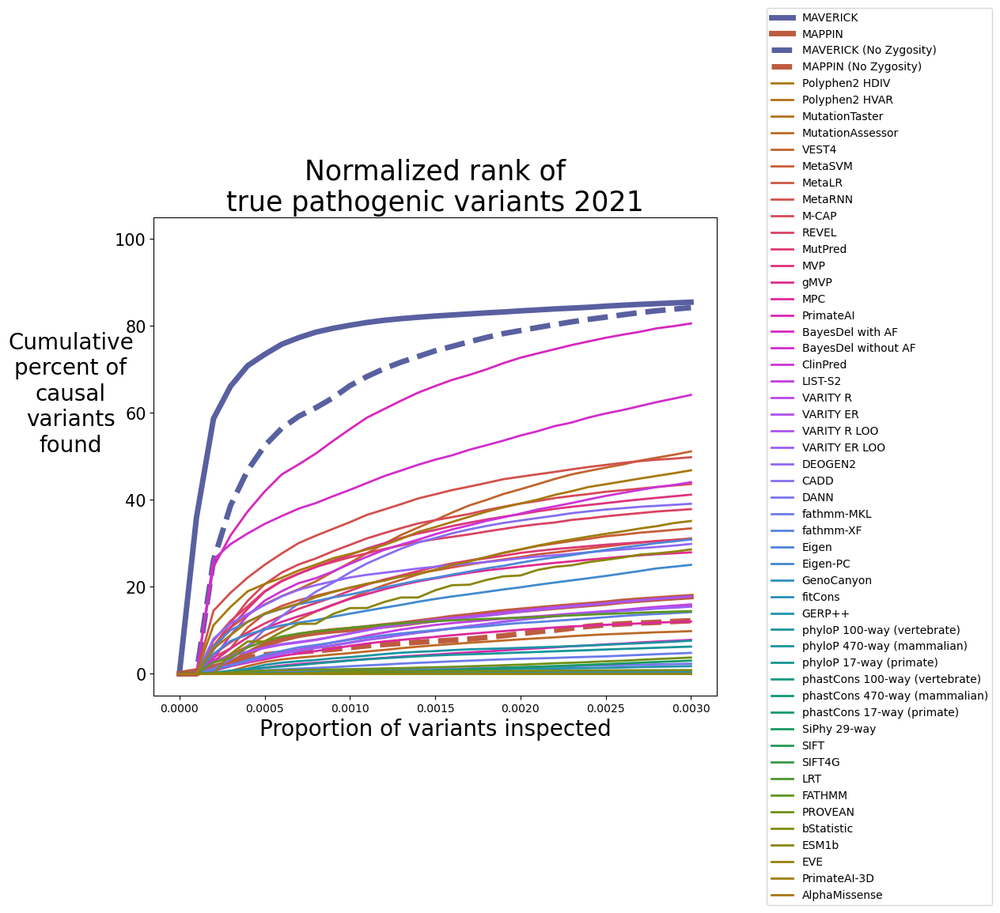

In [78]:
database2021=pandas.read_csv('Results/2021_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')

plotRanksNorm(database2021,description="Normalized rank of\ntrue pathogenic variants 2021",
            fileName='2021_107Samples_normalizedRanks0.3Percent.png',maxSize=0.003)

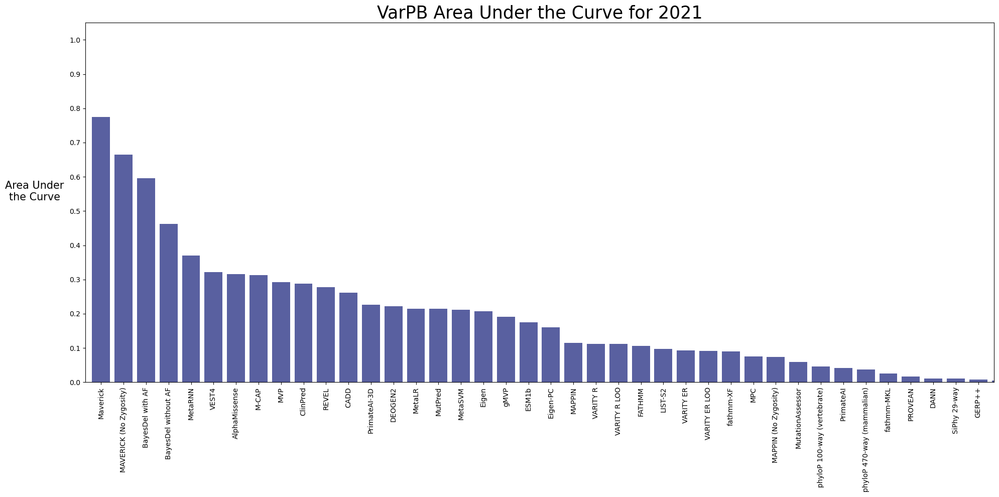

In [79]:
plotAUCScores(database2021,description="VarPB Area Under the Curve for 2021",
              fileName='AUC_barplots_2021_107Samples_normalizedRanks0.3Percent.png',maxSize=0.003)

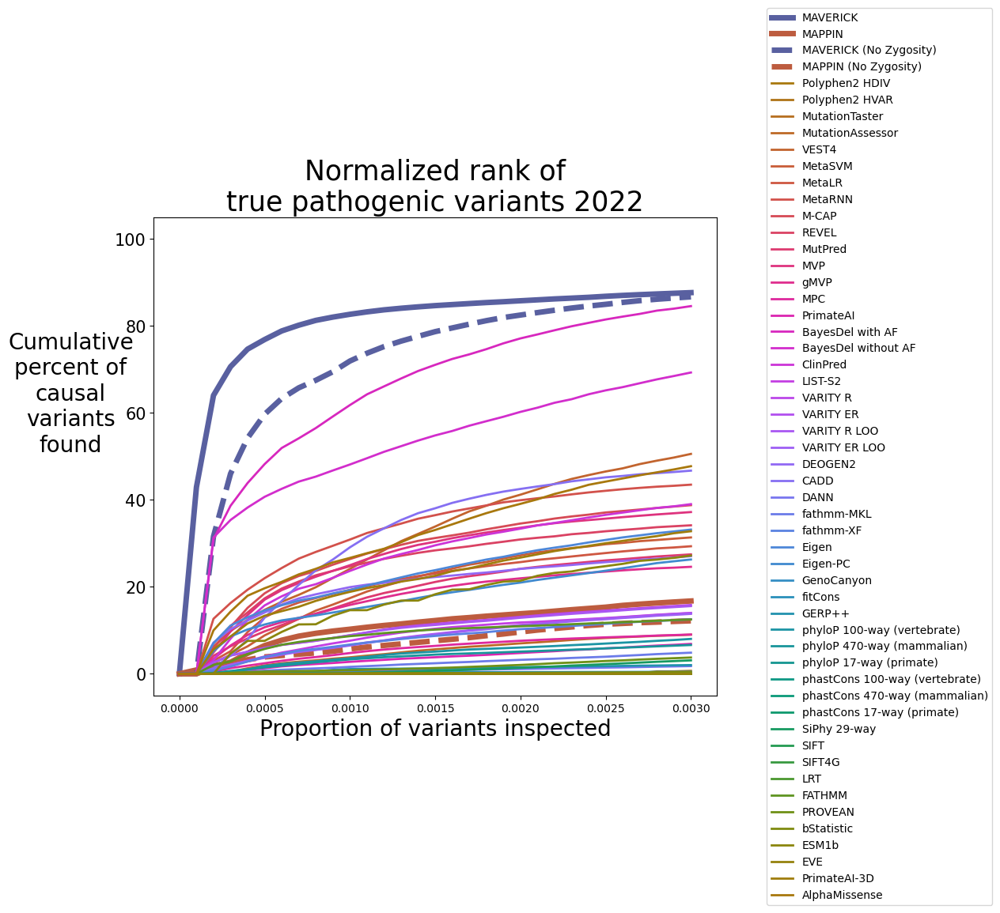

In [80]:
database2022=pandas.read_csv('Results/2022_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')

plotRanksNorm(database2022,description="Normalized rank of\ntrue pathogenic variants 2022",
            fileName='2022_107Samples_normalizedRanks0.3Percent.png',maxSize=0.003)

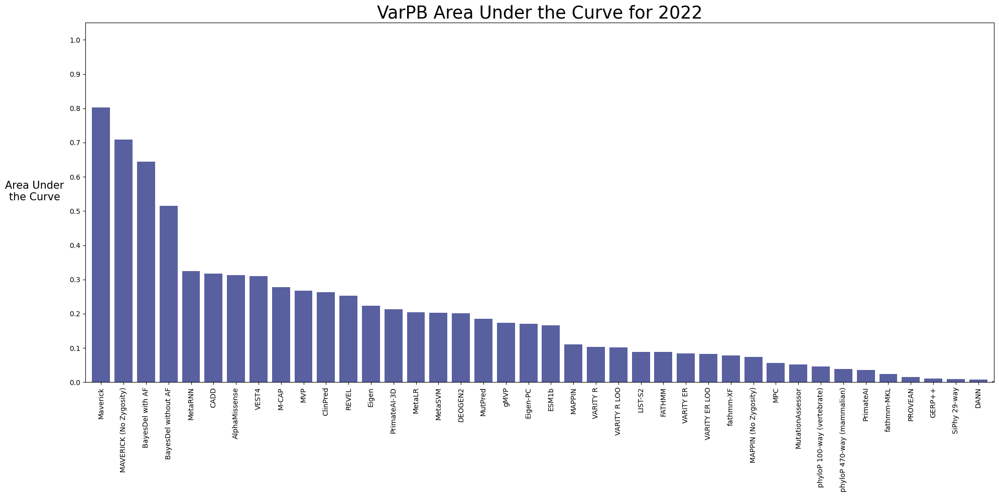

In [81]:
plotAUCScores(database2022,description="VarPB Area Under the Curve for 2022",
              fileName='AUC_barplots_2022_107Samples_normalizedRanks0.3Percent.png',maxSize=0.003)

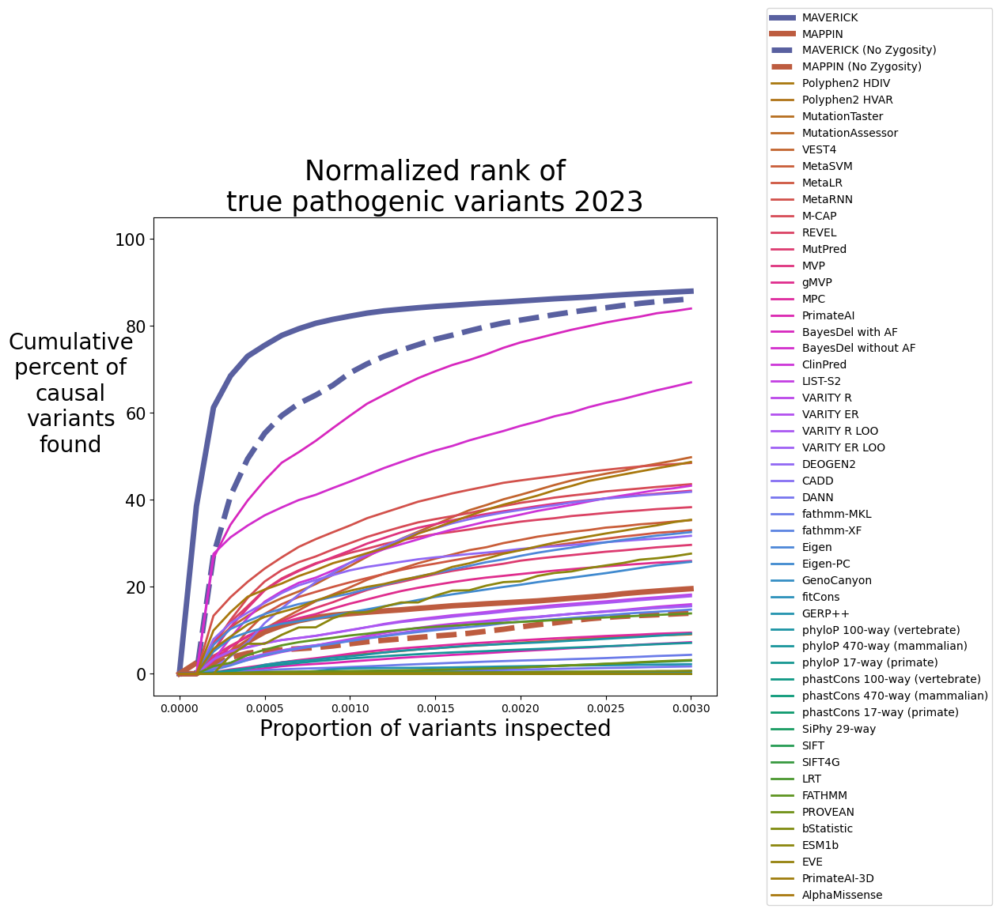

In [82]:
database2023=pandas.read_csv('Results/2023_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')

plotRanksNorm(database2023,description="Normalized rank of\ntrue pathogenic variants 2023",
            fileName='2023_107Samples_normalizedRanks0.3Percent.png',maxSize=0.003)

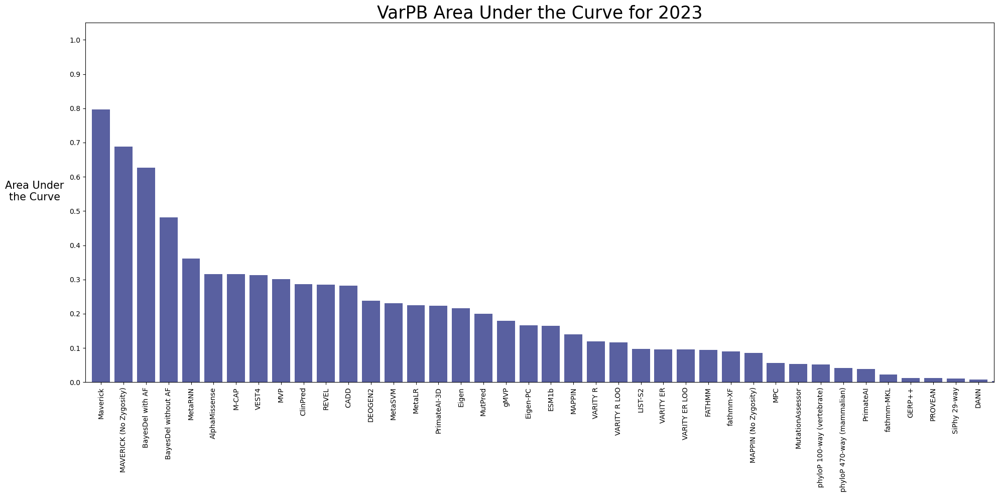

In [83]:
plotAUCScores(database2023,description="VarPB Area Under the Curve for 2023",
              fileName='AUC_barplots_2023_107Samples_normalizedRanks0.3Percent.png',maxSize=0.003)

## plot non-normalized results

In [19]:
# combine the scores into a single database for each year
import pandas
database2021=pandas.read_csv('Results/StandardToolsRanks2021SpikeIns.txt',sep='\t',low_memory=False)
maverickRanksKnown=pandas.read_csv('Results/MaverickRanks2021SpikeIns.txt',sep='\t',low_memory=False)
mappinRanksKnown=pandas.read_csv('Results/MappinRanks2021SpikeIns.txt',sep='\t',low_memory=False)
database2021['Maverick']=maverickRanksKnown.loc[:,'Maverick']
database2021['MAPPIN']=mappinRanksKnown.loc[:,'MAPPIN']
thisToolName='ESM1b'
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2021SpikeIns.txt',sep='\t',low_memory=False)
database2021[thisToolName]=thisTool.loc[:,thisToolName]
thisToolName='EVE'
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2021SpikeIns.txt',sep='\t',low_memory=False)
database2021[thisToolName]=thisTool.loc[:,thisToolName]
thisToolName='PrimateAI3D'
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2021SpikeIns.txt',sep='\t',low_memory=False)
database2021[thisToolName]=thisTool.loc[:,thisToolName]
thisToolName='AlphaMissense'
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2021SpikeIns.txt',sep='\t',low_memory=False)
database2021[thisToolName]=thisTool.loc[:,thisToolName]
database2021.to_csv('Results/2021_combinedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2022=pandas.read_csv('Results/StandardToolsRanks2022SpikeIns.txt',sep='\t',low_memory=False)
maverickRanksKnown=pandas.read_csv('Results/MaverickRanks2022SpikeIns.txt',sep='\t',low_memory=False)
mappinRanksKnown=pandas.read_csv('Results/MappinRanks2022SpikeIns.txt',sep='\t',low_memory=False)
database2022['Maverick']=maverickRanksKnown.loc[:,'Maverick']
database2022['MAPPIN']=mappinRanksKnown.loc[:,'MAPPIN']
thisToolName='ESM1b'
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2022SpikeIns.txt',sep='\t',low_memory=False)
database2022[thisToolName]=thisTool.loc[:,thisToolName]
thisToolName='EVE'
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2022SpikeIns.txt',sep='\t',low_memory=False)
database2022[thisToolName]=thisTool.loc[:,thisToolName]
thisToolName='PrimateAI3D'
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2022SpikeIns.txt',sep='\t',low_memory=False)
database2022[thisToolName]=thisTool.loc[:,thisToolName]
thisToolName='AlphaMissense'
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2022SpikeIns.txt',sep='\t',low_memory=False)
database2022[thisToolName]=thisTool.loc[:,thisToolName]
database2022.to_csv('Results/2022_combinedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2023=pandas.read_csv('Results/StandardToolsRanks2023SpikeIns.txt',sep='\t',low_memory=False)
maverickRanksKnown=pandas.read_csv('Results/MaverickRanks2023SpikeIns.txt',sep='\t',low_memory=False)
mappinRanksKnown=pandas.read_csv('Results/MappinRanks2023SpikeIns.txt',sep='\t',low_memory=False)
database2023['Maverick']=maverickRanksKnown.loc[:,'Maverick']
database2023['MAPPIN']=mappinRanksKnown.loc[:,'MAPPIN']
thisToolName='ESM1b'
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2023SpikeIns.txt',sep='\t',low_memory=False)
database2023[thisToolName]=thisTool.loc[:,thisToolName]
thisToolName='EVE'
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2023SpikeIns.txt',sep='\t',low_memory=False)
database2023[thisToolName]=thisTool.loc[:,thisToolName]
thisToolName='PrimateAI3D'
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2023SpikeIns.txt',sep='\t',low_memory=False)
database2023[thisToolName]=thisTool.loc[:,thisToolName]
thisToolName='AlphaMissense'
thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks2023SpikeIns.txt',sep='\t',low_memory=False)
database2023[thisToolName]=thisTool.loc[:,thisToolName]
database2023.to_csv('Results/2023_combinedResults.txt.gz',sep='\t',index=False,compression='gzip')


In [84]:
import matplotlib.pyplot as plt
import cmocean
import numpy as np
import pandas
import scipy.stats
import sklearn
import sklearn.metrics
standardToolsNameConverter={'Polyphen2_HDIV_score':'Polyphen2 HDIV','Polyphen2_HVAR_score':'Polyphen2 HVAR','MutationTaster_score':'MutationTaster','VEST4_score':'VEST4',
                            'MetaSVM_score':'MetaSVM','MetaLR_score':'MetaLR','M-CAP_score':'M-CAP','REVEL_score':'REVEL','MutPred_score':'MutPred','MVP_score':'MVP','MPC_score':'MPC',
                            'PrimateAI_score':'PrimateAI','DEOGEN2_score':'DEOGEN2','CADD_raw':'CADD','DANN_score':'DANN','fathmm-MKL_coding_score':'fathmm-MKL','fathmm-XF_coding_score':'fathmm-XF',
                            'GenoCanyon_score':'GenoCanyon','integrated_fitCons_score':'fitCons','GERP++_RS':'GERP++','phyloP100way_vertebrate':'phyloP 100-way (vertebrate)',
                            'phyloP470way_mammalian':'phyloP 470-way (mammalian)','phyloP17way_primate':'phyloP 17-way (primate)','phastCons100way_vertebrate':'phastCons 100-way (vertebrate)',
                            'phastCons470way_mammalian':'phastCons 470-way (mammalian)','phastCons17way_primate':'phastCons 17-way (primate)','SiPhy_29way_logOdds':'SiPhy 29-way',
                            'SIFT_score':'SIFT','SIFT4G_score':'SIFT4G','LRT_score':'LRT','FATHMM_score':'FATHMM','PROVEAN_score':'PROVEAN','bStatistic':'bStatistic',
                            'MutationAssessor_score':'MutationAssessor','Eigen-raw_coding':'Eigen','Eigen-PC-raw_coding':'Eigen-PC','Maverick_noZygosity':'MAVERICK (No Zygosity)',
                            'MAPPIN_noZygosity':'MAPPIN (No Zygosity)','BayesDel_addAF_score':'BayesDel with AF','BayesDel_noAF_score':'BayesDel without AF','ClinPred_score':'ClinPred',
                            'LIST-S2_score':'LIST-S2','VARITY_R_score':'VARITY R','VARITY_ER_score':'VARITY ER','VARITY_R_LOO_score':'VARITY R LOO','VARITY_ER_LOO_score':'VARITY ER LOO',
                            'AlphaMissense':'AlphaMissense','gMVP_score':'gMVP','MetaRNN_score':'MetaRNN','ESM1b':'ESM1b','Maverick':'Maverick','MAPPIN':'MAPPIN',
                            'EVE':'EVE','PrimateAI3D':'PrimateAI-3D'}
    
def plotRanksNonNorm(inputRanks,description='Known Genes',fileName='tmp.png',maxSize=100):
    totalSites=len(inputRanks)
    plt.figure(figsize=(15, 10))
    #hsv=plt.get_cmap('hsv')
    # drop Maverick and Mappin and their NZ versions from the standard set
    standardRanksData=inputRanks.drop(columns=['Maverick_noZygosity','MAPPIN_noZygosity','Maverick','MAPPIN'])
    cm=cmocean.cm.phase
    x=np.arange(0,maxSize+1,maxSize/20)
    yMaverick=np.zeros((len(x)))
    yMappin=np.zeros((len(x)))
    yMaverickNZ=np.zeros((len(x)))
    yMappinNZ=np.zeros((len(x)))
    standardToolsList=standardRanksData.columns.values
    yStandardTools=np.zeros((len(x),len(standardToolsList)))
    for i in range(len(x)):
        yMaverick[i]=100*len(inputRanks.loc[((inputRanks['Maverick']>0) & (inputRanks['Maverick']<=x[i])),:])/len(inputRanks.loc[(inputRanks['Maverick']>0),:])
        yMappin[i]=100*len(inputRanks.loc[((inputRanks['MAPPIN']>0) & (inputRanks['MAPPIN']<=x[i])),:])/len(inputRanks.loc[(inputRanks['MAPPIN']>0),:])
        for j in range(len(standardToolsList)):
            yStandardTools[i,j]=100*len(standardRanksData.loc[((standardRanksData[standardToolsList[j]]>0) & (standardRanksData[standardToolsList[j]]<=x[i])),:])/len(standardRanksData.loc[(standardRanksData[standardToolsList[j]]>0),:])
        yMaverickNZ[i]=100*len(inputRanks.loc[((inputRanks['Maverick_noZygosity']>0) & (inputRanks['Maverick_noZygosity']<=x[i])),:])/len(inputRanks.loc[(inputRanks['Maverick_noZygosity']>0),:])
        yMappinNZ[i]=100*len(inputRanks.loc[((inputRanks['MAPPIN_noZygosity']>0) & (inputRanks['MAPPIN_noZygosity']<=x[i])),:])/len(inputRanks.loc[(inputRanks['MAPPIN_noZygosity']>0),:])
    plt.plot(x,yMaverick,color="#5960a0", linewidth=5,label='MAVERICK')
    plt.plot(x,yMappin,color="#bd5c3f", linewidth=5,label='MAPPIN')
    plt.plot(x,yMaverickNZ,color="#5960a0",linestyle='dashed', linewidth=5,label='MAVERICK (No Zygosity)')
    plt.plot(x,yMappinNZ,color="#bd5c3f",linestyle='dashed', linewidth=5,label='MAPPIN (No Zygosity)')
    for i in range(len(standardToolsList)):
        plt.plot(x,yStandardTools[:,i],linewidth=2,label=standardToolsNameConverter[standardToolsList[i]],color=cm(float(i)/(len(standardToolsList)-1)))
    plt.ylim([-5,105])
    #plt.xticks([0,0.0002,0.0004,0.0006,0.0008,0.001,0.0012,0.0014],fontsize=15)
    plt.yticks([0,20,40,60,80,100],fontsize=15)
    plt.title(description,fontsize=25)
    plt.ylabel('Cumulative\npercent of\ncausal\nvariants\nfound',fontsize=20,rotation=0,labelpad=40)
    plt.xlabel('Proportion of variants inspected',fontsize=20)
    plt.legend(bbox_to_anchor=(1.5, 0.5),loc="right",fontsize=10)
    plt.tight_layout()
    plt.savefig(fileName,bbox_inches='tight',dpi=600)
    

def plotAUCScoresNonNorm(inputRanks,description='Known Genes',fileName='tmp.png',maxSize=20):
    x=np.arange(0,maxSize+1)
    totalSites=len(inputRanks)
    standardToolsList=inputRanks.columns.values
    y=np.zeros((len(x),len(inputRanks)))
    yLabels=[]
    for i in range(len(standardToolsList)):
        yLabels.append(standardToolsNameConverter[standardToolsList[i]])
    for i in range(len(x)):
        for j in range(len(standardToolsList)):
            y[i,j]=len(inputRanks.loc[((inputRanks[standardToolsList[j]]>0) & (inputRanks[standardToolsList[j]]<=x[i])),:])/len(inputRanks.loc[(inputRanks[standardToolsList[j]]>0),:])
    aucs=np.zeros(len(standardToolsList))
    for i in range(len(standardToolsList)):
        aucs[i]=np.round(sklearn.metrics.auc(x/maxSize,y[:,i]),4)
    
    sortOrder=scipy.stats.rankdata(-aucs,method='ordinal')-1
    aucs2=np.zeros(len(aucs))
    yLabels2=[]
    for i in range(len(aucs)):
        aucs2[i]=aucs[np.where(sortOrder==i)[0][0]]
        yLabels2.append(yLabels[np.where(sortOrder==i)[0][0]])
    plt.figure(figsize=(20, 10))
    x=np.arange(len(aucs2))
    plt.bar(x,aucs2,align='center',color="#5960a0")
    plt.xticks(x,yLabels2,fontsize=10,rotation=90)
    plt.ylim([0,1.05])
    plt.xlim([-0.7,39.7])
    plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=10)
    plt.ylabel('Area Under\nthe Curve',fontsize=15,rotation=0,labelpad=50)
    plt.title(description,fontsize=25)
    plt.tight_layout()
    plt.savefig(fileName,bbox_inches='tight',dpi=600)

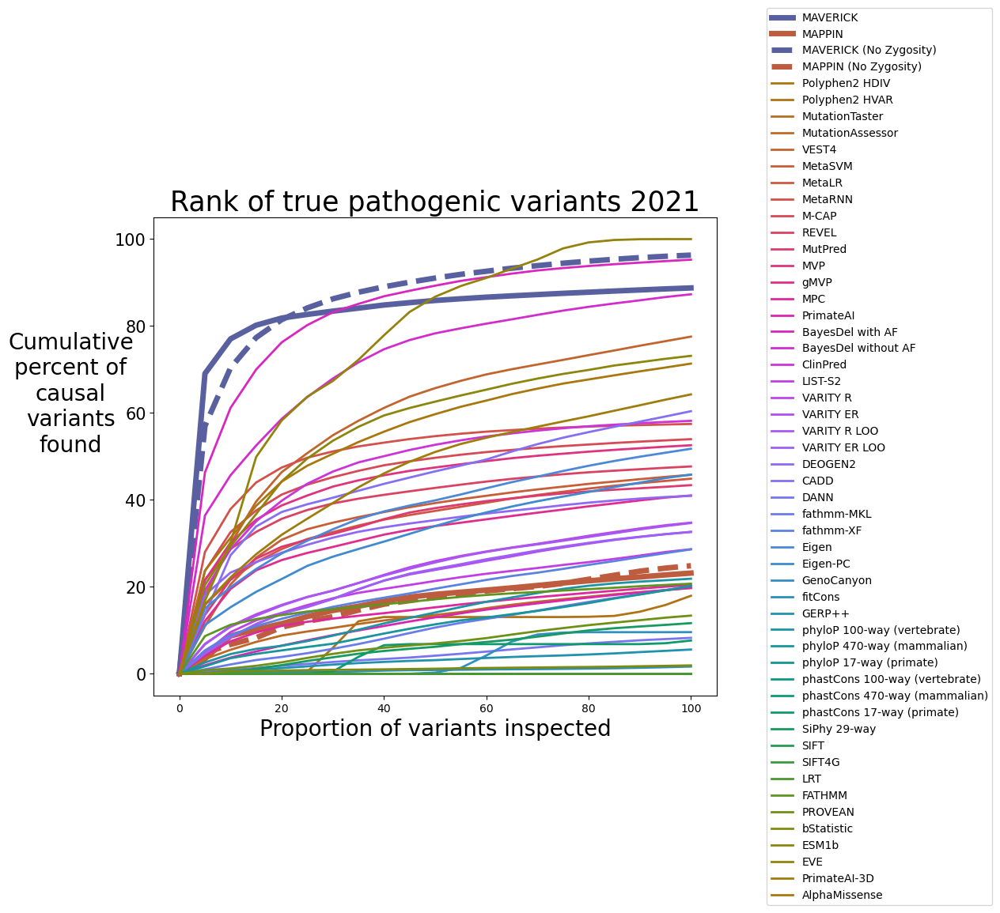

In [85]:
database2021=pandas.read_csv('Results/2021_combinedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')

plotRanksNonNorm(database2021,description="Rank of true pathogenic variants 2021",
            fileName='2021_107Samples_ranks100.png',maxSize=100)

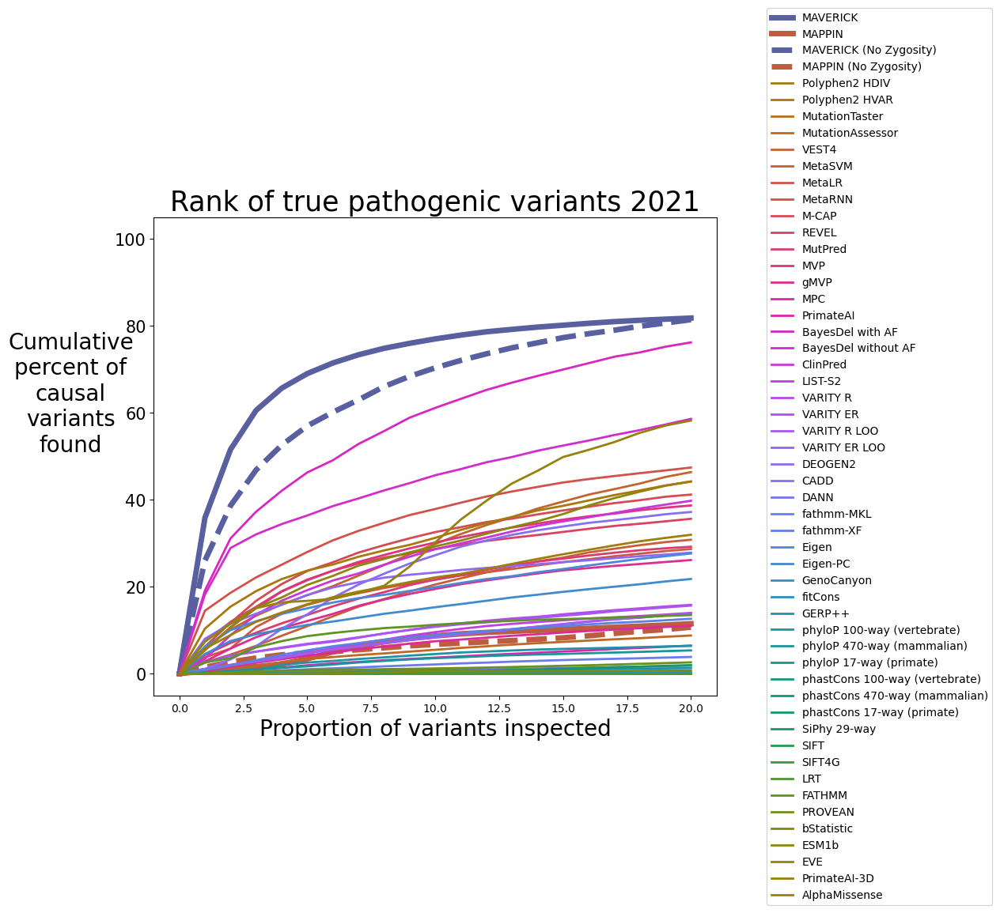

In [86]:
plotRanksNonNorm(database2021,description="Rank of true pathogenic variants 2021",
            fileName='2021_107Samples_ranks20.png',maxSize=20)

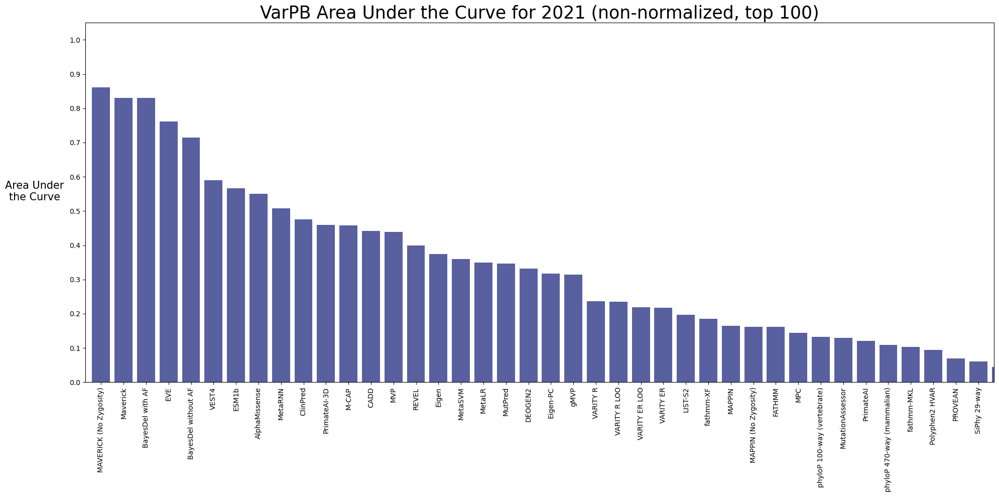

In [87]:
plotAUCScoresNonNorm(database2021,description="VarPB Area Under the Curve for 2021 (non-normalized, top 100)",
              fileName='AUC_barplots_2021_107Samples_ranks100.png',maxSize=100)

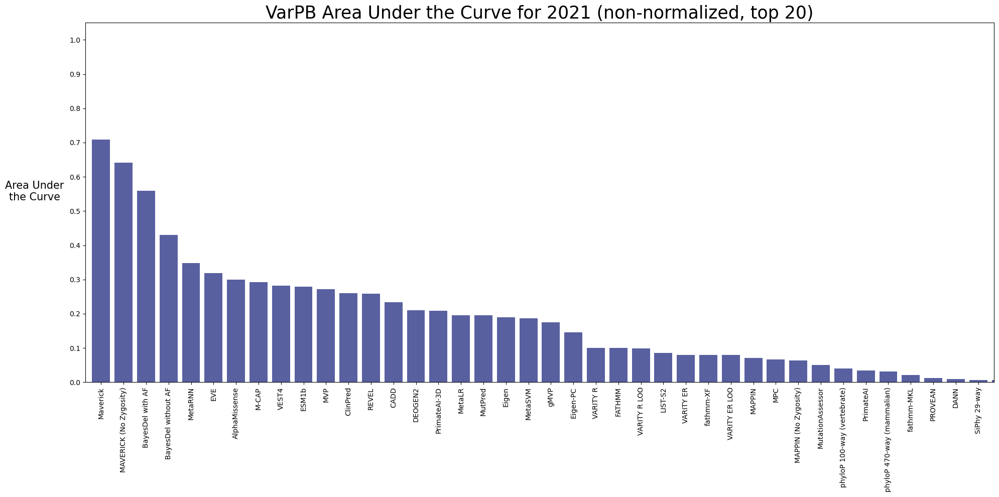

In [88]:
plotAUCScoresNonNorm(database2021,description="VarPB Area Under the Curve for 2021 (non-normalized, top 20)",
              fileName='AUC_barplots_2021_107Samples_ranks20.png',maxSize=20)

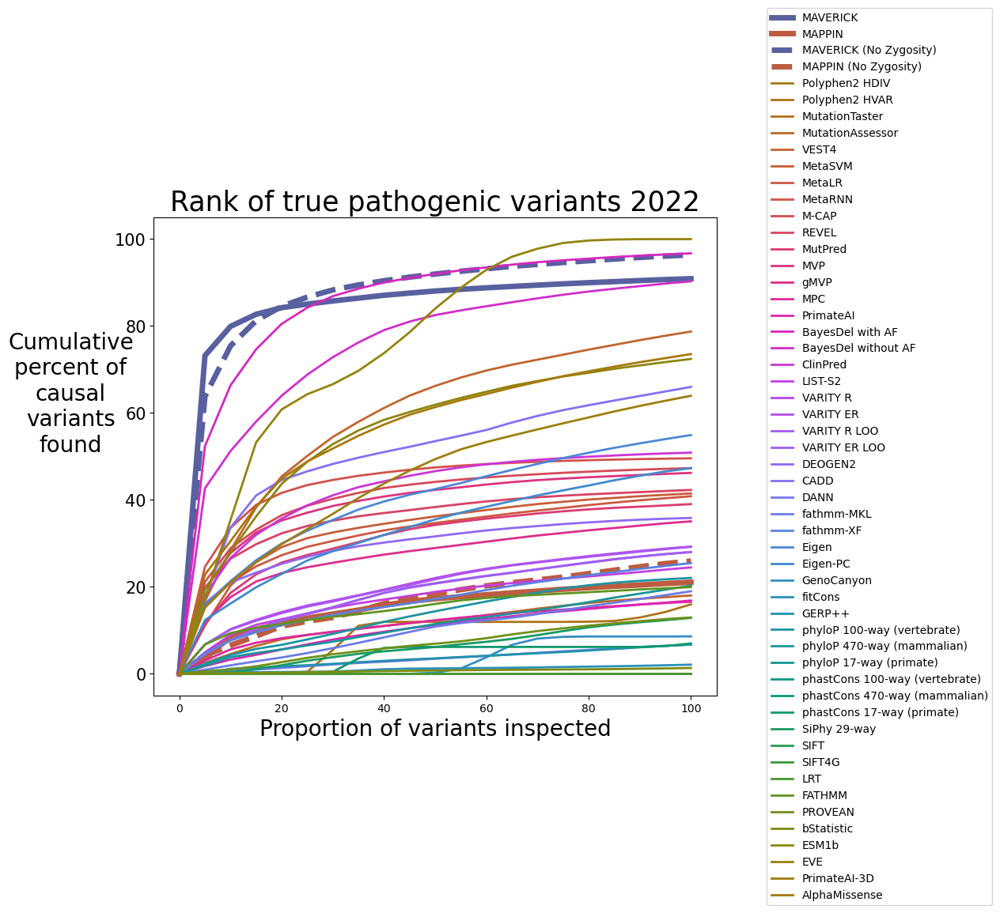

In [89]:
database2022=pandas.read_csv('Results/2022_combinedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')

plotRanksNonNorm(database2022,description="Rank of true pathogenic variants 2022",
            fileName='2022_107Samples_ranks100.png',maxSize=100)

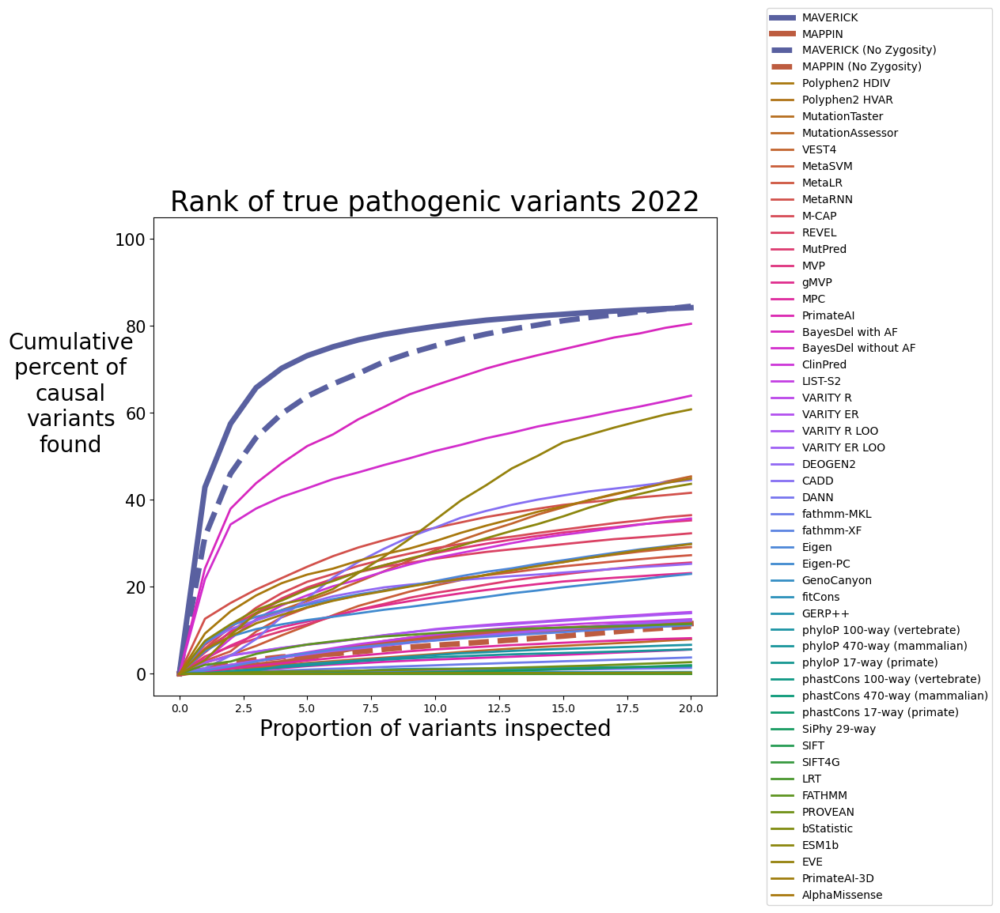

In [90]:
plotRanksNonNorm(database2022,description="Rank of true pathogenic variants 2022",
            fileName='2022_107Samples_ranks20.png',maxSize=20)

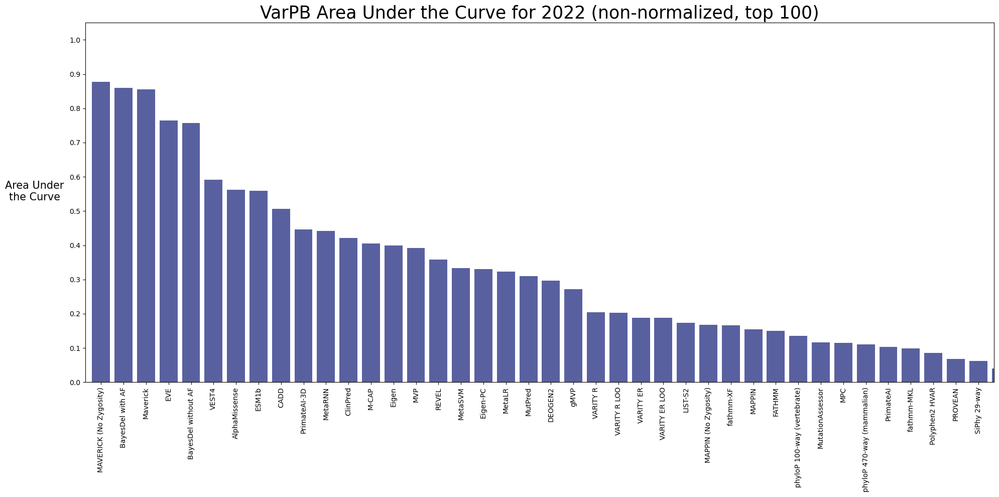

In [91]:
plotAUCScoresNonNorm(database2022,description="VarPB Area Under the Curve for 2022 (non-normalized, top 100)",
              fileName='AUC_barplots_2022_107Samples_ranks100.png',maxSize=100)

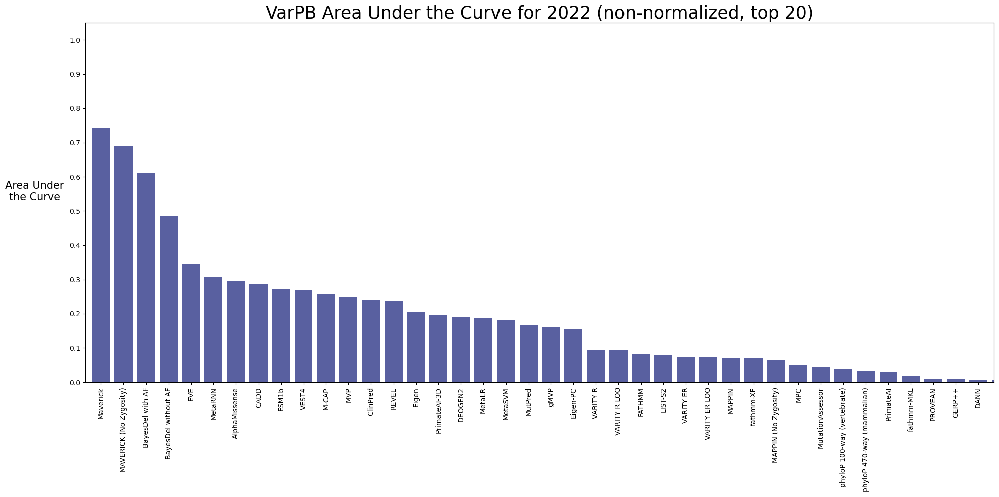

In [92]:
plotAUCScoresNonNorm(database2022,description="VarPB Area Under the Curve for 2022 (non-normalized, top 20)",
              fileName='AUC_barplots_2022_107Samples_ranks20.png',maxSize=20)

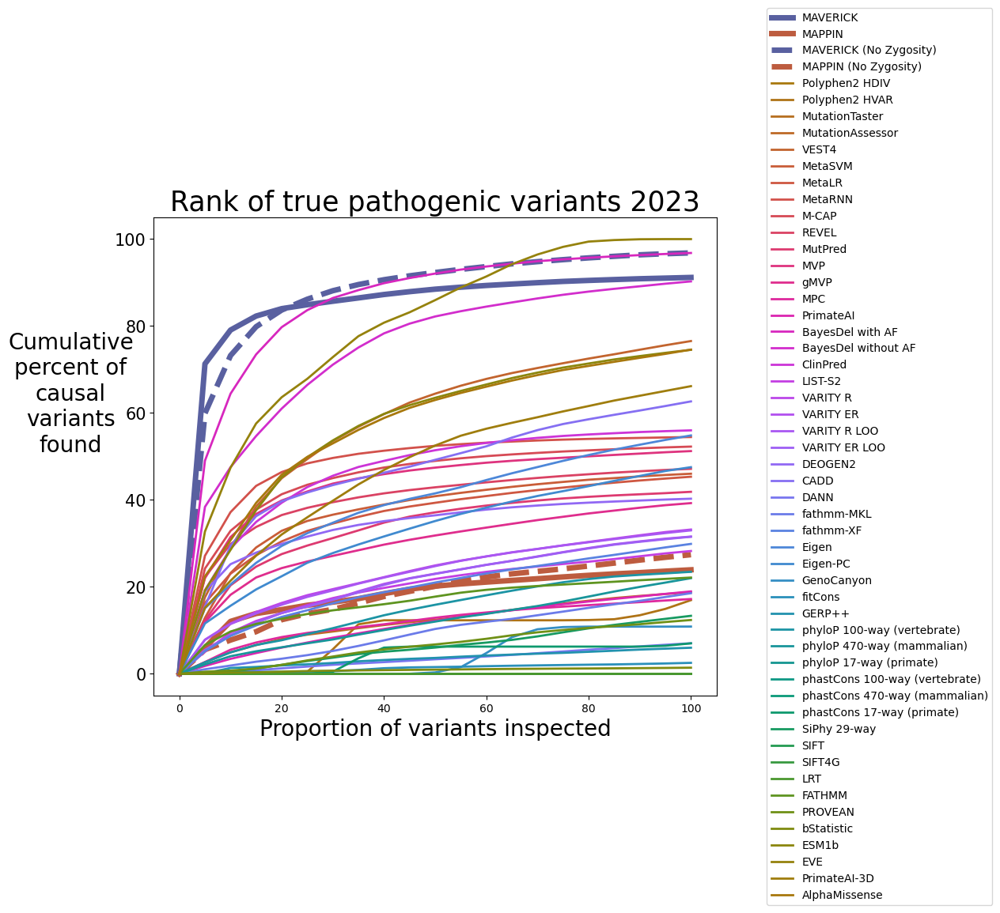

In [93]:
database2023=pandas.read_csv('Results/2023_combinedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')

plotRanksNonNorm(database2023,description="Rank of true pathogenic variants 2023",
            fileName='2023_107Samples_ranks100.png',maxSize=100)

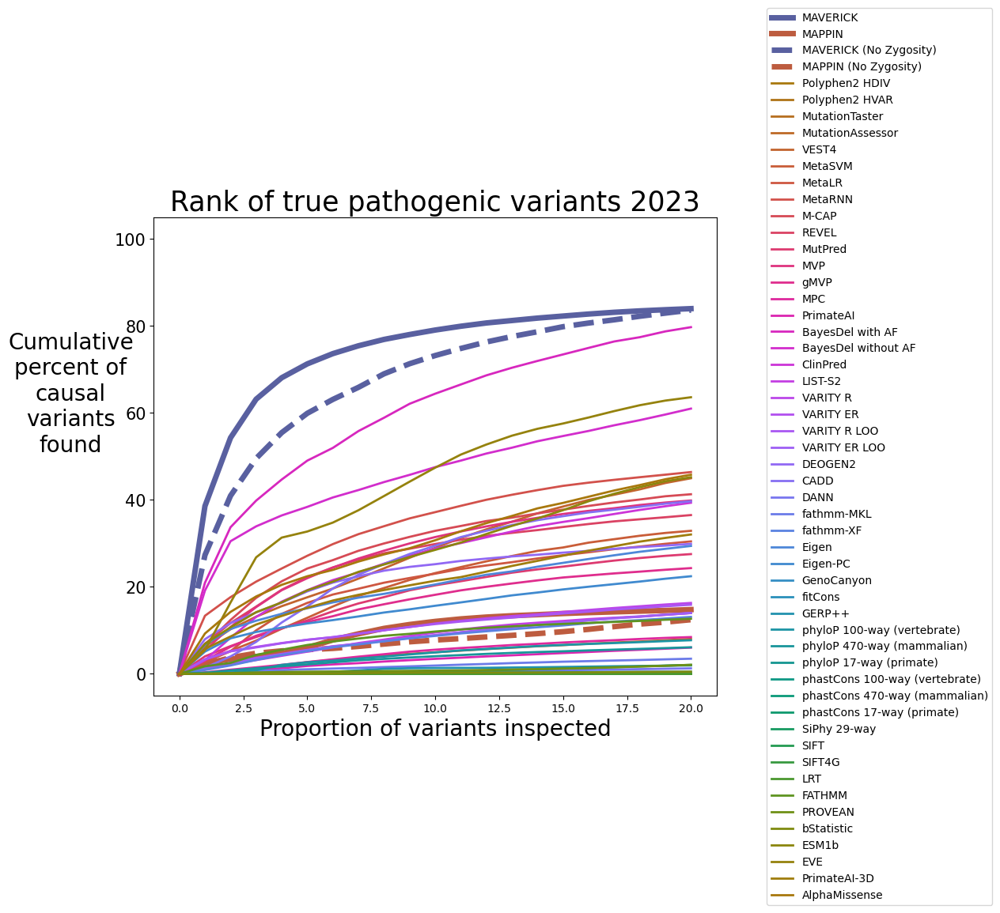

In [94]:
plotRanksNonNorm(database2023,description="Rank of true pathogenic variants 2023",
            fileName='2023_107Samples_ranks20.png',maxSize=20)

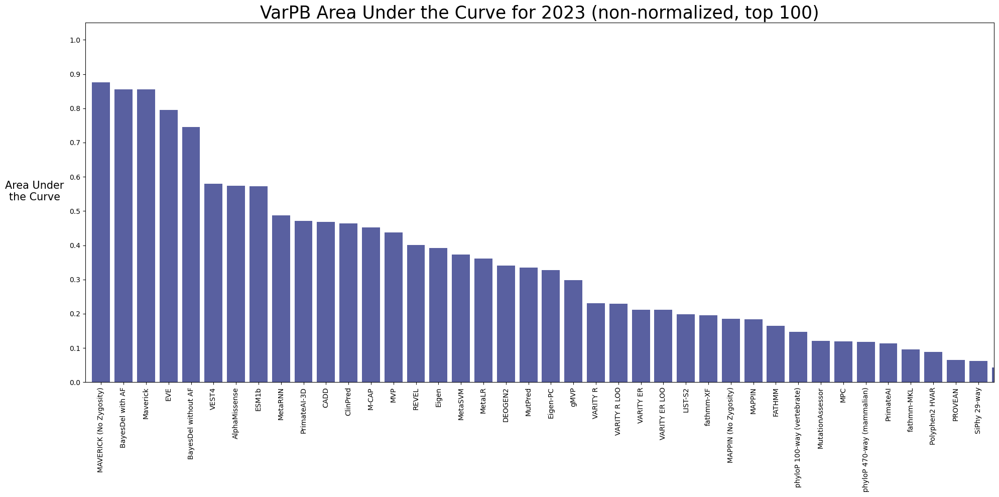

In [95]:
plotAUCScoresNonNorm(database2023,description="VarPB Area Under the Curve for 2023 (non-normalized, top 100)",
              fileName='AUC_barplots_2023_107Samples_ranks100.png',maxSize=100)

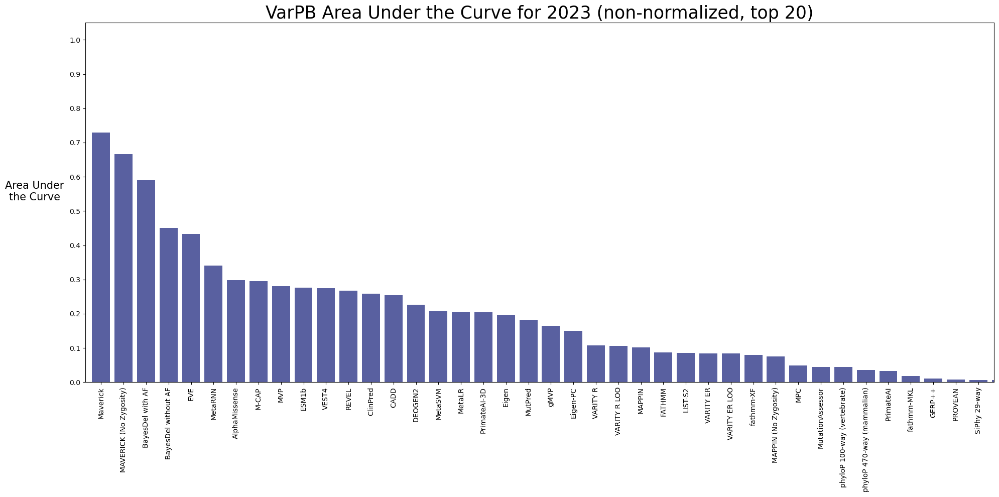

In [96]:
plotAUCScoresNonNorm(database2023,description="VarPB Area Under the Curve for 2023 (non-normalized, top 20)",
              fileName='AUC_barplots_2023_107Samples_ranks20.png',maxSize=20)

# Score 2017, 2018, 2019, and 2020 

## Process dbNSFP output

In [1]:
# Groom the dbNSFP output and merge on Maverick and MAPPIN scores
import pandas
fullListSNVs=pandas.read_csv('variantScores/clinvar_2017-2020_variants_dbNSFPScores.txt',sep='\t',low_memory=False)

# autosomal only
fullListSNVs=fullListSNVs.loc[~(fullListSNVs['hg19_chr'].isin(['X','Y'])),:].reset_index(drop=True)
fullListSNVs['hg19_chr']=fullListSNVs.loc[:,'hg19_chr'].astype(int)

# combine on the Maverick and MAPPIN
maverick=pandas.read_csv('MaverickResults_allSNVs_GRCh37.txt',sep='\t',low_memory=False)
maverick=maverick.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','geneName','proteinChange','Maverick_BenignScore','Maverick_DomScore','Maverick_RecScore']]
fullListSNVs=fullListSNVs.merge(maverick,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
mappin=pandas.read_csv('hg19.nsSNV.mappin.prediction.scores',sep='\t',low_memory=False)
mappin=mappin.loc[:,['#CHR','POS','BENIGN_SCORE','DOMINANT_SCORE','RECESSIVE_SCORE']].rename(columns={'#CHR':'hg19_chr','POS':'hg19_pos(1-based)','BENIGN_SCORE':'MAPPIN_Benign','DOMINANT_SCORE':'MAPPIN_Dominant','RECESSIVE_SCORE':'MAPPIN_Recessive'})
mappin=mappin.loc[~(mappin['hg19_chr'].isin(['chrX','chrY','chrMT','chrM'])),:]
mappin['hg19_chr']=mappin.loc[:,'hg19_chr'].str[3:].astype(int)
fullListSNVs=fullListSNVs.merge(mappin,how='inner',on=['hg19_chr','hg19_pos(1-based)'])
fullListSNVs.to_csv('variantScores/clinvar_2017-2020_variants_dbNSFPScores_v2.txt',sep='\t',index=False)
fullListSNVs


,#chr,hg19_chr,hg19_pos(1-based),ref,alt,SIFT_score,SIFT4G_score,Polyphen2_HDIV_score,Polyphen2_HVAR_score,LRT_score,...,SiPhy_29way_logOdds,bStatistic,geneName,proteinChange,Maverick_BenignScore,Maverick_DomScore,Maverick_RecScore,MAPPIN_Benign,MAPPIN_Dominant,MAPPIN_Recessive
0,1,1,980867,C,T,.;.,.;.,.;.,.;.,0.000003,...,19.0743,940,AGRN,p.R834X,0.001948,0.227668,0.770384,0.02240,0.42920,0.54840
1,1,1,1460622,T,G,0.0;0.0;0.0;0.001,0.001;0.001;0.0;0.0,.;1.0;.;.,.;0.999;.;.,0.000000,...,13.6601,846,ATAD3A,p.L454R,0.039104,0.170718,0.790179,0.03205,0.38935,0.57860
2,1,1,1470999,C,T,0.007;0.007,0.021;0.021,0.994;0.994,0.677;0.677,.,...,14.2456,840,TMEM240,p.V115M,0.953212,0.000142,0.046647,0.04835,0.44795,0.50370
3,1,1,1737942,A,G,.;0.0;0.0;0.0;0.0,0.025;0.025;.;.;.,0.989;0.989;.;.;.,0.999;0.999;.;.;.,0.000000,...,10.7015,730,GNB1,p.I80T,0.122498,0.843954,0.033549,0.00530,0.93925,0.05545
4,1,1,1737951,C,G,.;0.001;0.002;0.002;0.002,0.003;0.003;.;.;.,0.984;0.984;.;.;.,0.913;0.913;.;.;.,0.000000,...,18.734,730,GNB1,p.G77A,0.011910,0.961898,0.026192,0.00415,0.94365,0.05220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,9,9,140693325,C,T,.;.;.;.;.,.;.;.;.;.,.;.;.;.;.,.;.;.;.;.,0.000017,...,14.4615,994,EHMT1,p.Q856X,0.000670,0.990515,0.008815,0.02150,0.72930,0.24920
10750,9,9,140707848,C,T,.;.;.,.;.;.,.;.;.,.;.;.,0.000010,...,14.81,994,EHMT1,p.R1016X,0.001017,0.988541,0.010442,0.02445,0.71965,0.25590
10751,9,9,140710483,T,G,0.0;.,0.007;.,1.0;.,1.0;.,0.000000,...,14.9074,994,EHMT1,p.C1115G,0.002054,0.984776,0.013170,0.02380,0.72670,0.24950
10752,9,9,140728838,G,A,0.0;.,0.002;.,1.0;.,1.0;.,0.000001,...,19.6825,994,EHMT1,p.G1193E,0.005736,0.963011,0.031252,0.02150,0.72960,0.24890


In [23]:
import pandas
fullListSNVs=pandas.read_csv('variantScores/clinvar_2017-2020_variants_dbNSFPScores_v2.txt',sep='\t',low_memory=False)
# split the set into maxes and mins
maxes=fullListSNVs.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','Polyphen2_HDIV_score','Polyphen2_HVAR_score','MutationTaster_score','MutationAssessor_score','VEST4_score',
                          'MetaSVM_score','MetaLR_score','MetaRNN_score','M-CAP_score','REVEL_score','MutPred_score','MVP_score','gMVP_score','MPC_score','PrimateAI_score','DEOGEN2_score',
                          'BayesDel_addAF_score','BayesDel_noAF_score','ClinPred_score','LIST-S2_score','VARITY_R_score','VARITY_ER_score','VARITY_R_LOO_score','VARITY_ER_LOO_score',
                          'CADD_raw','DANN_score','fathmm-MKL_coding_score','fathmm-XF_coding_score','Eigen-raw_coding','Eigen-PC-raw_coding','GenoCanyon_score',
                          'integrated_fitCons_score','GERP++_RS','phyloP100way_vertebrate','phyloP470way_mammalian','phyloP17way_primate','phastCons100way_vertebrate',
                          'phastCons470way_mammalian','phastCons17way_primate','SiPhy_29way_logOdds']].reset_index(drop=True)
mins=fullListSNVs.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','SIFT_score','SIFT4G_score','LRT_score','FATHMM_score','PROVEAN_score','bStatistic']].reset_index(drop=True)
zygosity=fullListSNVs.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','Aloft_prob_Tolerant','Aloft_prob_Recessive','Aloft_prob_Dominant','Maverick_BenignScore','Maverick_DomScore','Maverick_RecScore','MAPPIN_Benign','MAPPIN_Dominant','MAPPIN_Recessive']].reset_index(drop=True)



In [24]:
for col in ['Polyphen2_HDIV_score','Polyphen2_HVAR_score','MutationTaster_score','MutationAssessor_score','VEST4_score',
                          'MetaSVM_score','MetaLR_score','MetaRNN_score','M-CAP_score','REVEL_score','MutPred_score','MVP_score','gMVP_score','MPC_score','PrimateAI_score','DEOGEN2_score',
                          'BayesDel_addAF_score','BayesDel_noAF_score','ClinPred_score','LIST-S2_score','VARITY_R_score','VARITY_ER_score','VARITY_R_LOO_score','VARITY_ER_LOO_score',
                          'fathmm-XF_coding_score','Eigen-raw_coding','Eigen-PC-raw_coding',
                          'phyloP470way_mammalian','SiPhy_29way_logOdds']:
    maxes[col]=maxes.loc[:,col].str.split(';',expand=True).replace('',-1000).replace('.',-1000).fillna(-1000).astype(float).max(axis=1)
maxes


,hg19_chr,hg19_pos(1-based),ref,alt,Polyphen2_HDIV_score,Polyphen2_HVAR_score,MutationTaster_score,MutationAssessor_score,VEST4_score,MetaSVM_score,...,GenoCanyon_score,integrated_fitCons_score,GERP++_RS,phyloP100way_vertebrate,phyloP470way_mammalian,phyloP17way_primate,phastCons100way_vertebrate,phastCons470way_mammalian,phastCons17way_primate,SiPhy_29way_logOdds
0,1,980867,C,T,-1000.000,-1000.000,1.000000,-1000.000,0.827,-1000.0000,...,1.000000,0.706548,5.36,5.673,7.590,0.599,1.000,1.0,0.953,19.0743
1,1,1460622,T,G,1.000,0.999,1.000000,2.035,0.931,0.9065,...,0.990220,0.706548,4.84,6.290,7.692,0.568,1.000,1.0,0.091,13.6601
2,1,1470999,C,T,0.994,0.677,0.999641,0.695,0.640,-0.7944,...,1.000000,0.634777,3.36,2.753,7.505,0.587,0.989,1.0,0.853,14.2456
3,1,1737942,A,G,0.989,0.999,1.000000,2.250,0.963,-0.4057,...,0.999976,0.722319,4.53,9.083,10.971,0.756,1.000,1.0,0.999,10.7015
4,1,1737951,C,G,0.984,0.913,1.000000,1.520,0.821,-0.1361,...,1.000000,0.722319,5.66,7.706,7.509,0.599,1.000,1.0,0.998,18.7340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,9,140693325,C,T,-1000.000,-1000.000,1.000000,-1000.000,0.944,-1000.0000,...,0.999043,0.706548,5.61,2.448,7.377,0.599,0.978,1.0,0.965,14.4615
10750,9,140707848,C,T,-1000.000,-1000.000,1.000000,-1000.000,0.965,-1000.0000,...,0.963465,0.671770,4.08,3.292,4.713,0.599,0.995,1.0,0.800,14.8100
10751,9,140710483,T,G,1.000,1.000,1.000000,4.315,0.952,1.0996,...,1.000000,0.722319,5.11,7.902,7.697,0.609,1.000,1.0,0.801,14.9074
10752,9,140728838,G,A,1.000,1.000,1.000000,3.815,0.982,1.0897,...,1.000000,0.706548,5.63,9.358,11.463,0.676,1.000,1.0,0.373,19.6825


In [25]:
# rescale the columns as needed
# phyloP_100way scores range from -20.0 to 10.003
# phyloP_470way scores range from -20 to 11.936
# phyloP_15way scores range from -13.362 to 0.756
# SiPhy scores range from 0 to 37.9718
# CADD scores range from -6.458163 to 18.301497
# GERP scores range from -12.3 to 6.17
# MetaSVM scores range from -2 to 3
# MPC scores range from 0 to 5
# MutationAssessor scores range from -5.17 to 6.49
# Eigen-raw_coding scores range from -4.155 to 1.323
# Eigen-PC-raw_coding scores range from -4.236 to 1.205
# BayesDel_addAF scores range from -1.11707 to 0.750927
# BayesDel_noAF scores range from -1.31914 to 0.840878
maxes.loc[maxes['CADD_raw']==-1000,'CADD_raw']=-6.458163
maxes.loc[maxes['GERP++_RS']==-1000,'GERP++_RS']=-12.3
maxes.loc[maxes['MetaSVM_score']==-1000,'MetaSVM_score']=-2
maxes.loc[maxes['MPC_score']==-1000,'MPC_score']=0
maxes.loc[maxes['phyloP100way_vertebrate']==-1000,'phyloP100way_vertebrate']=-20
maxes.loc[maxes['phyloP470way_mammalian']==-1000,'phyloP470way_mammalian']=-20
maxes.loc[maxes['phyloP17way_primate']==-1000,'phyloP17way_primate']=-13.362
maxes.loc[maxes['SiPhy_29way_logOdds']==-1000,'SiPhy_29way_logOdds']=0
maxes.loc[maxes['MutationAssessor_score']==-1000,'MutationAssessor_score']=-5.17
maxes.loc[maxes['Eigen-raw_coding']==-1000,'Eigen-raw_coding']=-4.155
maxes.loc[maxes['Eigen-PC-raw_coding']==-1000,'Eigen-PC-raw_coding']=-4.236
maxes.loc[maxes['BayesDel_addAF_score']==-1000,'Eigen-PC-raw_coding']=-1.11707
maxes.loc[maxes['BayesDel_noAF_score']==-1000,'Eigen-PC-raw_coding']=-1.31914
maxes=maxes.replace(-1000,0)
maxes['CADD_raw']=(maxes.loc[:,'CADD_raw']+6.458163)/(18.301497+6.458163)
maxes['GERP++_RS']=(maxes.loc[:,'GERP++_RS']+12.3)/(12.3+6.17)
maxes['MetaSVM_score']=(maxes.loc[:,'MetaSVM_score']+2)/(3+2)
maxes['MPC_score']=(maxes.loc[:,'MPC_score']-0)/(5-0)
maxes['phyloP100way_vertebrate']=(maxes.loc[:,'phyloP100way_vertebrate']+20)/(10.003+20)
maxes['phyloP470way_mammalian']=(maxes.loc[:,'phyloP470way_mammalian']+20)/(11.936+20)
maxes['phyloP17way_primate']=(maxes.loc[:,'phyloP17way_primate'].astype(float)+13.362)/(0.756+13.362)
maxes['SiPhy_29way_logOdds']=(maxes.loc[:,'SiPhy_29way_logOdds'].astype(float)-0)/(37.9718-0)
maxes['MutationAssessor_score']=(maxes.loc[:,'MutationAssessor_score']+5.17)/(6.49+5.17)
maxes['Eigen-raw_coding']=(maxes.loc[:,'Eigen-raw_coding']+4.155)/(1.323+4.155)
maxes['Eigen-PC-raw_coding']=(maxes.loc[:,'Eigen-PC-raw_coding']+4.236)/(1.205+4.236)
maxes['BayesDel_addAF_score']=(maxes.loc[:,'BayesDel_addAF_score']+1.11707)/(0.750927+1.11707)
maxes['BayesDel_noAF_score']=(maxes.loc[:,'BayesDel_noAF_score']+1.31914)/(0.840878+1.31914)
maxes

,hg19_chr,hg19_pos(1-based),ref,alt,Polyphen2_HDIV_score,Polyphen2_HVAR_score,MutationTaster_score,MutationAssessor_score,VEST4_score,MetaSVM_score,...,GenoCanyon_score,integrated_fitCons_score,GERP++_RS,phyloP100way_vertebrate,phyloP470way_mammalian,phyloP17way_primate,phastCons100way_vertebrate,phastCons470way_mammalian,phastCons17way_primate,SiPhy_29way_logOdds
0,1,980867,C,T,0.000,0.000,1.000000,0.000000,0.827,0.00000,...,1.000000,0.706548,0.956145,0.855681,0.863915,0.988879,1.000,1.0,0.953,0.502328
1,1,1460622,T,G,1.000,0.999,1.000000,0.617925,0.931,0.58130,...,0.990220,0.706548,0.927991,0.876246,0.867109,0.986684,1.000,1.0,0.091,0.359743
2,1,1470999,C,T,0.994,0.677,0.999641,0.503002,0.640,0.24112,...,1.000000,0.634777,0.847861,0.758357,0.861254,0.988029,0.989,1.0,0.853,0.375163
3,1,1737942,A,G,0.989,0.999,1.000000,0.636364,0.963,0.31886,...,0.999976,0.722319,0.911207,0.969336,0.969783,1.000000,1.000,1.0,0.999,0.281828
4,1,1737951,C,G,0.984,0.913,1.000000,0.573756,0.821,0.37278,...,1.000000,0.722319,0.972388,0.923441,0.861379,0.988879,1.000,1.0,0.998,0.493366
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,9,140693325,C,T,0.000,0.000,1.000000,0.000000,0.944,0.00000,...,0.999043,0.706548,0.969681,0.748192,0.857246,0.988879,0.978,1.0,0.965,0.380848
10750,9,140707848,C,T,0.000,0.000,1.000000,0.000000,0.965,0.00000,...,0.963465,0.671770,0.886844,0.776322,0.773829,0.988879,0.995,1.0,0.800,0.390026
10751,9,140710483,T,G,1.000,1.000,1.000000,0.813465,0.952,0.61992,...,1.000000,0.722319,0.942610,0.929974,0.867266,0.989588,1.000,1.0,0.801,0.392591
10752,9,140728838,G,A,1.000,1.000,1.000000,0.770583,0.982,0.61794,...,1.000000,0.706548,0.970763,0.978502,0.985189,0.994333,1.000,1.0,0.373,0.518345


In [26]:
for col in ['SIFT_score','SIFT4G_score','FATHMM_score','PROVEAN_score']:
    mins[col]=mins.loc[:,col].str.split(';',expand=True).replace('.',1000).fillna(1000).astype(float).min(axis=1)
# rescale the columns as needed
# bStatistic scores range from 0 to 1000
# FATHMM scores range from -16.13 to 10.64
# PROVEAN scores range from -14 to 14
mins.loc[mins['FATHMM_score']==1000,'FATHMM_score']=10.64
mins.loc[mins['PROVEAN_score']==1000,'PROVEAN_score']=14
mins['FATHMM_score']=(mins.loc[:,'FATHMM_score']+16.13)/(10.64+16.13)
mins['PROVEAN_score']=(mins.loc[:,'PROVEAN_score']+14)/(14+14)
mins['LRT_score']=mins.loc[:,'LRT_score'].replace('.',1000).fillna(1000).astype(float)
mins['bStatistic']=mins.loc[:,'bStatistic'].replace('.',1000).fillna(1000).astype(float)
mins['bStatistic']=(mins.loc[:,'bStatistic']-0)/(1000-0)
mins=mins.replace(1000,1)
# flip the mins
for col in ['SIFT_score','SIFT4G_score','LRT_score','FATHMM_score','PROVEAN_score','bStatistic']:
    mins[col]=1-mins.loc[:,col]
mins


,hg19_chr,hg19_pos(1-based),ref,alt,SIFT_score,SIFT4G_score,LRT_score,FATHMM_score,PROVEAN_score,bStatistic
0,1,980867,C,T,0.000,0.000,0.999997,0.000000,0.000000,0.060
1,1,1460622,T,G,1.000,1.000,1.000000,0.514008,0.693571,0.154
2,1,1470999,C,T,0.993,0.979,0.000000,0.000000,0.578571,0.160
3,1,1737942,A,G,1.000,0.975,1.000000,0.389242,0.661071,0.270
4,1,1737951,C,G,0.999,0.997,1.000000,0.404557,0.703571,0.270
...,...,...,...,...,...,...,...,...,...,...
10749,9,140693325,C,T,0.000,0.000,0.999983,0.000000,0.000000,0.006
10750,9,140707848,C,T,0.000,0.000,0.999990,0.000000,0.000000,0.006
10751,9,140710483,T,G,1.000,0.993,1.000000,0.532312,0.886071,0.006
10752,9,140728838,G,A,1.000,0.998,0.999999,0.525588,0.750357,0.006


In [27]:
# clean up Aloft's columns
for col in ['Aloft_prob_Tolerant','Aloft_prob_Recessive','Aloft_prob_Dominant']:
    zygosity[col]=zygosity.loc[:,col].str.replace('|',';',regex=False).str.split(';',expand=True).replace('.',0).replace('',0).fillna(0).astype(float).max(axis=1)
zygosity


,hg19_chr,hg19_pos(1-based),ref,alt,Aloft_prob_Tolerant,Aloft_prob_Recessive,Aloft_prob_Dominant,Maverick_BenignScore,Maverick_DomScore,Maverick_RecScore,MAPPIN_Benign,MAPPIN_Dominant,MAPPIN_Recessive
0,1,980867,C,T,0.00695,0.65170,0.34135,0.001948,0.227668,0.770384,0.02240,0.42920,0.54840
1,1,1460622,T,G,0.00000,0.00000,0.00000,0.039104,0.170718,0.790179,0.03205,0.38935,0.57860
2,1,1470999,C,T,0.00000,0.00000,0.00000,0.953212,0.000142,0.046647,0.04835,0.44795,0.50370
3,1,1737942,A,G,0.00000,0.00000,0.00000,0.122498,0.843954,0.033549,0.00530,0.93925,0.05545
4,1,1737951,C,G,0.00000,0.00000,0.00000,0.011910,0.961898,0.026192,0.00415,0.94365,0.05220
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,9,140693325,C,T,0.02860,0.41655,0.55485,0.000670,0.990515,0.008815,0.02150,0.72930,0.24920
10750,9,140707848,C,T,0.03140,0.40430,0.56430,0.001017,0.988541,0.010442,0.02445,0.71965,0.25590
10751,9,140710483,T,G,0.00000,0.00000,0.00000,0.002054,0.984776,0.013170,0.02380,0.72670,0.24950
10752,9,140728838,G,A,0.00000,0.00000,0.00000,0.005736,0.963011,0.031252,0.02150,0.72960,0.24890


In [28]:
#recombine the rescaled data
variantScores=pandas.concat([fullListSNVs.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','geneName','proteinChange']],maxes.iloc[:,4:],mins.iloc[:,4:],zygosity.iloc[:,4:]],axis=1)
# if anything is below 0, up it to 0
for col in ['Polyphen2_HDIV_score','Polyphen2_HVAR_score','MutationTaster_score','MutationAssessor_score','VEST4_score',
                          'MetaSVM_score','MetaLR_score','MetaRNN_score','M-CAP_score','REVEL_score','MutPred_score','MVP_score','gMVP_score','MPC_score','PrimateAI_score','DEOGEN2_score',
                          'BayesDel_addAF_score','BayesDel_noAF_score','ClinPred_score','LIST-S2_score','VARITY_R_score','VARITY_ER_score','VARITY_R_LOO_score','VARITY_ER_LOO_score',
                          'CADD_raw','DANN_score','fathmm-MKL_coding_score','fathmm-XF_coding_score','Eigen-raw_coding','Eigen-PC-raw_coding','GenoCanyon_score',
                          'integrated_fitCons_score','GERP++_RS','phyloP100way_vertebrate','phyloP470way_mammalian','phyloP17way_primate','phastCons100way_vertebrate',
                          'phastCons470way_mammalian','phastCons17way_primate','SiPhy_29way_logOdds','SIFT_score','SIFT4G_score','LRT_score','FATHMM_score','PROVEAN_score','bStatistic',
                           'Aloft_prob_Tolerant','Aloft_prob_Recessive','Aloft_prob_Dominant','Maverick_BenignScore','Maverick_DomScore','Maverick_RecScore','MAPPIN_Benign','MAPPIN_Dominant',
                        'MAPPIN_Recessive']:
    variantScores.loc[variantScores[col]<0,col]=0


In [29]:
variantScores.to_csv('variantScores/clinvar_2017-2020_variants_dbNSFPScores_v3.txt',sep='\t',index=False)

## Evaluate main set of tools

In [27]:
import scipy.stats
import pandas
import numpy as np
variantScores=pandas.read_csv('variantScores/allVariants_dbNSFPScores_v3.txt',sep='\t',low_memory=False)
variantScoresExtra=pandas.read_csv('variantScores/clinvar_2017-2020_variants_dbNSFPScores_v3.txt',sep='\t',low_memory=False)
variantScores=pandas.concat([variantScores,variantScoresExtra],axis=0,ignore_index=True).drop_duplicates().reset_index(drop=True)
testSampleVariants=pandas.read_csv('testSamples/allSamplesExonicVariants.txt',sep='\t',low_memory=False)
# drop variants that are homozygous ref
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['genotype']==0),:].reset_index(drop=True)
# drop non-autosomal variants
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['hg19_chr'].isin(['X','Y'])),:]
testSampleVariants['hg19_chr']=testSampleVariants.loc[:,'hg19_chr'].astype(int)
sampleIDs=testSampleVariants.loc[:,'sampleID'].drop_duplicates(keep='first').reset_index(drop=True)


variantScores['Maverick_noZygosity']=variantScores.loc[:,'Maverick_DomScore'] + variantScores.loc[:,'Maverick_RecScore']
variantScores['MAPPIN_noZygosity']=variantScores.loc[:,'MAPPIN_Dominant'] + variantScores.loc[:,'MAPPIN_Recessive']
standardTools=['Polyphen2_HDIV_score','Polyphen2_HVAR_score','MutationTaster_score','MutationAssessor_score','VEST4_score','MetaSVM_score','MetaLR_score','MetaRNN_score',
               'M-CAP_score','REVEL_score','MutPred_score','MVP_score','gMVP_score','MPC_score','PrimateAI_score',
               'BayesDel_addAF_score','BayesDel_noAF_score','ClinPred_score','LIST-S2_score','VARITY_R_score','VARITY_ER_score','VARITY_R_LOO_score','VARITY_ER_LOO_score',
               'DEOGEN2_score','CADD_raw','DANN_score','fathmm-MKL_coding_score','fathmm-XF_coding_score','Eigen-raw_coding','Eigen-PC-raw_coding','GenoCanyon_score',
               'integrated_fitCons_score','GERP++_RS','phyloP100way_vertebrate','phyloP470way_mammalian','phyloP17way_primate','phastCons100way_vertebrate',
               'phastCons470way_mammalian','phastCons17way_primate','SiPhy_29way_logOdds','SIFT_score','SIFT4G_score','LRT_score','FATHMM_score','PROVEAN_score','bStatistic',
               'Maverick_noZygosity','MAPPIN_noZygosity']
variantScores2=variantScores.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','geneName','Maverick_DomScore','Maverick_RecScore','MAPPIN_Dominant','MAPPIN_Recessive'] + standardTools]

rec2017=pandas.read_csv('testSets/2017_autosomalRecessive_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
rec2017=rec2017.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
rec2017=rec2017.loc[~(rec2017['hg19_chr'].isin(['X','Y'])),:]
rec2017['hg19_chr']=rec2017.loc[:,'hg19_chr'].astype(int)
rec2017=rec2017.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
dom2017=pandas.read_csv('testSets/2017_autosomalDominant_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
dom2017=dom2017.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
dom2017=dom2017.loc[~(dom2017['hg19_chr'].isin(['X','Y'])),:]
dom2017['hg19_chr']=dom2017.loc[:,'hg19_chr'].astype(int)
dom2017=dom2017.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

rec2018=pandas.read_csv('testSets/2018_autosomalRecessive_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
rec2018=rec2018.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
rec2018=rec2018.loc[~(rec2018['hg19_chr'].isin(['X','Y'])),:]
rec2018['hg19_chr']=rec2018.loc[:,'hg19_chr'].astype(int)
rec2018=rec2018.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
dom2018=pandas.read_csv('testSets/2018_autosomalDominant_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
dom2018=dom2018.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
dom2018=dom2018.loc[~(dom2018['hg19_chr'].isin(['X','Y'])),:]
dom2018['hg19_chr']=dom2018.loc[:,'hg19_chr'].astype(int)
dom2018=dom2018.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

rec2019=pandas.read_csv('testSets/2019_autosomalRecessive_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
rec2019=rec2019.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
rec2019=rec2019.loc[~(rec2019['hg19_chr'].isin(['X','Y'])),:]
rec2019['hg19_chr']=rec2019.loc[:,'hg19_chr'].astype(int)
rec2019=rec2019.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
dom2019=pandas.read_csv('testSets/2019_autosomalDominant_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
dom2019=dom2019.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
dom2019=dom2019.loc[~(dom2019['hg19_chr'].isin(['X','Y'])),:]
dom2019['hg19_chr']=dom2019.loc[:,'hg19_chr'].astype(int)
dom2019=dom2019.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

rec2020=pandas.read_csv('testSets/2020_autosomalRecessive_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
rec2020=rec2020.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
rec2020=rec2020.loc[~(rec2020['hg19_chr'].isin(['X','Y'])),:]
rec2020['hg19_chr']=rec2020.loc[:,'hg19_chr'].astype(int)
rec2020=rec2020.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
dom2020=pandas.read_csv('testSets/2020_autosomalDominant_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
dom2020=dom2020.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
dom2020=dom2020.loc[~(dom2020['hg19_chr'].isin(['X','Y'])),:]
dom2020['hg19_chr']=dom2020.loc[:,'hg19_chr'].astype(int)
dom2020=dom2020.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

# create the score collection variables
standardToolsRanks2017=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec2017)+len(dom2017)),len(standardTools))),columns=standardTools)
maverickRanks2017=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec2017)+len(dom2017)),2)),columns=['Maverick','classLabel'])
mappinRanks2017=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec2017)+len(dom2017)),2)),columns=['MAPPIN','classLabel'])
standardToolsRanks2018=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec2018)+len(dom2018)),len(standardTools))),columns=standardTools)
maverickRanks2018=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec2018)+len(dom2018)),2)),columns=['Maverick','classLabel'])
mappinRanks2018=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec2018)+len(dom2018)),2)),columns=['MAPPIN','classLabel'])
standardToolsRanks2019=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec2019)+len(dom2019)),len(standardTools))),columns=standardTools)
maverickRanks2019=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec2019)+len(dom2019)),2)),columns=['Maverick','classLabel'])
mappinRanks2019=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec2019)+len(dom2019)),2)),columns=['MAPPIN','classLabel'])
standardToolsRanks2020=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec2020)+len(dom2020)),len(standardTools))),columns=standardTools)
maverickRanks2020=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec2020)+len(dom2020)),2)),columns=['Maverick','classLabel'])
mappinRanks2020=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec2020)+len(dom2020)),2)),columns=['MAPPIN','classLabel'])

maverickRanks2017['classLabel']=1
maverickRanks2018['classLabel']=1
maverickRanks2019['classLabel']=1
maverickRanks2020['classLabel']=1
mappinRanks2017['classLabel']=1
mappinRanks2018['classLabel']=1
mappinRanks2019['classLabel']=1
mappinRanks2020['classLabel']=1

standardToolsRanks2017Norm=standardToolsRanks2017.copy(deep=True)
standardToolsRanks2018Norm=standardToolsRanks2018.copy(deep=True)
standardToolsRanks2019Norm=standardToolsRanks2019.copy(deep=True)
standardToolsRanks2020Norm=standardToolsRanks2020.copy(deep=True)
maverickRanks2017Norm=maverickRanks2017.copy(deep=True)
maverickRanks2018Norm=maverickRanks2018.copy(deep=True)
maverickRanks2019Norm=maverickRanks2019.copy(deep=True)
maverickRanks2020Norm=maverickRanks2020.copy(deep=True)
mappinRanks2017Norm=mappinRanks2017.copy(deep=True)
mappinRanks2018Norm=mappinRanks2018.copy(deep=True)
mappinRanks2019Norm=mappinRanks2019.copy(deep=True)
mappinRanks2020Norm=mappinRanks2020.copy(deep=True)

for i in range(len(sampleIDs)):
    print("Starting Sample #" + str(i) + " of " + str(len(sampleIDs)))
    thisSample=str(sampleIDs[i])
    thisSampleVariants=testSampleVariants.loc[testSampleVariants['sampleID']==thisSample,:].reset_index(drop=True)
    # get the scores for the variants in this sample
    thisSampleVariantsScored=variantScores2.merge(thisSampleVariants,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
    hetsMaverick=thisSampleVariantsScored.loc[thisSampleVariantsScored['genotype']==1,'Maverick_DomScore'].values
    homsMaverick=thisSampleVariantsScored.loc[thisSampleVariantsScored['genotype']==2,'Maverick_RecScore'].values
    hetsMappin=thisSampleVariantsScored.loc[thisSampleVariantsScored['genotype']==1,'MAPPIN_Dominant'].values
    homsMappin=thisSampleVariantsScored.loc[thisSampleVariantsScored['genotype']==2,'MAPPIN_Recessive'].values
    # create compound het pairs
    compHetsStandardTools={}  
    for j in standardTools:
        compHetsStandardTools[j] = []
    compHetsMaverick=[]
    compHetsMappin=[]
    hetCalls=thisSampleVariantsScored.loc[thisSampleVariantsScored['genotype']==1,:].reset_index(drop=True)
    hetCallsOnSharedGenes=hetCalls.loc[hetCalls.duplicated(subset='geneName',keep=False),:]
    genesWithMultipleHets=hetCallsOnSharedGenes.loc[hetCallsOnSharedGenes.duplicated(subset='geneName',keep='first'),'geneName'].unique()
    for j in range(0,len(genesWithMultipleHets)):
        thisGeneGroup=hetCallsOnSharedGenes.loc[hetCallsOnSharedGenes['geneName']==genesWithMultipleHets[j],:]
        for k in range(0,len(thisGeneGroup)-1):
            for l in range(k+1,len(thisGeneGroup)):
                for m in standardTools:
                    if ((thisGeneGroup.loc[thisGeneGroup.index[k],m]==0) & (thisGeneGroup.loc[thisGeneGroup.index[l],m]==0)):
                        compHetsStandardTools[m].append(0)
                    else:
                        compHetsStandardTools[m].append(scipy.stats.hmean([float(thisGeneGroup.loc[thisGeneGroup.index[k],m]),float(thisGeneGroup.loc[thisGeneGroup.index[l],m])]))
                compHetsMaverick.append(scipy.stats.hmean([thisGeneGroup.loc[thisGeneGroup.index[k],'Maverick_RecScore'],thisGeneGroup.loc[thisGeneGroup.index[l],'Maverick_RecScore']]))
                compHetsMappin.append(scipy.stats.hmean([thisGeneGroup.loc[thisGeneGroup.index[k],'MAPPIN_Recessive'],thisGeneGroup.loc[thisGeneGroup.index[l],'MAPPIN_Recessive']]))
    thisSampleMaverickScores=np.concatenate((hetsMaverick,homsMaverick,compHetsMaverick),axis=None)
    thisSampleMappinScores=np.concatenate((hetsMappin,homsMappin,compHetsMappin),axis=None)
    # get the scores for the variants in this sample
    thisSampleNumVariantsScored=len(np.concatenate((hetsMaverick,homsMaverick),axis=None))
    thisSampleNumVariantsScoredWithCompHets=len(thisSampleMaverickScores)

    # spike in each recessive gene variant
    for k in standardTools:
        thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,k].astype(float).values
        for j in range(len(rec2017)):
            standardToolsRanks2017.loc[(i*(len(rec2017)+len(dom2017)))+j,k]=scipy.stats.rankdata(-np.concatenate((float(rec2017.loc[j,k]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            standardToolsRanks2017Norm.loc[(i*(len(rec2017)+len(dom2017)))+j,k]=standardToolsRanks2017.loc[(i*(len(rec2017)+len(dom2017)))+j,k]/thisSampleNumVariantsScored
        for j in range(len(rec2018)):
            standardToolsRanks2018.loc[(i*(len(rec2018)+len(dom2018)))+j,k]=scipy.stats.rankdata(-np.concatenate((float(rec2018.loc[j,k]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            standardToolsRanks2018Norm.loc[(i*(len(rec2018)+len(dom2018)))+j,k]=standardToolsRanks2018.loc[(i*(len(rec2018)+len(dom2018)))+j,k]/thisSampleNumVariantsScored
        for j in range(len(rec2019)):
            standardToolsRanks2019.loc[(i*(len(rec2019)+len(dom2019)))+j,k]=scipy.stats.rankdata(-np.concatenate((float(rec2019.loc[j,k]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            standardToolsRanks2019Norm.loc[(i*(len(rec2019)+len(dom2019)))+j,k]=standardToolsRanks2019.loc[(i*(len(rec2019)+len(dom2019)))+j,k]/thisSampleNumVariantsScored
        for j in range(len(rec2020)):
            standardToolsRanks2020.loc[(i*(len(rec2020)+len(dom2020)))+j,k]=scipy.stats.rankdata(-np.concatenate((float(rec2020.loc[j,k]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            standardToolsRanks2020Norm.loc[(i*(len(rec2020)+len(dom2020)))+j,k]=standardToolsRanks2020.loc[(i*(len(rec2020)+len(dom2020)))+j,k]/thisSampleNumVariantsScored
    for j in range(len(rec2017)):
        maverickVariantScore=float(rec2017.loc[j,'Maverick_RecScore'])
        mappinVariantScore=float(rec2017.loc[j,'MAPPIN_Recessive'])
        maverickRanks2017.loc[(i*(len(rec2017)+len(dom2017)))+j,'Maverick']=scipy.stats.rankdata(-np.concatenate((maverickVariantScore,thisSampleMaverickScores),axis=None),method='average')[0]
        maverickRanks2017.loc[(i*(len(rec2017)+len(dom2017)))+j,'classLabel']=2
        mappinRanks2017.loc[(i*(len(rec2017)+len(dom2017)))+j,'MAPPIN']=scipy.stats.rankdata(-np.concatenate((mappinVariantScore,thisSampleMappinScores),axis=None),method='average')[0]
        mappinRanks2017.loc[(i*(len(rec2017)+len(dom2017)))+j,'classLabel']=2
        maverickRanks2017Norm.loc[(i*(len(rec2017)+len(dom2017)))+j,'Maverick']=maverickRanks2017.loc[(i*(len(rec2017)+len(dom2017)))+j,'Maverick']/thisSampleNumVariantsScoredWithCompHets
        maverickRanks2017Norm.loc[(i*(len(rec2017)+len(dom2017)))+j,'classLabel']=2
        mappinRanks2017Norm.loc[(i*(len(rec2017)+len(dom2017)))+j,'MAPPIN']=mappinRanks2017.loc[(i*(len(rec2017)+len(dom2017)))+j,'MAPPIN']/thisSampleNumVariantsScoredWithCompHets
        mappinRanks2017Norm.loc[(i*(len(rec2017)+len(dom2017)))+j,'classLabel']=2
    for j in range(len(rec2018)):
        maverickVariantScore=float(rec2018.loc[j,'Maverick_RecScore'])
        mappinVariantScore=float(rec2018.loc[j,'MAPPIN_Recessive'])
        maverickRanks2018.loc[(i*(len(rec2018)+len(dom2018)))+j,'Maverick']=scipy.stats.rankdata(-np.concatenate((maverickVariantScore,thisSampleMaverickScores),axis=None),method='average')[0]
        maverickRanks2018.loc[(i*(len(rec2018)+len(dom2018)))+j,'classLabel']=2
        mappinRanks2018.loc[(i*(len(rec2018)+len(dom2018)))+j,'MAPPIN']=scipy.stats.rankdata(-np.concatenate((mappinVariantScore,thisSampleMappinScores),axis=None),method='average')[0]
        mappinRanks2018.loc[(i*(len(rec2018)+len(dom2018)))+j,'classLabel']=2
        maverickRanks2018Norm.loc[(i*(len(rec2018)+len(dom2018)))+j,'Maverick']=maverickRanks2018.loc[(i*(len(rec2018)+len(dom2018)))+j,'Maverick']/thisSampleNumVariantsScoredWithCompHets
        maverickRanks2018Norm.loc[(i*(len(rec2018)+len(dom2018)))+j,'classLabel']=2
        mappinRanks2018Norm.loc[(i*(len(rec2018)+len(dom2018)))+j,'MAPPIN']=mappinRanks2018.loc[(i*(len(rec2018)+len(dom2018)))+j,'MAPPIN']/thisSampleNumVariantsScoredWithCompHets
        mappinRanks2018Norm.loc[(i*(len(rec2018)+len(dom2018)))+j,'classLabel']=2
    for j in range(len(rec2019)):
        maverickVariantScore=float(rec2019.loc[j,'Maverick_RecScore'])
        mappinVariantScore=float(rec2019.loc[j,'MAPPIN_Recessive'])
        maverickRanks2019.loc[(i*(len(rec2019)+len(dom2019)))+j,'Maverick']=scipy.stats.rankdata(-np.concatenate((maverickVariantScore,thisSampleMaverickScores),axis=None),method='average')[0]
        maverickRanks2019.loc[(i*(len(rec2019)+len(dom2019)))+j,'classLabel']=2
        mappinRanks2019.loc[(i*(len(rec2019)+len(dom2019)))+j,'MAPPIN']=scipy.stats.rankdata(-np.concatenate((mappinVariantScore,thisSampleMappinScores),axis=None),method='average')[0]
        mappinRanks2019.loc[(i*(len(rec2019)+len(dom2019)))+j,'classLabel']=2
        maverickRanks2019Norm.loc[(i*(len(rec2019)+len(dom2019)))+j,'Maverick']=maverickRanks2019.loc[(i*(len(rec2019)+len(dom2019)))+j,'Maverick']/thisSampleNumVariantsScoredWithCompHets
        maverickRanks2019Norm.loc[(i*(len(rec2019)+len(dom2019)))+j,'classLabel']=2
        mappinRanks2019Norm.loc[(i*(len(rec2019)+len(dom2019)))+j,'MAPPIN']=mappinRanks2019.loc[(i*(len(rec2019)+len(dom2019)))+j,'MAPPIN']/thisSampleNumVariantsScoredWithCompHets
        mappinRanks2019Norm.loc[(i*(len(rec2019)+len(dom2019)))+j,'classLabel']=2
    for j in range(len(rec2020)):
        maverickVariantScore=float(rec2020.loc[j,'Maverick_RecScore'])
        mappinVariantScore=float(rec2020.loc[j,'MAPPIN_Recessive'])
        maverickRanks2020.loc[(i*(len(rec2020)+len(dom2020)))+j,'Maverick']=scipy.stats.rankdata(-np.concatenate((maverickVariantScore,thisSampleMaverickScores),axis=None),method='average')[0]
        maverickRanks2020.loc[(i*(len(rec2020)+len(dom2020)))+j,'classLabel']=2
        mappinRanks2020.loc[(i*(len(rec2020)+len(dom2020)))+j,'MAPPIN']=scipy.stats.rankdata(-np.concatenate((mappinVariantScore,thisSampleMappinScores),axis=None),method='average')[0]
        mappinRanks2020.loc[(i*(len(rec2020)+len(dom2020)))+j,'classLabel']=2
        maverickRanks2020Norm.loc[(i*(len(rec2020)+len(dom2020)))+j,'Maverick']=maverickRanks2020.loc[(i*(len(rec2020)+len(dom2020)))+j,'Maverick']/thisSampleNumVariantsScoredWithCompHets
        maverickRanks2020Norm.loc[(i*(len(rec2020)+len(dom2020)))+j,'classLabel']=2
        mappinRanks2020Norm.loc[(i*(len(rec2020)+len(dom2020)))+j,'MAPPIN']=mappinRanks2020.loc[(i*(len(rec2020)+len(dom2020)))+j,'MAPPIN']/thisSampleNumVariantsScoredWithCompHets
        mappinRanks2020Norm.loc[(i*(len(rec2020)+len(dom2020)))+j,'classLabel']=2


    # spike in each dominant gene variant
    for k in standardTools:
        thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,k].astype(float).values
        for j in range(len(dom2017)):
            standardToolsRanks2017.loc[(i*(len(rec2017)+len(dom2017)))+len(rec2017)+j,k]=scipy.stats.rankdata(-np.concatenate((float(dom2017.loc[j,k]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            standardToolsRanks2017Norm.loc[(i*(len(rec2017)+len(dom2017)))+len(rec2017)+j,k]=standardToolsRanks2017.loc[(i*(len(rec2017)+len(dom2017)))+len(rec2017)+j,k]/thisSampleNumVariantsScored
        for j in range(len(dom2018)):
            standardToolsRanks2017.loc[(i*(len(rec2018)+len(dom2018)))+len(rec2018)+j,k]=scipy.stats.rankdata(-np.concatenate((float(dom2018.loc[j,k]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            standardToolsRanks2017Norm.loc[(i*(len(rec2018)+len(dom2018)))+len(rec2018)+j,k]=standardToolsRanks2017.loc[(i*(len(rec2018)+len(dom2018)))+len(rec2018)+j,k]/thisSampleNumVariantsScored
        for j in range(len(dom2019)):
            standardToolsRanks2017.loc[(i*(len(rec2019)+len(dom2019)))+len(rec2019)+j,k]=scipy.stats.rankdata(-np.concatenate((float(dom2019.loc[j,k]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            standardToolsRanks2017Norm.loc[(i*(len(rec2019)+len(dom2019)))+len(rec2019)+j,k]=standardToolsRanks2017.loc[(i*(len(rec2019)+len(dom2019)))+len(rec2019)+j,k]/thisSampleNumVariantsScored
        for j in range(len(dom2020)):
            standardToolsRanks2017.loc[(i*(len(rec2020)+len(dom2020)))+len(rec2020)+j,k]=scipy.stats.rankdata(-np.concatenate((float(dom2020.loc[j,k]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            standardToolsRanks2017Norm.loc[(i*(len(rec2020)+len(dom2020)))+len(rec2020)+j,k]=standardToolsRanks2017.loc[(i*(len(rec2020)+len(dom2020)))+len(rec2020)+j,k]/thisSampleNumVariantsScored
    for j in range(len(dom2017)):
        maverickVariantScore=float(dom2017.loc[j,'Maverick_DomScore'])
        mappinVariantScore=float(dom2017.loc[j,'MAPPIN_Dominant'])
        maverickRanks2017.loc[(i*(len(rec2017)+len(dom2017)))+len(rec2017)+j,'Maverick']=scipy.stats.rankdata(-np.concatenate((maverickVariantScore,thisSampleMaverickScores),axis=None),method='average')[0]
        maverickRanks2017Norm.loc[(i*(len(rec2017)+len(dom2017)))+len(rec2017)+j,'Maverick']=maverickRanks2017.loc[(i*(len(rec2017)+len(dom2017)))+len(rec2017)+j,'Maverick']/thisSampleNumVariantsScoredWithCompHets
        mappinRanks2017.loc[(i*(len(rec2017)+len(dom2017)))+len(rec2017)+j,'MAPPIN']=scipy.stats.rankdata(-np.concatenate((mappinVariantScore,thisSampleMappinScores),axis=None),method='average')[0]
        mappinRanks2017Norm.loc[(i*(len(rec2017)+len(dom2017)))+len(rec2017)+j,'MAPPIN']=mappinRanks2017.loc[(i*(len(rec2017)+len(dom2017)))+len(rec2017)+j,'MAPPIN']/thisSampleNumVariantsScoredWithCompHets
    for j in range(len(dom2018)):
        maverickVariantScore=float(dom2018.loc[j,'Maverick_DomScore'])
        mappinVariantScore=float(dom2018.loc[j,'MAPPIN_Dominant'])
        maverickRanks2018.loc[(i*(len(rec2018)+len(dom2018)))+len(rec2018)+j,'Maverick']=scipy.stats.rankdata(-np.concatenate((maverickVariantScore,thisSampleMaverickScores),axis=None),method='average')[0]
        maverickRanks2018Norm.loc[(i*(len(rec2018)+len(dom2018)))+len(rec2018)+j,'Maverick']=maverickRanks2018.loc[(i*(len(rec2018)+len(dom2018)))+len(rec2018)+j,'Maverick']/thisSampleNumVariantsScoredWithCompHets
        mappinRanks2018.loc[(i*(len(rec2018)+len(dom2018)))+len(rec2018)+j,'MAPPIN']=scipy.stats.rankdata(-np.concatenate((mappinVariantScore,thisSampleMappinScores),axis=None),method='average')[0]
        mappinRanks2018Norm.loc[(i*(len(rec2018)+len(dom2018)))+len(rec2018)+j,'MAPPIN']=mappinRanks2018.loc[(i*(len(rec2018)+len(dom2018)))+len(rec2018)+j,'MAPPIN']/thisSampleNumVariantsScoredWithCompHets
    for j in range(len(dom2019)):
        maverickVariantScore=float(dom2019.loc[j,'Maverick_DomScore'])
        mappinVariantScore=float(dom2019.loc[j,'MAPPIN_Dominant'])
        maverickRanks2019.loc[(i*(len(rec2019)+len(dom2019)))+len(rec2019)+j,'Maverick']=scipy.stats.rankdata(-np.concatenate((maverickVariantScore,thisSampleMaverickScores),axis=None),method='average')[0]
        maverickRanks2019Norm.loc[(i*(len(rec2019)+len(dom2019)))+len(rec2019)+j,'Maverick']=maverickRanks2019.loc[(i*(len(rec2019)+len(dom2019)))+len(rec2019)+j,'Maverick']/thisSampleNumVariantsScoredWithCompHets
        mappinRanks2019.loc[(i*(len(rec2019)+len(dom2019)))+len(rec2019)+j,'MAPPIN']=scipy.stats.rankdata(-np.concatenate((mappinVariantScore,thisSampleMappinScores),axis=None),method='average')[0]
        mappinRanks2019Norm.loc[(i*(len(rec2019)+len(dom2019)))+len(rec2019)+j,'MAPPIN']=mappinRanks2019.loc[(i*(len(rec2019)+len(dom2019)))+len(rec2019)+j,'MAPPIN']/thisSampleNumVariantsScoredWithCompHets
    for j in range(len(dom2020)):
        maverickVariantScore=float(dom2020.loc[j,'Maverick_DomScore'])
        mappinVariantScore=float(dom2020.loc[j,'MAPPIN_Dominant'])
        maverickRanks2020.loc[(i*(len(rec2020)+len(dom2020)))+len(rec2020)+j,'Maverick']=scipy.stats.rankdata(-np.concatenate((maverickVariantScore,thisSampleMaverickScores),axis=None),method='average')[0]
        maverickRanks2020Norm.loc[(i*(len(rec2020)+len(dom2020)))+len(rec2020)+j,'Maverick']=maverickRanks2020.loc[(i*(len(rec2020)+len(dom2020)))+len(rec2020)+j,'Maverick']/thisSampleNumVariantsScoredWithCompHets
        mappinRanks2020.loc[(i*(len(rec2020)+len(dom2020)))+len(rec2020)+j,'MAPPIN']=scipy.stats.rankdata(-np.concatenate((mappinVariantScore,thisSampleMappinScores),axis=None),method='average')[0]
        mappinRanks2020Norm.loc[(i*(len(rec2020)+len(dom2020)))+len(rec2020)+j,'MAPPIN']=mappinRanks2020.loc[(i*(len(rec2020)+len(dom2020)))+len(rec2020)+j,'MAPPIN']/thisSampleNumVariantsScoredWithCompHets

standardToolsRanks2017.to_csv('Results/StandardToolsRanks2017SpikeIns.txt',sep='\t',index=False)
maverickRanks2017.to_csv('Results/MaverickRanks2017SpikeIns.txt',sep='\t',index=False)
mappinRanks2017.to_csv('Results/MappinRanks2017SpikeIns.txt',sep='\t',index=False)
standardToolsRanks2017Norm.to_csv('Results/StandardToolsRanks2017SpikeIns_normalized.txt',sep='\t',index=False)
maverickRanks2017Norm.to_csv('Results/MaverickRanks2017SpikeIns_normalized.txt',sep='\t',index=False)
mappinRanks2017Norm.to_csv('Results/MappinRanks2017SpikeIns_normalized.txt',sep='\t',index=False)

standardToolsRanks2018.to_csv('Results/StandardToolsRanks2018SpikeIns.txt',sep='\t',index=False)
maverickRanks2018.to_csv('Results/MaverickRanks2018SpikeIns.txt',sep='\t',index=False)
mappinRanks2018.to_csv('Results/MappinRanks2018SpikeIns.txt',sep='\t',index=False)
standardToolsRanks2018Norm.to_csv('Results/StandardToolsRanks2018SpikeIns_normalized.txt',sep='\t',index=False)
maverickRanks2018Norm.to_csv('Results/MaverickRanks2018SpikeIns_normalized.txt',sep='\t',index=False)
mappinRanks2018Norm.to_csv('Results/MappinRanks2018SpikeIns_normalized.txt',sep='\t',index=False)

standardToolsRanks2019.to_csv('Results/StandardToolsRanks2019SpikeIns.txt',sep='\t',index=False)
maverickRanks2019.to_csv('Results/MaverickRanks2019SpikeIns.txt',sep='\t',index=False)
mappinRanks2019.to_csv('Results/MappinRanks2019SpikeIns.txt',sep='\t',index=False)
standardToolsRanks2019Norm.to_csv('Results/StandardToolsRanks2019SpikeIns_normalized.txt',sep='\t',index=False)
maverickRanks2019Norm.to_csv('Results/MaverickRanks2019SpikeIns_normalized.txt',sep='\t',index=False)
mappinRanks2019Norm.to_csv('Results/MappinRanks2019SpikeIns_normalized.txt',sep='\t',index=False)

standardToolsRanks2020.to_csv('Results/StandardToolsRanks2020SpikeIns.txt',sep='\t',index=False)
maverickRanks2020.to_csv('Results/MaverickRanks2020SpikeIns.txt',sep='\t',index=False)
mappinRanks2020.to_csv('Results/MappinRanks2020SpikeIns.txt',sep='\t',index=False)
standardToolsRanks2020Norm.to_csv('Results/StandardToolsRanks2020SpikeIns_normalized.txt',sep='\t',index=False)
maverickRanks2020Norm.to_csv('Results/MaverickRanks2020SpikeIns_normalized.txt',sep='\t',index=False)
mappinRanks2020Norm.to_csv('Results/MappinRanks2020SpikeIns_normalized.txt',sep='\t',index=False)


Starting Sample #0 of 107
Starting Sample #1 of 107
Starting Sample #2 of 107
Starting Sample #3 of 107
Starting Sample #4 of 107
Starting Sample #5 of 107
Starting Sample #6 of 107
Starting Sample #7 of 107
Starting Sample #8 of 107
Starting Sample #9 of 107
Starting Sample #10 of 107
Starting Sample #11 of 107
Starting Sample #12 of 107
Starting Sample #13 of 107
Starting Sample #14 of 107
Starting Sample #15 of 107
Starting Sample #16 of 107
Starting Sample #17 of 107
Starting Sample #18 of 107
Starting Sample #19 of 107
Starting Sample #20 of 107
Starting Sample #21 of 107
Starting Sample #22 of 107
Starting Sample #23 of 107
Starting Sample #24 of 107
Starting Sample #25 of 107
Starting Sample #26 of 107
Starting Sample #27 of 107
Starting Sample #28 of 107
Starting Sample #29 of 107
Starting Sample #30 of 107
Starting Sample #31 of 107
Starting Sample #32 of 107
Starting Sample #33 of 107
Starting Sample #34 of 107
Starting Sample #35 of 107
Starting Sample #36 of 107
Starting Sa

In [28]:
# combine the scores into a single database for each year
import pandas
database2017=pandas.read_csv('Results/StandardToolsRanks2017SpikeIns_normalized.txt',sep='\t',low_memory=False)
maverickRanksKnown=pandas.read_csv('Results/MaverickRanks2017SpikeIns_normalized.txt',sep='\t',low_memory=False)
mappinRanksKnown=pandas.read_csv('Results/MappinRanks2017SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2017['Maverick']=maverickRanksKnown.loc[:,'Maverick']
database2017['MAPPIN']=mappinRanksKnown.loc[:,'MAPPIN']
database2017.to_csv('Results/2017_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2018=pandas.read_csv('Results/StandardToolsRanks2018SpikeIns_normalized.txt',sep='\t',low_memory=False)
maverickRanksKnown=pandas.read_csv('Results/MaverickRanks2018SpikeIns_normalized.txt',sep='\t',low_memory=False)
mappinRanksKnown=pandas.read_csv('Results/MappinRanks2018SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2018['Maverick']=maverickRanksKnown.loc[:,'Maverick']
database2018['MAPPIN']=mappinRanksKnown.loc[:,'MAPPIN']
database2018.to_csv('Results/2018_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2019=pandas.read_csv('Results/StandardToolsRanks2019SpikeIns_normalized.txt',sep='\t',low_memory=False)
maverickRanksKnown=pandas.read_csv('Results/MaverickRanks2019SpikeIns_normalized.txt',sep='\t',low_memory=False)
mappinRanksKnown=pandas.read_csv('Results/MappinRanks2019SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2019['Maverick']=maverickRanksKnown.loc[:,'Maverick']
database2019['MAPPIN']=mappinRanksKnown.loc[:,'MAPPIN']
database2019.to_csv('Results/2019_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')

database2020=pandas.read_csv('Results/StandardToolsRanks2020SpikeIns_normalized.txt',sep='\t',low_memory=False)
maverickRanksKnown=pandas.read_csv('Results/MaverickRanks2020SpikeIns_normalized.txt',sep='\t',low_memory=False)
mappinRanksKnown=pandas.read_csv('Results/MappinRanks2020SpikeIns_normalized.txt',sep='\t',low_memory=False)
database2020['Maverick']=maverickRanksKnown.loc[:,'Maverick']
database2020['MAPPIN']=mappinRanksKnown.loc[:,'MAPPIN']
database2020.to_csv('Results/2020_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')


## Add on ESM1b

In [ ]:
# prepare the subset of variants for this tool

thisToolName='ESM1b'
thisToolColumnName='ESMScore'
thisToolColumnName2='ESMScoreRecoded'


import pandas
fullListSNVs=pandas.read_csv('variantScores/clinvar_2017-2020_variants_dbNSFPScores_v3.txt',sep='\t',low_memory=False)
# parse up the proteinChange column
fullListSNVs['refResidue']=fullListSNVs.loc[:,'proteinChange'].str[2]
fullListSNVs['altResidue']=fullListSNVs.loc[:,'proteinChange'].str[-1]
fullListSNVs['changePos']=fullListSNVs.loc[:,'proteinChange'].str[3:-1]
fullListSNVs=fullListSNVs.loc[fullListSNVs['altResidue']!='X',:].reset_index(drop=True) # no stop-gain SNVs
# load the ESM1b score for each variant
geneMap=pandas.read_csv('ALL_hum_isoforms_ESM1b_LLR/contents_u_df.csv',sep=',',low_memory=False,index_col=0)
fullListSNVs[thisToolColumnName]=1
for i in range(len(fullListSNVs)):
    if i%1000==0:
        print('Row ' + str(i))
    geneName=fullListSNVs.loc[i,'geneName']
    geneIDsList=geneMap.loc[geneMap['gene']==geneName,'id'].values
    if len(geneIDsList)==0:
        continue
    for geneID in geneIDsList:
        thisResidueNum=fullListSNVs.loc[i,'changePos']
        thisResidueRef=fullListSNVs.loc[i,'refResidue']
        thisResidueAlt=fullListSNVs.loc[i,'altResidue']
        thisGene=pandas.read_csv('C:/Users/Matt/Downloads/ALL_hum_isoforms_ESM1b_LLR/content/ALL_hum_isoforms_ESM1b_LLR/' + geneID + '_LLR.csv',sep=',',low_memory=False,index_col=0)
        if thisResidueRef + ' ' + thisResidueNum in thisGene.columns.values:
            fullListSNVs.loc[i,thisToolColumnName]=thisGene.loc[thisResidueAlt,thisResidueRef + ' ' + thisResidueNum]
            break
fullListSNVs=fullListSNVs.loc[fullListSNVs[thisToolColumnName]<1,:].reset_index(drop=True)
fullListSNVs[thisToolColumnName2]=1-((fullListSNVs.loc[:,thisToolColumnName]-fullListSNVs.loc[:,thisToolColumnName].min())/(fullListSNVs.loc[:,thisToolColumnName].max()-fullListSNVs.loc[:,thisToolColumnName].min()))
fullListSNVs.to_csv('variantScores/clinvar_2017-2020_variants_dbNSFPScores_v3_' + thisToolName + 'Subset.txt',sep='\t',index=False)
fullListSNVs

In [29]:
import scipy.stats
import pandas
import numpy as np

thisToolName='ESM1b'
thisToolColumnName='ESMScoreRecoded'
variantScores=pandas.read_csv('variantScores/allVariants_dbNSFPScores_v3_' + thisToolName + 'Subset.txt',sep='\t',low_memory=False)
variantScoresExtra=pandas.read_csv('variantScores/clinvar_2017-2020_variants_dbNSFPScores_v3_' + thisToolName + 'Subset.txt',sep='\t',low_memory=False)
variantScores=pandas.concat([variantScores,variantScoresExtra],axis=0,ignore_index=True).drop_duplicates().reset_index(drop=True)

testSampleVariants=pandas.read_csv('testSamples/allSamplesExonicVariants.txt',sep='\t',low_memory=False)
# drop variants that are homozygous ref
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['genotype']==0),:].reset_index(drop=True)
# drop non-autosomal variants
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['hg19_chr'].isin(['X','Y'])),:]
testSampleVariants['hg19_chr']=testSampleVariants.loc[:,'hg19_chr'].astype(int)
sampleIDs=testSampleVariants.loc[:,'sampleID'].drop_duplicates(keep='first').reset_index(drop=True)


variantScores2=variantScores.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt','geneName',thisToolColumnName]]

years=[2017,2018,2019,2020]

for year in years:

    rec=pandas.read_csv('testSets/' + str(year) + '_autosomalRecessive_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
    rec=rec.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
    rec=rec.loc[~(rec['hg19_chr'].isin(['X','Y'])),:]
    rec['hg19_chr']=rec.loc[:,'hg19_chr'].astype(int)
    rec=rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
    dom=pandas.read_csv('testSets/' + str(year) + '_autosomalDominant_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
    dom=dom.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
    dom=dom.loc[~(dom['hg19_chr'].isin(['X','Y'])),:]
    dom['hg19_chr']=dom.loc[:,'hg19_chr'].astype(int)
    dom=dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

    # create the score collection variables
    thisToolRanks=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec)+len(dom)),2)),columns=[thisToolName,'classLabel'])
    thisToolRanks['classLabel']=1
    thisToolRanksNorm=thisToolRanks.copy(deep=True)

    for i in range(len(sampleIDs)):
        print("Starting Sample #" + str(i) + " of " + str(len(sampleIDs)))
        thisSample=str(sampleIDs[i])
        thisSampleVariants=testSampleVariants.loc[testSampleVariants['sampleID']==thisSample,:].reset_index(drop=True)
        # get the scores for the variants in this sample
        thisSampleVariantsScored=variantScores2.merge(thisSampleVariants,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

        # spike in each recessive gene variant
        thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,thisToolColumnName].astype(float).values
        for j in range(len(rec)):
            thisToolRanks.loc[(i*(len(rec)+len(dom)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(rec.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            thisToolRanks.loc[(i*(len(rec)+len(dom)))+j,'classLabel']=2
            thisToolRanksNorm.loc[(i*(len(rec)+len(dom)))+j,thisToolName]=thisToolRanks.loc[(i*(len(rec)+len(dom)))+j,thisToolName]/len(thisSampleVariantsScored)
            thisToolRanksNorm.loc[(i*(len(rec)+len(dom)))+j,'classLabel']=2

        # spike in each dominant gene variant
        thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,thisToolColumnName].astype(float).values
        for j in range(len(dom)):
            thisToolRanks.loc[(i*(len(rec)+len(dom)))+len(rec)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(dom.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            thisToolRanksNorm.loc[(i*(len(rec)+len(dom)))+len(rec)+j,thisToolName]=thisToolRanks.loc[(i*(len(rec)+len(dom)))+len(rec)+j,thisToolName]/len(thisSampleVariantsScored)

    thisToolRanks.to_csv('Results/' + thisToolName + 'Ranks' + str(year) + 'SpikeIns.txt',sep='\t',index=False)
    thisToolRanksNorm.to_csv('Results/' + thisToolName + 'Ranks' + str(year) + 'SpikeIns_normalized.txt',sep='\t',index=False)
    database=pandas.read_csv('Results/' + str(year) + '_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
    database[thisToolName]=thisToolRanksNorm.loc[:,thisToolName]
    database.to_csv('Results/' + str(year) + '_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')



Starting Sample #0 of 107
Starting Sample #1 of 107
Starting Sample #2 of 107
Starting Sample #3 of 107
Starting Sample #4 of 107
Starting Sample #5 of 107
Starting Sample #6 of 107
Starting Sample #7 of 107
Starting Sample #8 of 107
Starting Sample #9 of 107
Starting Sample #10 of 107
Starting Sample #11 of 107
Starting Sample #12 of 107
Starting Sample #13 of 107
Starting Sample #14 of 107
Starting Sample #15 of 107
Starting Sample #16 of 107
Starting Sample #17 of 107
Starting Sample #18 of 107
Starting Sample #19 of 107
Starting Sample #20 of 107
Starting Sample #21 of 107
Starting Sample #22 of 107
Starting Sample #23 of 107
Starting Sample #24 of 107
Starting Sample #25 of 107
Starting Sample #26 of 107
Starting Sample #27 of 107
Starting Sample #28 of 107
Starting Sample #29 of 107
Starting Sample #30 of 107
Starting Sample #31 of 107
Starting Sample #32 of 107
Starting Sample #33 of 107
Starting Sample #34 of 107
Starting Sample #35 of 107
Starting Sample #36 of 107
Starting Sa

## Add on EVE

In [30]:
import scipy.stats
import pandas
import numpy as np

thisToolName='EVE'
thisToolColumnName='EVE'
variantScores=pandas.read_csv('variantScores/allSNVs_' + thisToolName + '.txt.gz',sep='\t',low_memory=False,compression='gzip')

# drop non-autosomal variants
variantScores=variantScores.loc[~(variantScores['hg19_chr'].isin(['X','Y','CHR_HG2217_PATCH','GL000194.1'])),:]
variantScores['hg19_chr']=variantScores.loc[:,'hg19_chr'].astype(int)


testSampleVariants=pandas.read_csv('testSamples/allSamplesExonicVariants.txt',sep='\t',low_memory=False)
# drop variants that are homozygous ref
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['genotype']==0),:].reset_index(drop=True)
# drop non-autosomal variants
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['hg19_chr'].isin(['X','Y'])),:]
testSampleVariants['hg19_chr']=testSampleVariants.loc[:,'hg19_chr'].astype(int)
sampleIDs=testSampleVariants.loc[:,'sampleID'].drop_duplicates(keep='first').reset_index(drop=True)


variantScores2=variantScores.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt',thisToolColumnName]]

years=[2017,2018,2019,2020]

for year in years:

    rec=pandas.read_csv('testSets/' + str(year) + '_autosomalRecessive_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
    rec=rec.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
    rec=rec.loc[~(rec['hg19_chr'].isin(['X','Y'])),:]
    rec['hg19_chr']=rec.loc[:,'hg19_chr'].astype(int)
    rec=rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
    dom=pandas.read_csv('testSets/' + str(year) + '_autosomalDominant_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
    dom=dom.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
    dom=dom.loc[~(dom['hg19_chr'].isin(['X','Y'])),:]
    dom['hg19_chr']=dom.loc[:,'hg19_chr'].astype(int)
    dom=dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

    # create the score collection variables
    thisToolRanks=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec)+len(dom)),2)),columns=[thisToolName,'classLabel'])
    thisToolRanks['classLabel']=1
    thisToolRanksNorm=thisToolRanks.copy(deep=True)

    for i in range(len(sampleIDs)):
        print("Starting Sample #" + str(i) + " of " + str(len(sampleIDs)))
        thisSample=str(sampleIDs[i])
        thisSampleVariants=testSampleVariants.loc[testSampleVariants['sampleID']==thisSample,:].reset_index(drop=True)
        # get the scores for the variants in this sample
        thisSampleVariantsScored=variantScores2.merge(thisSampleVariants,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

        # spike in each recessive gene variant
        thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,thisToolColumnName].astype(float).values
        for j in range(len(rec)):
            thisToolRanks.loc[(i*(len(rec)+len(dom)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(rec.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            thisToolRanks.loc[(i*(len(rec)+len(dom)))+j,'classLabel']=2
            thisToolRanksNorm.loc[(i*(len(rec)+len(dom)))+j,thisToolName]=thisToolRanks.loc[(i*(len(rec)+len(dom)))+j,thisToolName]/len(thisSampleVariantsScored)
            thisToolRanksNorm.loc[(i*(len(rec)+len(dom)))+j,'classLabel']=2

        # spike in each dominant gene variant
        thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,thisToolColumnName].astype(float).values
        for j in range(len(dom)):
            thisToolRanks.loc[(i*(len(rec)+len(dom)))+len(rec)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(dom.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            thisToolRanksNorm.loc[(i*(len(rec)+len(dom)))+len(rec)+j,thisToolName]=thisToolRanks.loc[(i*(len(rec)+len(dom)))+len(rec)+j,thisToolName]/len(thisSampleVariantsScored)

    thisToolRanks.to_csv('Results/' + thisToolName + 'Ranks' + str(year) + 'SpikeIns.txt',sep='\t',index=False)
    thisToolRanksNorm.to_csv('Results/' + thisToolName + 'Ranks' + str(year) + 'SpikeIns_normalized.txt',sep='\t',index=False)
    database=pandas.read_csv('Results/' + str(year) + '_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
    database[thisToolName]=thisToolRanksNorm.loc[:,thisToolName]
    database.to_csv('Results/' + str(year) + '_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')



Starting Sample #0 of 107
Starting Sample #1 of 107
Starting Sample #2 of 107
Starting Sample #3 of 107
Starting Sample #4 of 107
Starting Sample #5 of 107
Starting Sample #6 of 107
Starting Sample #7 of 107
Starting Sample #8 of 107
Starting Sample #9 of 107
Starting Sample #10 of 107
Starting Sample #11 of 107
Starting Sample #12 of 107
Starting Sample #13 of 107
Starting Sample #14 of 107
Starting Sample #15 of 107
Starting Sample #16 of 107
Starting Sample #17 of 107
Starting Sample #18 of 107
Starting Sample #19 of 107
Starting Sample #20 of 107
Starting Sample #21 of 107
Starting Sample #22 of 107
Starting Sample #23 of 107
Starting Sample #24 of 107
Starting Sample #25 of 107
Starting Sample #26 of 107
Starting Sample #27 of 107
Starting Sample #28 of 107
Starting Sample #29 of 107
Starting Sample #30 of 107
Starting Sample #31 of 107
Starting Sample #32 of 107
Starting Sample #33 of 107
Starting Sample #34 of 107
Starting Sample #35 of 107
Starting Sample #36 of 107
Starting Sa

## Add on PrimateAI-3D

In [31]:
import scipy.stats
import pandas
import numpy as np

thisToolName='PrimateAI3D'
thisToolColumnName='score_PAI3D'
variantScores=pandas.read_csv('PrimateAI-3D_scores_hg19.txt.gz',sep='\t',low_memory=False,compression='gzip')


# drop non-autosomal variants
variantScores['hg19_chr']=variantScores.loc[:,'hg19_chr'].str[3:]
variantScores=variantScores.loc[~(variantScores['hg19_chr'].isin(['X','Y','Un_gl000228'])),:]
variantScores['hg19_chr']=variantScores.loc[:,'hg19_chr'].astype(int)

testSampleVariants=pandas.read_csv('testSamples/allSamplesExonicVariants.txt',sep='\t',low_memory=False)
# drop variants that are homozygous ref
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['genotype']==0),:].reset_index(drop=True)
# drop non-autosomal variants
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['hg19_chr'].isin(['X','Y'])),:]
testSampleVariants['hg19_chr']=testSampleVariants.loc[:,'hg19_chr'].astype(int)
sampleIDs=testSampleVariants.loc[:,'sampleID'].drop_duplicates(keep='first').reset_index(drop=True)


variantScores2=variantScores.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt',thisToolColumnName]]

years=[2017,2018,2019,2020]

for year in years:

    rec=pandas.read_csv('testSets/' + str(year) + '_autosomalRecessive_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
    rec=rec.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
    rec=rec.loc[~(rec['hg19_chr'].isin(['X','Y'])),:]
    rec['hg19_chr']=rec.loc[:,'hg19_chr'].astype(int)
    rec=rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
    dom=pandas.read_csv('testSets/' + str(year) + '_autosomalDominant_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
    dom=dom.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
    dom=dom.loc[~(dom['hg19_chr'].isin(['X','Y'])),:]
    dom['hg19_chr']=dom.loc[:,'hg19_chr'].astype(int)
    dom=dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

    # create the score collection variables
    thisToolRanks=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec)+len(dom)),2)),columns=[thisToolName,'classLabel'])
    thisToolRanks['classLabel']=1
    thisToolRanksNorm=thisToolRanks.copy(deep=True)

    for i in range(len(sampleIDs)):
        print("Starting Sample #" + str(i) + " of " + str(len(sampleIDs)))
        thisSample=str(sampleIDs[i])
        thisSampleVariants=testSampleVariants.loc[testSampleVariants['sampleID']==thisSample,:].reset_index(drop=True)
        # get the scores for the variants in this sample
        thisSampleVariantsScored=variantScores2.merge(thisSampleVariants,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

        # spike in each recessive gene variant
        thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,thisToolColumnName].astype(float).values
        for j in range(len(rec)):
            thisToolRanks.loc[(i*(len(rec)+len(dom)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(rec.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            thisToolRanks.loc[(i*(len(rec)+len(dom)))+j,'classLabel']=2
            thisToolRanksNorm.loc[(i*(len(rec)+len(dom)))+j,thisToolName]=thisToolRanks.loc[(i*(len(rec)+len(dom)))+j,thisToolName]/len(thisSampleVariantsScored)
            thisToolRanksNorm.loc[(i*(len(rec)+len(dom)))+j,'classLabel']=2

        # spike in each dominant gene variant
        thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,thisToolColumnName].astype(float).values
        for j in range(len(dom)):
            thisToolRanks.loc[(i*(len(rec)+len(dom)))+len(rec)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(dom.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            thisToolRanksNorm.loc[(i*(len(rec)+len(dom)))+len(rec)+j,thisToolName]=thisToolRanks.loc[(i*(len(rec)+len(dom)))+len(rec)+j,thisToolName]/len(thisSampleVariantsScored)

    thisToolRanks.to_csv('Results/' + thisToolName + 'Ranks' + str(year) + 'SpikeIns.txt',sep='\t',index=False)
    thisToolRanksNorm.to_csv('Results/' + thisToolName + 'Ranks' + str(year) + 'SpikeIns_normalized.txt',sep='\t',index=False)
    database=pandas.read_csv('Results/' + str(year) + '_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
    database[thisToolName]=thisToolRanksNorm.loc[:,thisToolName]
    database.to_csv('Results/' + str(year) + '_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')


Starting Sample #0 of 107
Starting Sample #1 of 107
Starting Sample #2 of 107
Starting Sample #3 of 107
Starting Sample #4 of 107
Starting Sample #5 of 107
Starting Sample #6 of 107
Starting Sample #7 of 107
Starting Sample #8 of 107
Starting Sample #9 of 107
Starting Sample #10 of 107
Starting Sample #11 of 107
Starting Sample #12 of 107
Starting Sample #13 of 107
Starting Sample #14 of 107
Starting Sample #15 of 107
Starting Sample #16 of 107
Starting Sample #17 of 107
Starting Sample #18 of 107
Starting Sample #19 of 107
Starting Sample #20 of 107
Starting Sample #21 of 107
Starting Sample #22 of 107
Starting Sample #23 of 107
Starting Sample #24 of 107
Starting Sample #25 of 107
Starting Sample #26 of 107
Starting Sample #27 of 107
Starting Sample #28 of 107
Starting Sample #29 of 107
Starting Sample #30 of 107
Starting Sample #31 of 107
Starting Sample #32 of 107
Starting Sample #33 of 107
Starting Sample #34 of 107
Starting Sample #35 of 107
Starting Sample #36 of 107
Starting Sa

## Add on AlphaMissense

In [32]:
import scipy.stats
import pandas
import numpy as np

thisToolName='AlphaMissense'
thisToolColumnName='AlphaMissense_score'
variantScores=pandas.read_csv('AlphaMissense_hg19.tsv',sep='\t',low_memory=False,skiprows=3)


# drop non-autosomal variants
variantScores=variantScores.rename(columns={'#CHROM':'hg19_chr','POS':'hg19_pos(1-based)','REF':'ref','ALT':'alt','am_pathogenicity':'AlphaMissense_score'})
variantScores=variantScores.loc[((variantScores['hg19_chr']!='chrX') & (variantScores['hg19_chr']!='chrY') & (variantScores['hg19_chr']!='chrMT') & (variantScores['hg19_chr']!='chrM')),:].reset_index(drop=True)
variantScores['hg19_chr']=variantScores.loc[:,'hg19_chr'].str[3:].astype(int)

testSampleVariants=pandas.read_csv('testSamples/allSamplesExonicVariants.txt',sep='\t',low_memory=False)
# drop variants that are homozygous ref
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['genotype']==0),:].reset_index(drop=True)
# drop non-autosomal variants
testSampleVariants=testSampleVariants.loc[~(testSampleVariants['hg19_chr'].isin(['X','Y'])),:]
testSampleVariants['hg19_chr']=testSampleVariants.loc[:,'hg19_chr'].astype(int)
sampleIDs=testSampleVariants.loc[:,'sampleID'].drop_duplicates(keep='first').reset_index(drop=True)


variantScores2=variantScores.loc[:,['hg19_chr','hg19_pos(1-based)','ref','alt',thisToolColumnName]]

years=[2017,2018,2019,2020]

for year in years:

    rec=pandas.read_csv('testSets/' + str(year) + '_autosomalRecessive_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
    rec=rec.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
    rec=rec.loc[~(rec['hg19_chr'].isin(['X','Y'])),:]
    rec['hg19_chr']=rec.loc[:,'hg19_chr'].astype(int)
    rec=rec.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])
    dom=pandas.read_csv('testSets/' + str(year) + '_autosomalDominant_notInClinvarAtAllBefore.txt',sep='\t',low_memory=False)
    dom=dom.rename(columns={'Chromosome':'hg19_chr','Position':'hg19_pos(1-based)','ReferenceAllele':'ref','AlternateAllele':'alt'})
    dom=dom.loc[~(dom['hg19_chr'].isin(['X','Y'])),:]
    dom['hg19_chr']=dom.loc[:,'hg19_chr'].astype(int)
    dom=dom.merge(variantScores2,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

    # create the score collection variables
    thisToolRanks=pandas.DataFrame(np.zeros((len(sampleIDs)*(len(rec)+len(dom)),2)),columns=[thisToolName,'classLabel'])
    thisToolRanks['classLabel']=1
    thisToolRanksNorm=thisToolRanks.copy(deep=True)

    for i in range(len(sampleIDs)):
        print("Starting Sample #" + str(i) + " of " + str(len(sampleIDs)))
        thisSample=str(sampleIDs[i])
        thisSampleVariants=testSampleVariants.loc[testSampleVariants['sampleID']==thisSample,:].reset_index(drop=True)
        # get the scores for the variants in this sample
        thisSampleVariantsScored=variantScores2.merge(thisSampleVariants,how='inner',on=['hg19_chr','hg19_pos(1-based)','ref','alt'])

        # spike in each recessive gene variant
        thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,thisToolColumnName].astype(float).values
        for j in range(len(rec)):
            thisToolRanks.loc[(i*(len(rec)+len(dom)))+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(rec.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            thisToolRanks.loc[(i*(len(rec)+len(dom)))+j,'classLabel']=2
            thisToolRanksNorm.loc[(i*(len(rec)+len(dom)))+j,thisToolName]=thisToolRanks.loc[(i*(len(rec)+len(dom)))+j,thisToolName]/len(thisSampleVariantsScored)
            thisToolRanksNorm.loc[(i*(len(rec)+len(dom)))+j,'classLabel']=2

        # spike in each dominant gene variant
        thisSampleThisToolVariantsScored=thisSampleVariantsScored.loc[:,thisToolColumnName].astype(float).values
        for j in range(len(dom)):
            thisToolRanks.loc[(i*(len(rec)+len(dom)))+len(rec)+j,thisToolName]=scipy.stats.rankdata(-np.concatenate((float(dom.loc[j,thisToolColumnName]),thisSampleThisToolVariantsScored),axis=None),method='average')[0]
            thisToolRanksNorm.loc[(i*(len(rec)+len(dom)))+len(rec)+j,thisToolName]=thisToolRanks.loc[(i*(len(rec)+len(dom)))+len(rec)+j,thisToolName]/len(thisSampleVariantsScored)

    thisToolRanks.to_csv('Results/' + thisToolName + 'Ranks' + str(year) + 'SpikeIns.txt',sep='\t',index=False)
    thisToolRanksNorm.to_csv('Results/' + thisToolName + 'Ranks' + str(year) + 'SpikeIns_normalized.txt',sep='\t',index=False)
    database=pandas.read_csv('Results/' + str(year) + '_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
    database[thisToolName]=thisToolRanksNorm.loc[:,thisToolName]
    database.to_csv('Results/' + str(year) + '_combinedNormalizedResults.txt.gz',sep='\t',index=False,compression='gzip')


Starting Sample #0 of 107
Starting Sample #1 of 107
Starting Sample #2 of 107
Starting Sample #3 of 107
Starting Sample #4 of 107
Starting Sample #5 of 107
Starting Sample #6 of 107
Starting Sample #7 of 107
Starting Sample #8 of 107
Starting Sample #9 of 107
Starting Sample #10 of 107
Starting Sample #11 of 107
Starting Sample #12 of 107
Starting Sample #13 of 107
Starting Sample #14 of 107
Starting Sample #15 of 107
Starting Sample #16 of 107
Starting Sample #17 of 107
Starting Sample #18 of 107
Starting Sample #19 of 107
Starting Sample #20 of 107
Starting Sample #21 of 107
Starting Sample #22 of 107
Starting Sample #23 of 107
Starting Sample #24 of 107
Starting Sample #25 of 107
Starting Sample #26 of 107
Starting Sample #27 of 107
Starting Sample #28 of 107
Starting Sample #29 of 107
Starting Sample #30 of 107
Starting Sample #31 of 107
Starting Sample #32 of 107
Starting Sample #33 of 107
Starting Sample #34 of 107
Starting Sample #35 of 107
Starting Sample #36 of 107
Starting Sa

## Plot Results

In [97]:
# plot the new score with all the others
import matplotlib.pyplot as plt
import cmocean
import numpy as np
import pandas
import scipy.stats
import sklearn
import sklearn.metrics

standardToolsNameConverter={'Polyphen2_HDIV_score':'Polyphen2 HDIV','Polyphen2_HVAR_score':'Polyphen2 HVAR','MutationTaster_score':'MutationTaster','VEST4_score':'VEST4',
                            'MetaSVM_score':'MetaSVM','MetaLR_score':'MetaLR','M-CAP_score':'M-CAP','REVEL_score':'REVEL','MutPred_score':'MutPred','MVP_score':'MVP','MPC_score':'MPC',
                            'PrimateAI_score':'PrimateAI','DEOGEN2_score':'DEOGEN2','CADD_raw':'CADD','DANN_score':'DANN','fathmm-MKL_coding_score':'fathmm-MKL','fathmm-XF_coding_score':'fathmm-XF',
                            'GenoCanyon_score':'GenoCanyon','integrated_fitCons_score':'fitCons','GERP++_RS':'GERP++','phyloP100way_vertebrate':'phyloP 100-way (vertebrate)',
                            'phyloP470way_mammalian':'phyloP 470-way (mammalian)','phyloP17way_primate':'phyloP 17-way (primate)','phastCons100way_vertebrate':'phastCons 100-way (vertebrate)',
                            'phastCons470way_mammalian':'phastCons 470-way (mammalian)','phastCons17way_primate':'phastCons 17-way (primate)','SiPhy_29way_logOdds':'SiPhy 29-way',
                            'SIFT_score':'SIFT','SIFT4G_score':'SIFT4G','LRT_score':'LRT','FATHMM_score':'FATHMM','PROVEAN_score':'PROVEAN','bStatistic':'bStatistic',
                            'MutationAssessor_score':'MutationAssessor','Eigen-raw_coding':'Eigen','Eigen-PC-raw_coding':'Eigen-PC','Maverick_noZygosity':'MAVERICK (No Zygosity)',
                            'MAPPIN_noZygosity':'MAPPIN (No Zygosity)','BayesDel_addAF_score':'BayesDel with AF','BayesDel_noAF_score':'BayesDel without AF','ClinPred_score':'ClinPred',
                            'LIST-S2_score':'LIST-S2','VARITY_R_score':'VARITY R','VARITY_ER_score':'VARITY ER','VARITY_R_LOO_score':'VARITY R LOO','VARITY_ER_LOO_score':'VARITY ER LOO',
                            'AlphaMissense':'AlphaMissense','gMVP_score':'gMVP','MetaRNN_score':'MetaRNN','ESM1b':'ESM1b','Maverick':'Maverick','MAPPIN':'MAPPIN',
                            'EVE':'EVE','PrimateAI3D':'PrimateAI-3D'}
    
def plotRanksNorm(normalizedRanks,description='Known Genes',fileName='tmp.png',maxSize=0.0015):
    totalSites=len(normalizedRanks)
    plt.figure(figsize=(15, 10))
    #hsv=plt.get_cmap('hsv')
    # drop Maverick and Mappin and their NZ versions from the standard set
    standardRanksData=normalizedRanks.drop(columns=['Maverick_noZygosity','MAPPIN_noZygosity','Maverick','MAPPIN'])
    cm=cmocean.cm.phase
    x=np.arange(0,maxSize+0.0001,0.0001)
    yMaverick=np.zeros((len(x)))
    yMappin=np.zeros((len(x)))
    yMaverickNZ=np.zeros((len(x)))
    yMappinNZ=np.zeros((len(x)))
    standardToolsList=standardRanksData.columns.values
    yStandardTools=np.zeros((len(x),len(standardToolsList)))
    for i in range(len(x)):
        yMaverick[i]=100*len(normalizedRanks.loc[((normalizedRanks['Maverick']>0) & (normalizedRanks['Maverick']<=x[i])),:])/len(normalizedRanks.loc[(normalizedRanks['Maverick']>0),:])
        yMappin[i]=100*len(normalizedRanks.loc[((normalizedRanks['MAPPIN']>0) & (normalizedRanks['MAPPIN']<=x[i])),:])/len(normalizedRanks.loc[(normalizedRanks['MAPPIN']>0),:])
        for j in range(len(standardToolsList)):
            yStandardTools[i,j]=100*len(standardRanksData.loc[((standardRanksData[standardToolsList[j]]>0) & (standardRanksData[standardToolsList[j]]<=x[i])),:])/len(standardRanksData.loc[(standardRanksData[standardToolsList[j]]>0),:])
        yMaverickNZ[i]=100*len(normalizedRanks.loc[((normalizedRanks['Maverick_noZygosity']>0) & (normalizedRanks['Maverick_noZygosity']<=x[i])),:])/len(normalizedRanks.loc[(normalizedRanks['Maverick_noZygosity']>0),:])
        yMappinNZ[i]=100*len(normalizedRanks.loc[((normalizedRanks['MAPPIN_noZygosity']>0) & (normalizedRanks['MAPPIN_noZygosity']<=x[i])),:])/len(normalizedRanks.loc[(normalizedRanks['MAPPIN_noZygosity']>0),:])
    plt.plot(x,yMaverick,color="#5960a0", linewidth=5,label='MAVERICK')
    plt.plot(x,yMappin,color="#bd5c3f", linewidth=5,label='MAPPIN')
    plt.plot(x,yMaverickNZ,color="#5960a0",linestyle='dashed', linewidth=5,label='MAVERICK (No Zygosity)')
    plt.plot(x,yMappinNZ,color="#bd5c3f",linestyle='dashed', linewidth=5,label='MAPPIN (No Zygosity)')
    for i in range(len(standardToolsList)):
        plt.plot(x,yStandardTools[:,i],linewidth=2,label=standardToolsNameConverter[standardToolsList[i]],color=cm(float(i)/(len(standardToolsList)-1)))
    plt.ylim([-5,105])
    #plt.xticks([0,0.0002,0.0004,0.0006,0.0008,0.001,0.0012,0.0014],fontsize=15)
    plt.yticks([0,20,40,60,80,100],fontsize=15)
    plt.title(description,fontsize=25)
    plt.ylabel('Cumulative\npercent of\ncausal\nvariants\nfound',fontsize=20,rotation=0,labelpad=40)
    plt.xlabel('Proportion of variants inspected',fontsize=20)
    plt.legend(bbox_to_anchor=(1.5, 0.5),loc="right",fontsize=10)
    plt.tight_layout()
    plt.savefig(fileName,bbox_inches='tight',dpi=600)
    

def plotAUCScores(normalizedRanks,description='Known Genes',fileName='tmp.png',maxSize=0.0015):
    x=np.arange(0,maxSize+0.0001,0.0001)
    totalSites=len(normalizedRanks)
    standardToolsList=normalizedRanks.columns.values
    y=np.zeros((len(x),len(normalizedRanks)))
    yLabels=[]
    for i in range(len(standardToolsList)):
        yLabels.append(standardToolsNameConverter[standardToolsList[i]])
    for i in range(len(x)):
        for j in range(len(standardToolsList)):
            y[i,j]=len(normalizedRanks.loc[((normalizedRanks[standardToolsList[j]]>0) & (normalizedRanks[standardToolsList[j]]<=x[i])),:])/len(normalizedRanks.loc[(normalizedRanks[standardToolsList[j]]>0),:])
    aucs=np.zeros(len(standardToolsList))
    for i in range(len(standardToolsList)):
        aucs[i]=np.round(sklearn.metrics.auc(x/maxSize,y[:,i]),4)
    
    sortOrder=scipy.stats.rankdata(-aucs,method='ordinal')-1
    aucs2=np.zeros(len(aucs))
    yLabels2=[]
    for i in range(len(aucs)):
        aucs2[i]=aucs[np.where(sortOrder==i)[0][0]]
        yLabels2.append(yLabels[np.where(sortOrder==i)[0][0]])
    plt.figure(figsize=(20, 10))
    x=np.arange(len(aucs2))
    plt.bar(x,aucs2,align='center',color="#5960a0")
    plt.xticks(x,yLabels2,fontsize=10,rotation=90)
    plt.ylim([0,1.05])
    plt.xlim([-0.7,39.7])
    plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=10)
    plt.ylabel('Area Under\nthe Curve',fontsize=15,rotation=0,labelpad=50)
    plt.title(description,fontsize=25)
    plt.tight_layout()
    plt.savefig(fileName,bbox_inches='tight',dpi=600)

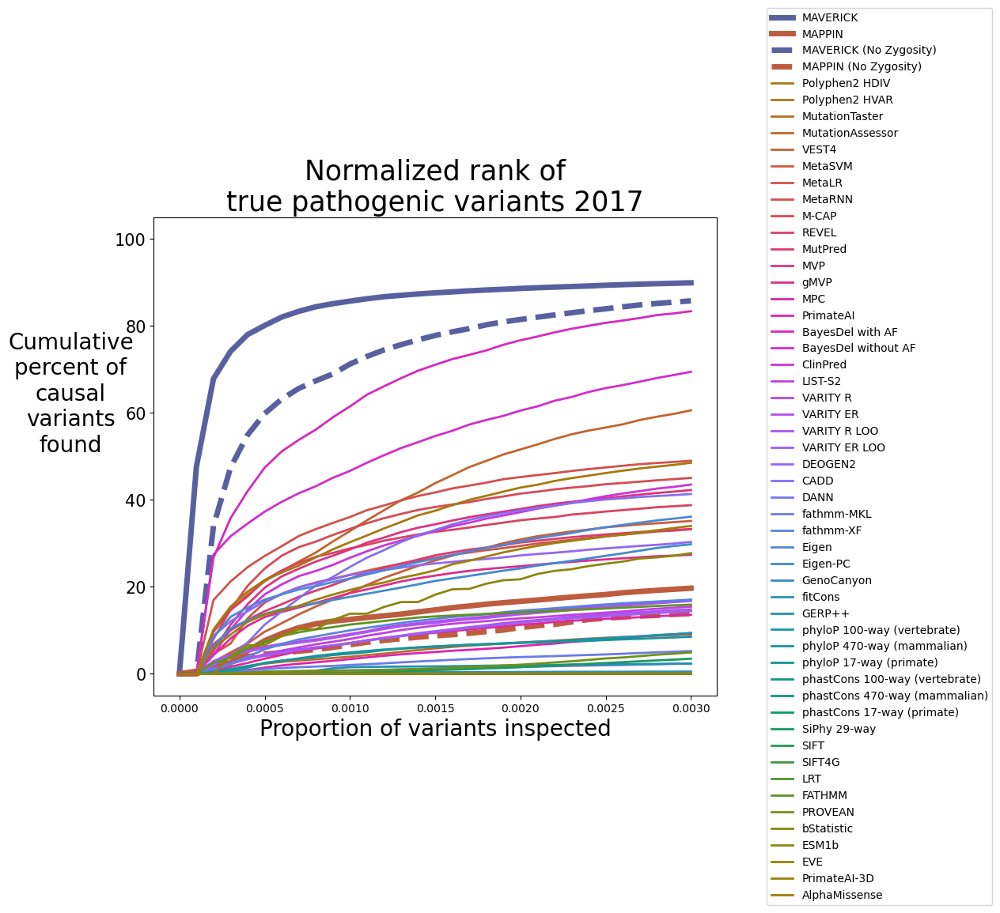

In [98]:
year="2017"
database=pandas.read_csv('Results/' + year + '_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')

plotRanksNorm(database,description="Normalized rank of\ntrue pathogenic variants " + str(year),
            fileName=year + '_107Samples_normalizedRanks0.3Percent.png',maxSize=0.003)

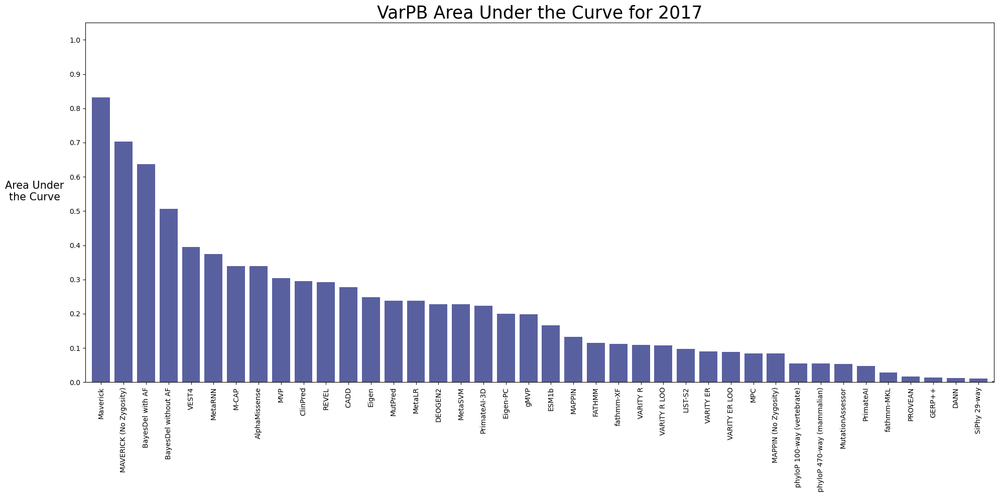

In [99]:
plotAUCScores(database,description="VarPB Area Under the Curve for " + str(year),
              fileName='AUC_barplots_' + year + '_107Samples_normalizedRanks0.3Percent.png',maxSize=0.003)

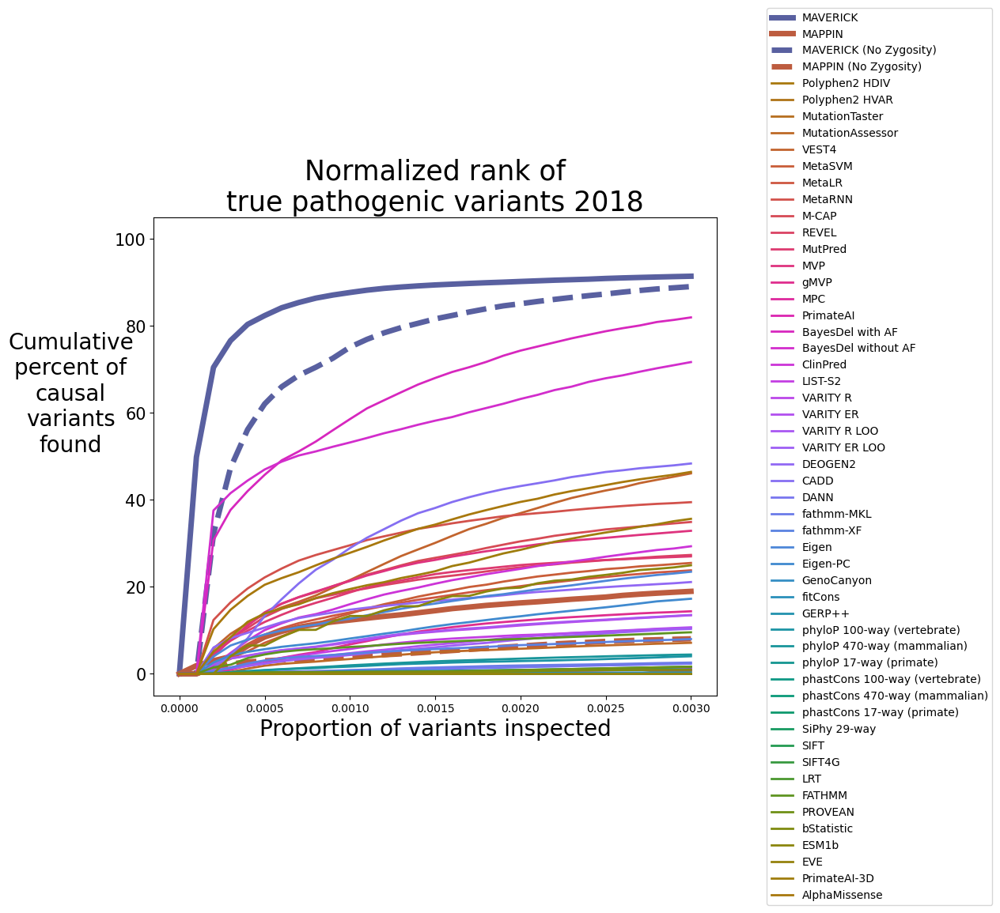

In [100]:
year="2018"
database=pandas.read_csv('Results/' + year + '_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')

plotRanksNorm(database,description="Normalized rank of\ntrue pathogenic variants " + str(year),
            fileName=year + '_107Samples_normalizedRanks0.3Percent.png',maxSize=0.003)

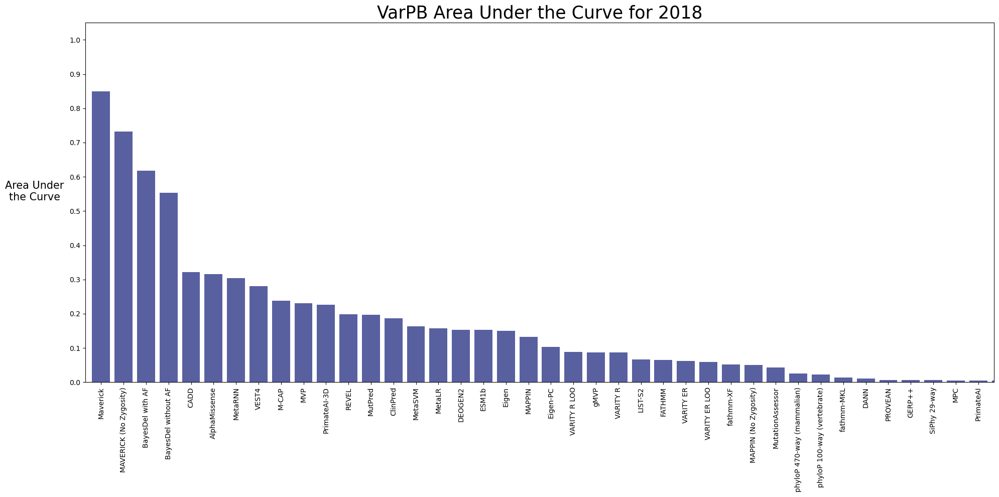

In [101]:
plotAUCScores(database,description="VarPB Area Under the Curve for " + str(year),
              fileName='AUC_barplots_' + year + '_107Samples_normalizedRanks0.3Percent.png',maxSize=0.003)

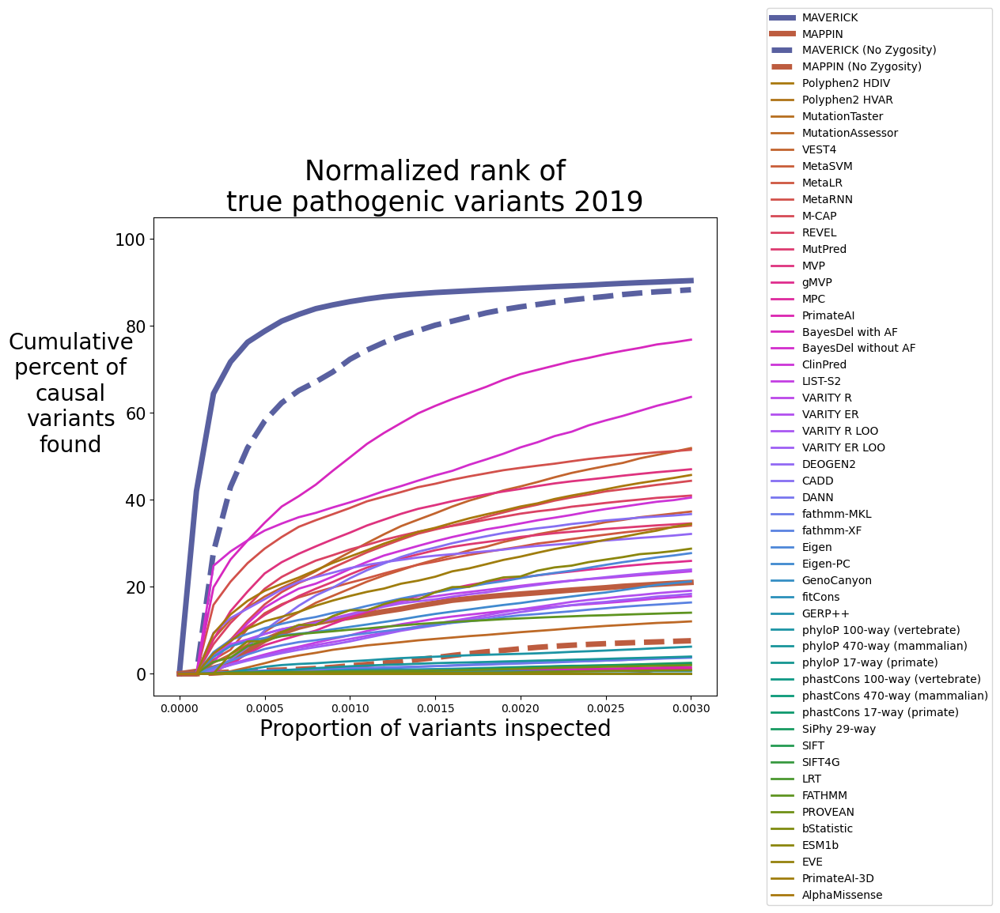

In [102]:
year="2019"
database=pandas.read_csv('Results/' + year + '_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')

plotRanksNorm(database,description="Normalized rank of\ntrue pathogenic variants " + str(year),
            fileName=year + '_107Samples_normalizedRanks0.3Percent.png',maxSize=0.003)

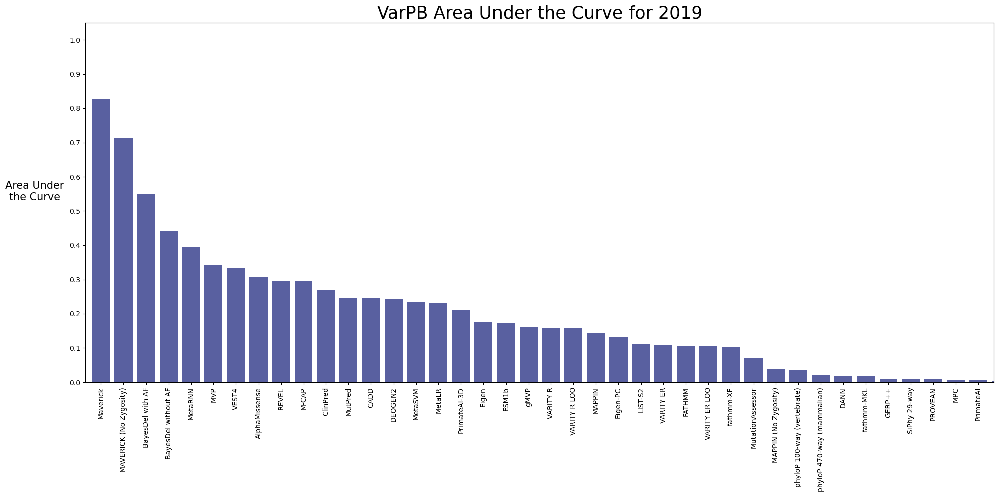

In [103]:
plotAUCScores(database,description="VarPB Area Under the Curve for " + str(year),
              fileName='AUC_barplots_' + year + '_107Samples_normalizedRanks0.3Percent.png',maxSize=0.003)

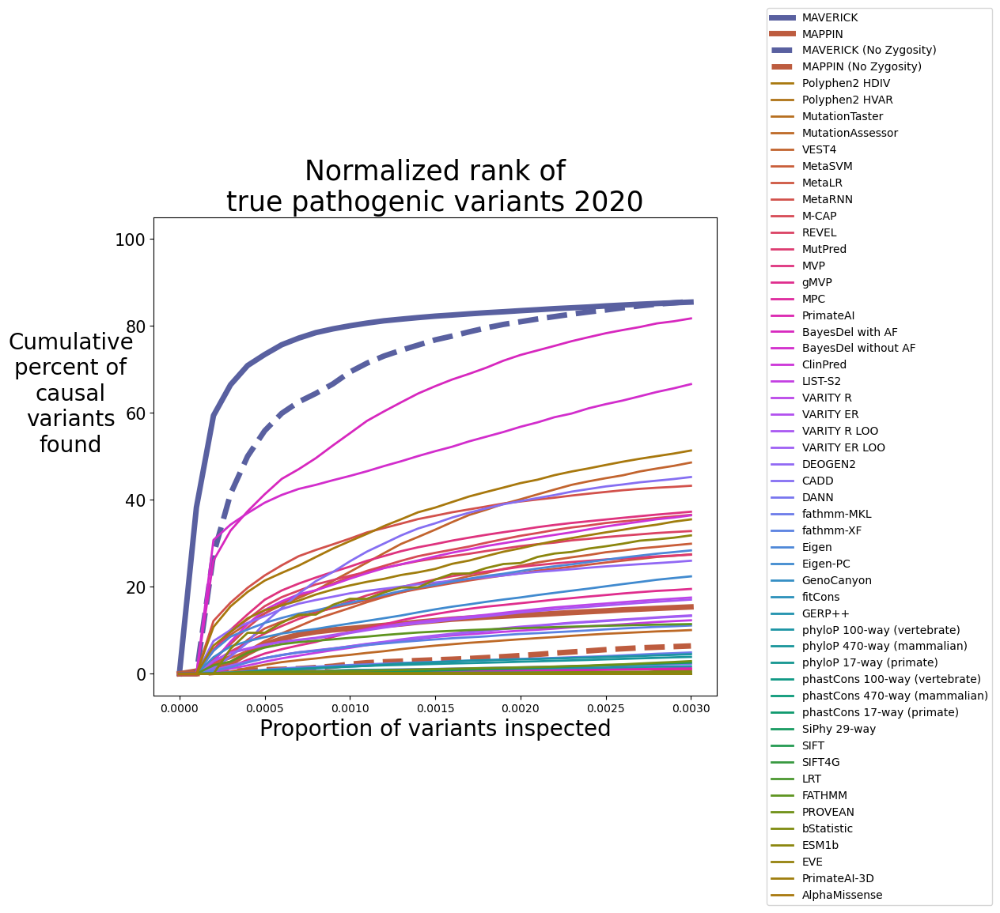

In [104]:
year="2020"
database=pandas.read_csv('Results/' + year + '_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')

plotRanksNorm(database,description="Normalized rank of\ntrue pathogenic variants " + str(year),
            fileName=year + '_107Samples_normalizedRanks0.3Percent.png',maxSize=0.003)

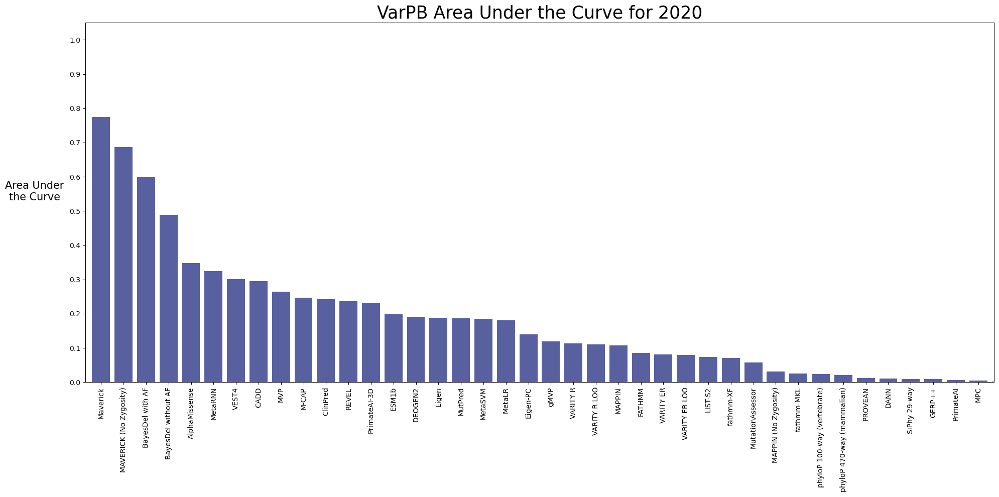

In [105]:
plotAUCScores(database,description="VarPB Area Under the Curve for " + str(year),
              fileName='AUC_barplots_' + year + '_107Samples_normalizedRanks0.3Percent.png',maxSize=0.003)

## Plot non-normalized results

In [42]:
import pandas
years=[2017,2018,2019,2020]

for year in years:

    database=pandas.read_csv('Results/StandardToolsRanks' + str(year) + 'SpikeIns.txt',sep='\t',low_memory=False)
    maverickRanksKnown=pandas.read_csv('Results/MaverickRanks' + str(year) + 'SpikeIns.txt',sep='\t',low_memory=False)
    mappinRanksKnown=pandas.read_csv('Results/MappinRanks' + str(year) + 'SpikeIns.txt',sep='\t',low_memory=False)
    database['Maverick']=maverickRanksKnown.loc[:,'Maverick']
    database['MAPPIN']=mappinRanksKnown.loc[:,'MAPPIN']
    thisToolName='ESM1b'
    thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks' + str(year) + 'SpikeIns.txt',sep='\t',low_memory=False)
    database[thisToolName]=thisTool.loc[:,thisToolName]
    thisToolName='EVE'
    thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks' + str(year) + 'SpikeIns.txt',sep='\t',low_memory=False)
    database[thisToolName]=thisTool.loc[:,thisToolName]
    thisToolName='PrimateAI3D'
    thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks' + str(year) + 'SpikeIns.txt',sep='\t',low_memory=False)
    database[thisToolName]=thisTool.loc[:,thisToolName]
    thisToolName='AlphaMissense'
    thisTool=pandas.read_csv('Results/' + thisToolName + 'Ranks' + str(year) + 'SpikeIns.txt',sep='\t',low_memory=False)
    database[thisToolName]=thisTool.loc[:,thisToolName]
    database.to_csv('Results/' + str(year) + '_combinedResults.txt.gz',sep='\t',index=False,compression='gzip')


In [106]:
import matplotlib.pyplot as plt
import cmocean
import numpy as np
standardToolsNameConverter={'Polyphen2_HDIV_score':'Polyphen2 HDIV','Polyphen2_HVAR_score':'Polyphen2 HVAR','MutationTaster_score':'MutationTaster','VEST4_score':'VEST4',
                            'MetaSVM_score':'MetaSVM','MetaLR_score':'MetaLR','M-CAP_score':'M-CAP','REVEL_score':'REVEL','MutPred_score':'MutPred','MVP_score':'MVP','MPC_score':'MPC',
                            'PrimateAI_score':'PrimateAI','DEOGEN2_score':'DEOGEN2','CADD_raw':'CADD','DANN_score':'DANN','fathmm-MKL_coding_score':'fathmm-MKL','fathmm-XF_coding_score':'fathmm-XF',
                            'GenoCanyon_score':'GenoCanyon','integrated_fitCons_score':'fitCons','GERP++_RS':'GERP++','phyloP100way_vertebrate':'phyloP 100-way (vertebrate)',
                            'phyloP470way_mammalian':'phyloP 470-way (mammalian)','phyloP17way_primate':'phyloP 17-way (primate)','phastCons100way_vertebrate':'phastCons 100-way (vertebrate)',
                            'phastCons470way_mammalian':'phastCons 470-way (mammalian)','phastCons17way_primate':'phastCons 17-way (primate)','SiPhy_29way_logOdds':'SiPhy 29-way',
                            'SIFT_score':'SIFT','SIFT4G_score':'SIFT4G','LRT_score':'LRT','FATHMM_score':'FATHMM','PROVEAN_score':'PROVEAN','bStatistic':'bStatistic',
                            'MutationAssessor_score':'MutationAssessor','Eigen-raw_coding':'Eigen','Eigen-PC-raw_coding':'Eigen-PC','Maverick_noZygosity':'MAVERICK (No Zygosity)',
                            'MAPPIN_noZygosity':'MAPPIN (No Zygosity)','BayesDel_addAF_score':'BayesDel with AF','BayesDel_noAF_score':'BayesDel without AF','ClinPred_score':'ClinPred',
                            'LIST-S2_score':'LIST-S2','VARITY_R_score':'VARITY R','VARITY_ER_score':'VARITY ER','VARITY_R_LOO_score':'VARITY R LOO','VARITY_ER_LOO_score':'VARITY ER LOO',
                            'AlphaMissense':'AlphaMissense','gMVP_score':'gMVP','MetaRNN_score':'MetaRNN','ESM1b':'ESM1b','Maverick':'Maverick','MAPPIN':'MAPPIN',
                            'EVE':'EVE','PrimateAI3D':'PrimateAI-3D'}
    
def plotRanksNonNorm(inputRanks,description='Known Genes',fileName='tmp.png',maxSize=100):
    totalSites=len(inputRanks)
    plt.figure(figsize=(15, 10))
    #hsv=plt.get_cmap('hsv')
    # drop Maverick and Mappin and their NZ versions from the standard set
    standardRanksData=inputRanks.drop(columns=['Maverick_noZygosity','MAPPIN_noZygosity','Maverick','MAPPIN'])
    cm=cmocean.cm.phase
    x=np.arange(0,maxSize+1,maxSize/20)
    yMaverick=np.zeros((len(x)))
    yMappin=np.zeros((len(x)))
    yMaverickNZ=np.zeros((len(x)))
    yMappinNZ=np.zeros((len(x)))
    standardToolsList=standardRanksData.columns.values
    yStandardTools=np.zeros((len(x),len(standardToolsList)))
    for i in range(len(x)):
        yMaverick[i]=100*len(inputRanks.loc[((inputRanks['Maverick']>0) & (inputRanks['Maverick']<=x[i])),:])/len(inputRanks.loc[(inputRanks['Maverick']>0),:])
        yMappin[i]=100*len(inputRanks.loc[((inputRanks['MAPPIN']>0) & (inputRanks['MAPPIN']<=x[i])),:])/len(inputRanks.loc[(inputRanks['MAPPIN']>0),:])
        for j in range(len(standardToolsList)):
            yStandardTools[i,j]=100*len(standardRanksData.loc[((standardRanksData[standardToolsList[j]]>0) & (standardRanksData[standardToolsList[j]]<=x[i])),:])/len(standardRanksData.loc[(standardRanksData[standardToolsList[j]]>0),:])
        yMaverickNZ[i]=100*len(inputRanks.loc[((inputRanks['Maverick_noZygosity']>0) & (inputRanks['Maverick_noZygosity']<=x[i])),:])/len(inputRanks.loc[(inputRanks['Maverick_noZygosity']>0),:])
        yMappinNZ[i]=100*len(inputRanks.loc[((inputRanks['MAPPIN_noZygosity']>0) & (inputRanks['MAPPIN_noZygosity']<=x[i])),:])/len(inputRanks.loc[(inputRanks['MAPPIN_noZygosity']>0),:])
    plt.plot(x,yMaverick,color="#5960a0", linewidth=5,label='MAVERICK')
    plt.plot(x,yMappin,color="#bd5c3f", linewidth=5,label='MAPPIN')
    plt.plot(x,yMaverickNZ,color="#5960a0",linestyle='dashed', linewidth=5,label='MAVERICK (No Zygosity)')
    plt.plot(x,yMappinNZ,color="#bd5c3f",linestyle='dashed', linewidth=5,label='MAPPIN (No Zygosity)')
    for i in range(len(standardToolsList)):
        plt.plot(x,yStandardTools[:,i],linewidth=2,label=standardToolsNameConverter[standardToolsList[i]],color=cm(float(i)/(len(standardToolsList)-1)))
    plt.ylim([-5,105])
    #plt.xticks([0,0.0002,0.0004,0.0006,0.0008,0.001,0.0012,0.0014],fontsize=15)
    plt.yticks([0,20,40,60,80,100],fontsize=15)
    plt.title(description,fontsize=25)
    plt.ylabel('Cumulative\npercent of\ncausal\nvariants\nfound',fontsize=20,rotation=0,labelpad=40)
    plt.xlabel('Proportion of variants inspected',fontsize=20)
    plt.legend(bbox_to_anchor=(1.5, 0.5),loc="right",fontsize=10)
    plt.tight_layout()
    plt.savefig(fileName,bbox_inches='tight',dpi=600)
    

def plotAUCScoresNonNorm(inputRanks,description='Known Genes',fileName='tmp.png',maxSize=20):
    x=np.arange(0,maxSize+1)
    totalSites=len(inputRanks)
    standardToolsList=inputRanks.columns.values
    y=np.zeros((len(x),len(inputRanks)))
    yLabels=[]
    for i in range(len(standardToolsList)):
        yLabels.append(standardToolsNameConverter[standardToolsList[i]])
    for i in range(len(x)):
        for j in range(len(standardToolsList)):
            y[i,j]=len(inputRanks.loc[((inputRanks[standardToolsList[j]]>0) & (inputRanks[standardToolsList[j]]<=x[i])),:])/len(inputRanks.loc[(inputRanks[standardToolsList[j]]>0),:])
    aucs=np.zeros(len(standardToolsList))
    for i in range(len(standardToolsList)):
        aucs[i]=np.round(sklearn.metrics.auc(x/maxSize,y[:,i]),4)
    
    sortOrder=scipy.stats.rankdata(-aucs,method='ordinal')-1
    aucs2=np.zeros(len(aucs))
    yLabels2=[]
    for i in range(len(aucs)):
        aucs2[i]=aucs[np.where(sortOrder==i)[0][0]]
        yLabels2.append(yLabels[np.where(sortOrder==i)[0][0]])
    plt.figure(figsize=(20, 10))
    x=np.arange(len(aucs2))
    plt.bar(x,aucs2,align='center',color="#5960a0")
    plt.xticks(x,yLabels2,fontsize=10,rotation=90)
    plt.ylim([0,1.05])
    plt.xlim([-0.7,39.7])
    plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=10)
    plt.ylabel('Area Under\nthe Curve',fontsize=15,rotation=0,labelpad=50)
    plt.title(description,fontsize=25)
    plt.tight_layout()
    plt.savefig(fileName,bbox_inches='tight',dpi=600)

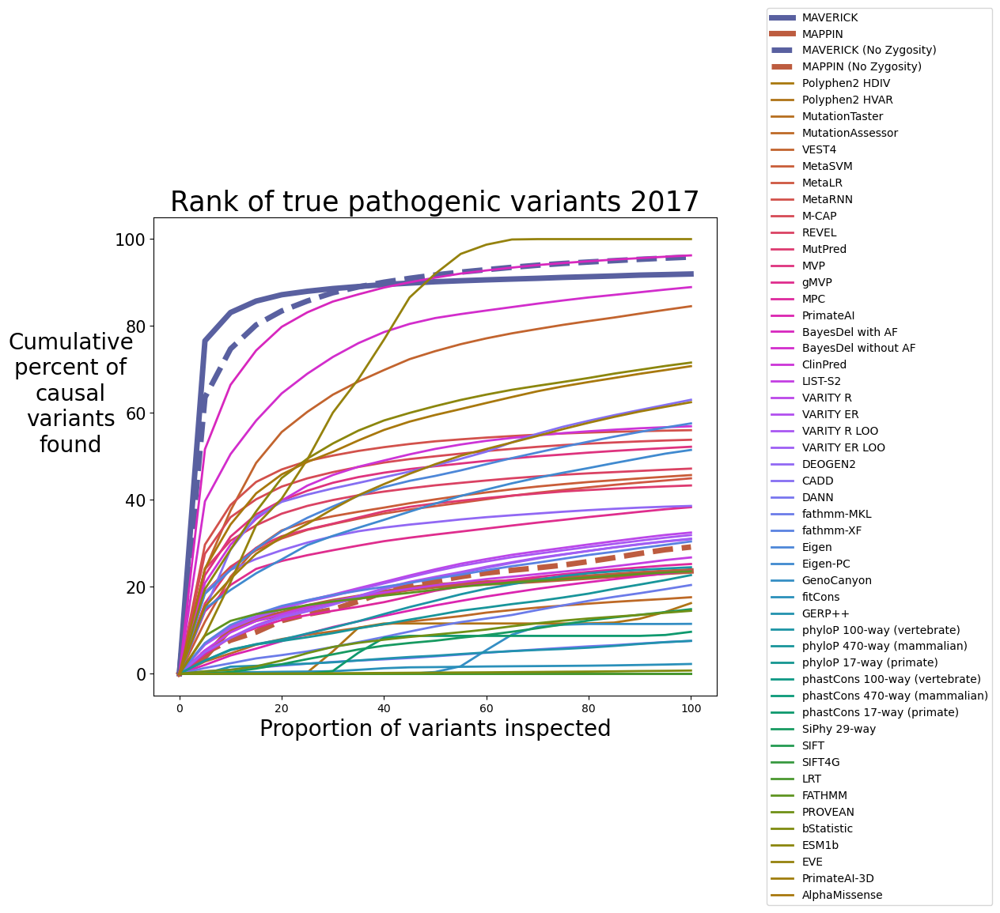

In [107]:
year="2017"
database=pandas.read_csv('Results/' + year + '_combinedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')

plotRanksNonNorm(database,description="Rank of true pathogenic variants " + str(year),
            fileName=year + '_107Samples_ranks100.png',maxSize=100)


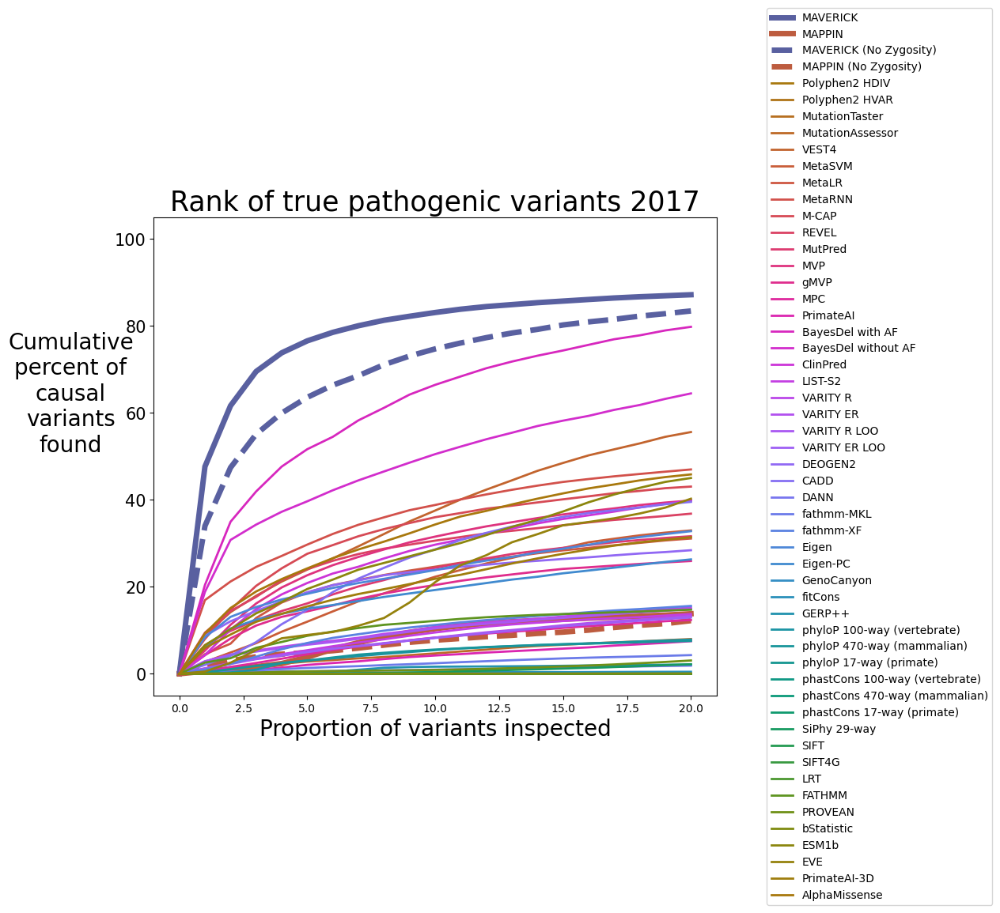

In [108]:
plotRanksNonNorm(database,description="Rank of true pathogenic variants " + str(year),
            fileName=year + '_107Samples_ranks20.png',maxSize=20)


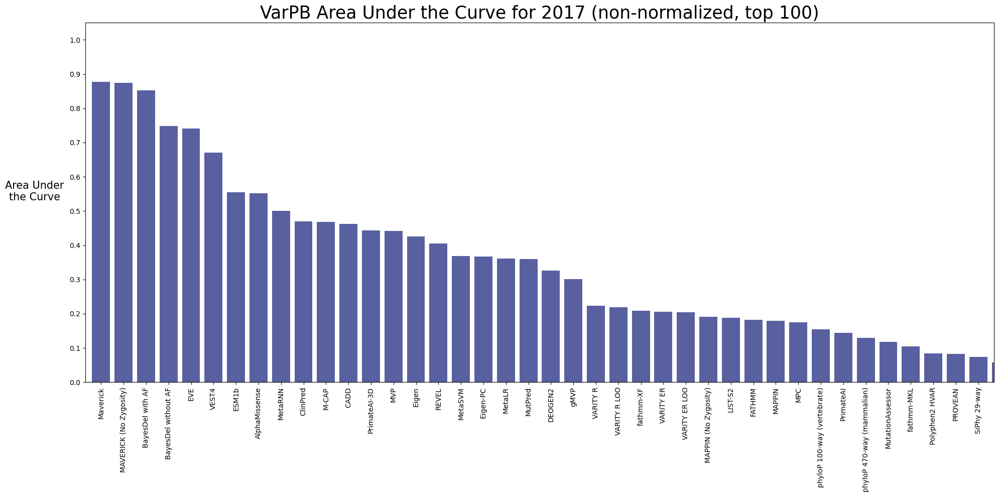

In [109]:
plotAUCScoresNonNorm(database,description="VarPB Area Under the Curve for " + str(year) + " (non-normalized, top 100)",
              fileName='AUC_barplots_' + year + '_107Samples_ranks100.png',maxSize=100)

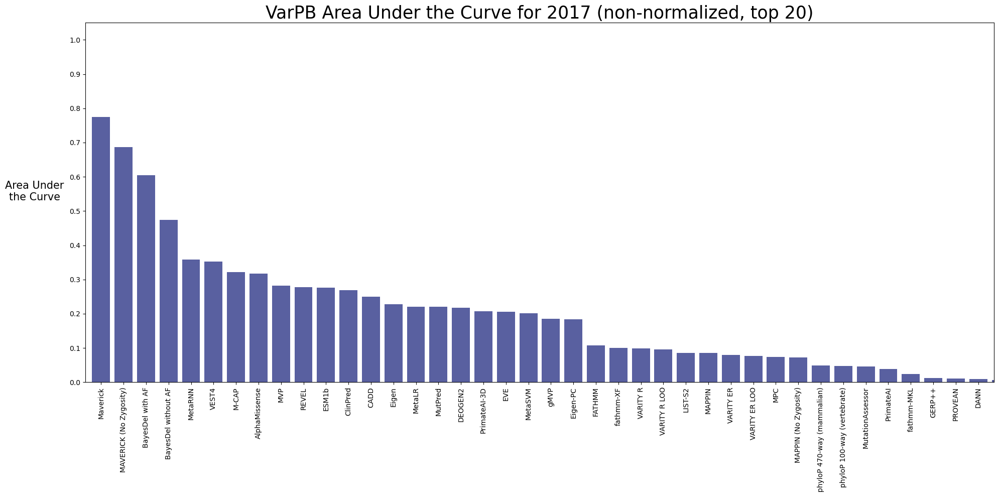

In [110]:
plotAUCScoresNonNorm(database,description="VarPB Area Under the Curve for " + str(year) + " (non-normalized, top 20)",
              fileName='AUC_barplots_' + year + '_107Samples_ranks20.png',maxSize=20)

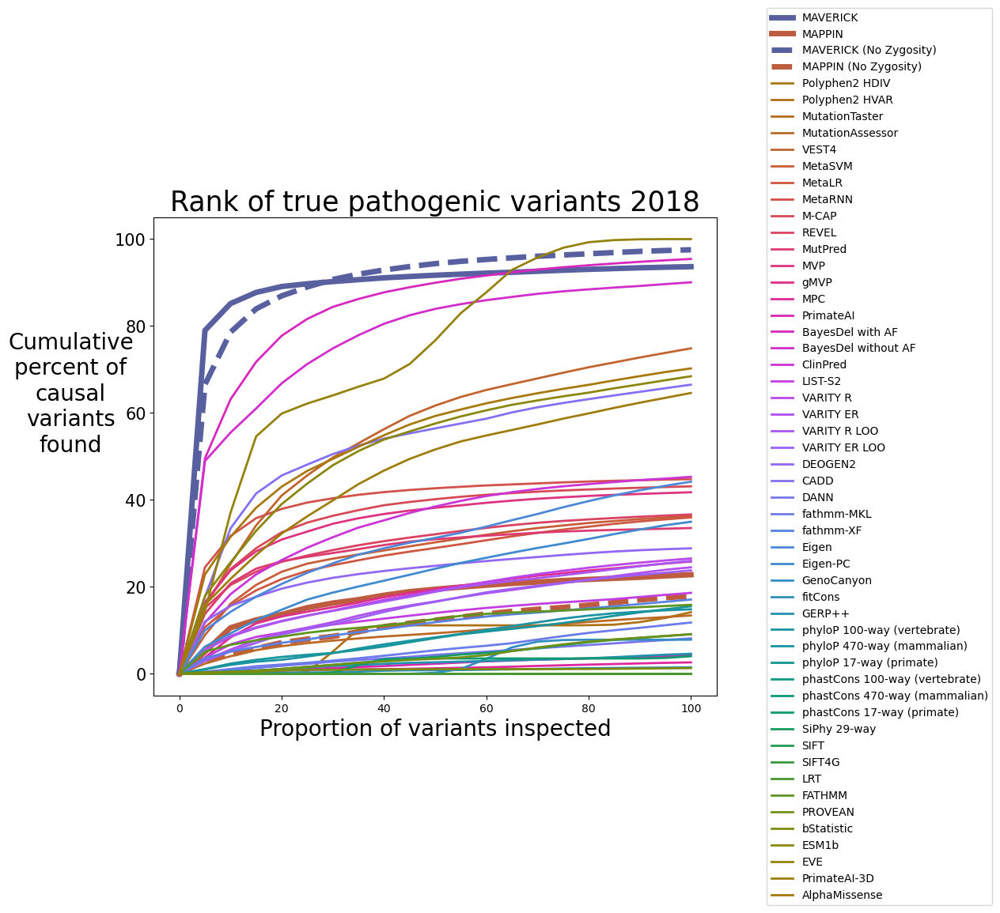

In [111]:
year="2018"
database=pandas.read_csv('Results/' + year + '_combinedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')

plotRanksNonNorm(database,description="Rank of true pathogenic variants " + str(year),
            fileName=year + '_107Samples_ranks100.png',maxSize=100)


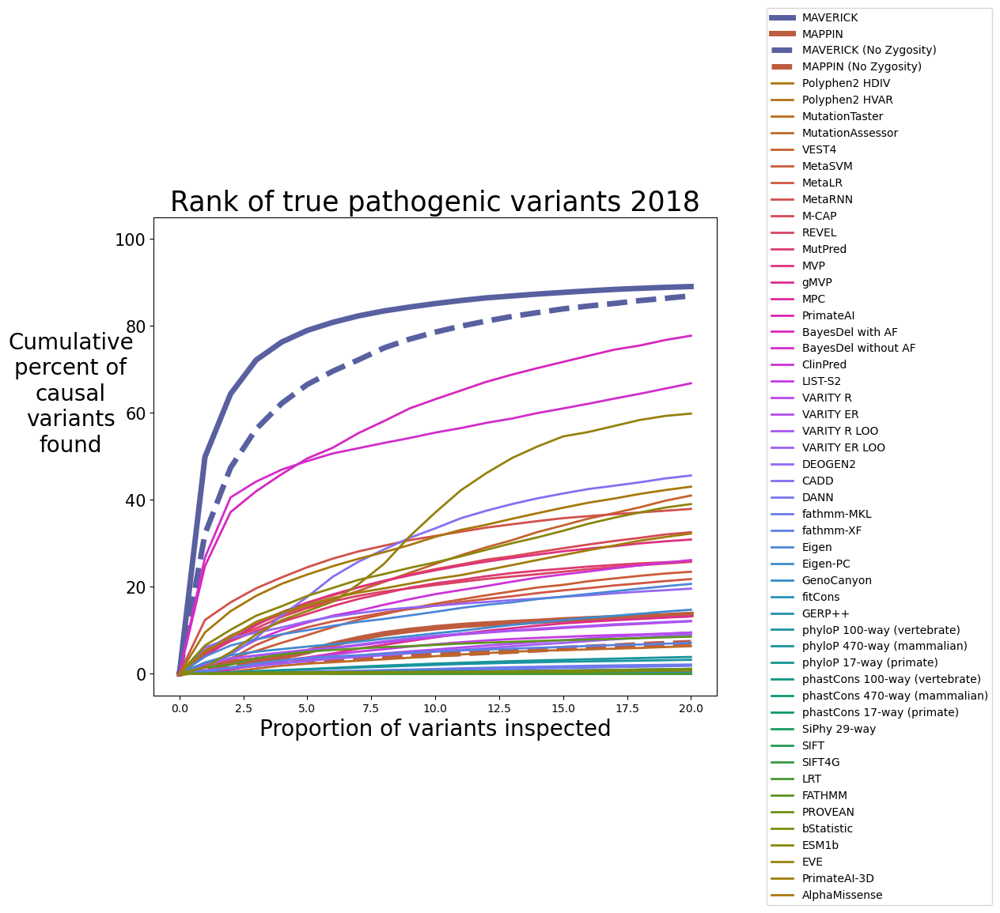

In [112]:
plotRanksNonNorm(database,description="Rank of true pathogenic variants " + str(year),
            fileName=year + '_107Samples_ranks20.png',maxSize=20)


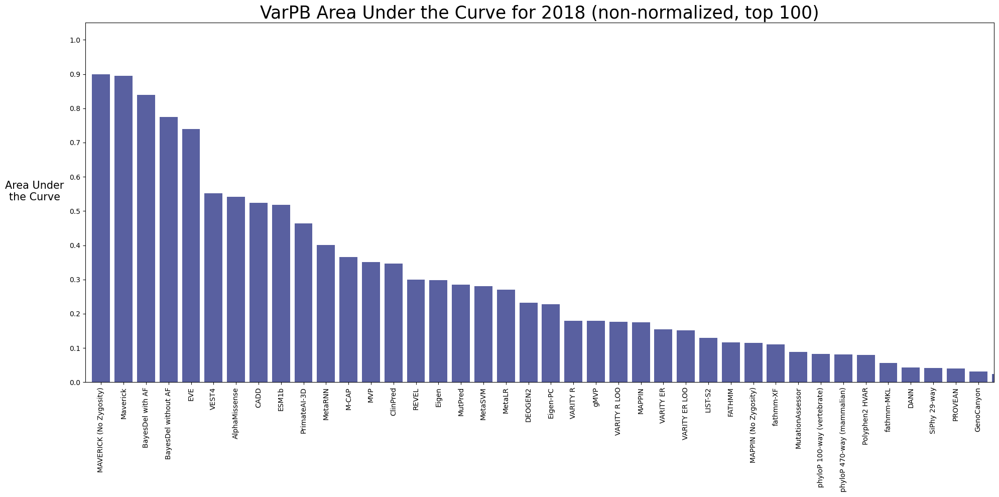

In [113]:
plotAUCScoresNonNorm(database,description="VarPB Area Under the Curve for " + str(year) + " (non-normalized, top 100)",
              fileName='AUC_barplots_' + year + '_107Samples_ranks100.png',maxSize=100)

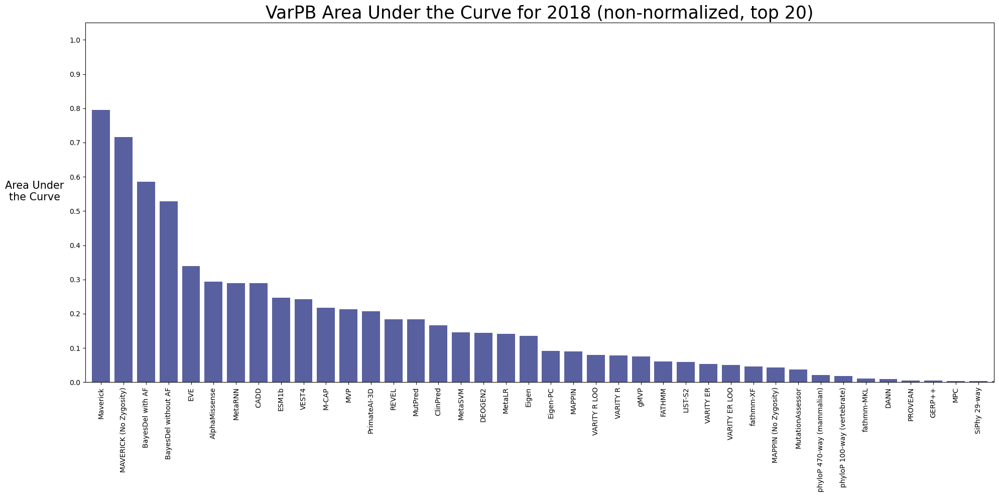

In [114]:
plotAUCScoresNonNorm(database,description="VarPB Area Under the Curve for " + str(year) + " (non-normalized, top 20)",
              fileName='AUC_barplots_' + year + '_107Samples_ranks20.png',maxSize=20)

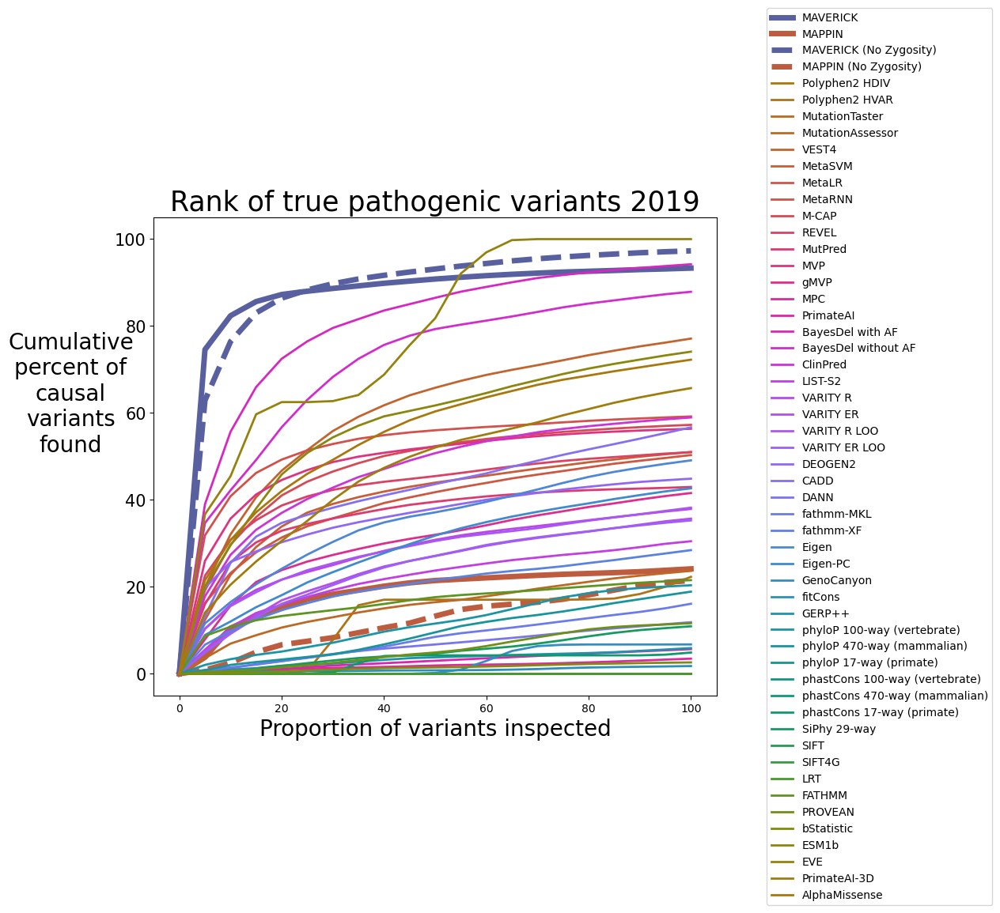

In [115]:
year="2019"
database=pandas.read_csv('Results/' + year + '_combinedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')

plotRanksNonNorm(database,description="Rank of true pathogenic variants " + str(year),
            fileName=year + '_107Samples_ranks100.png',maxSize=100)


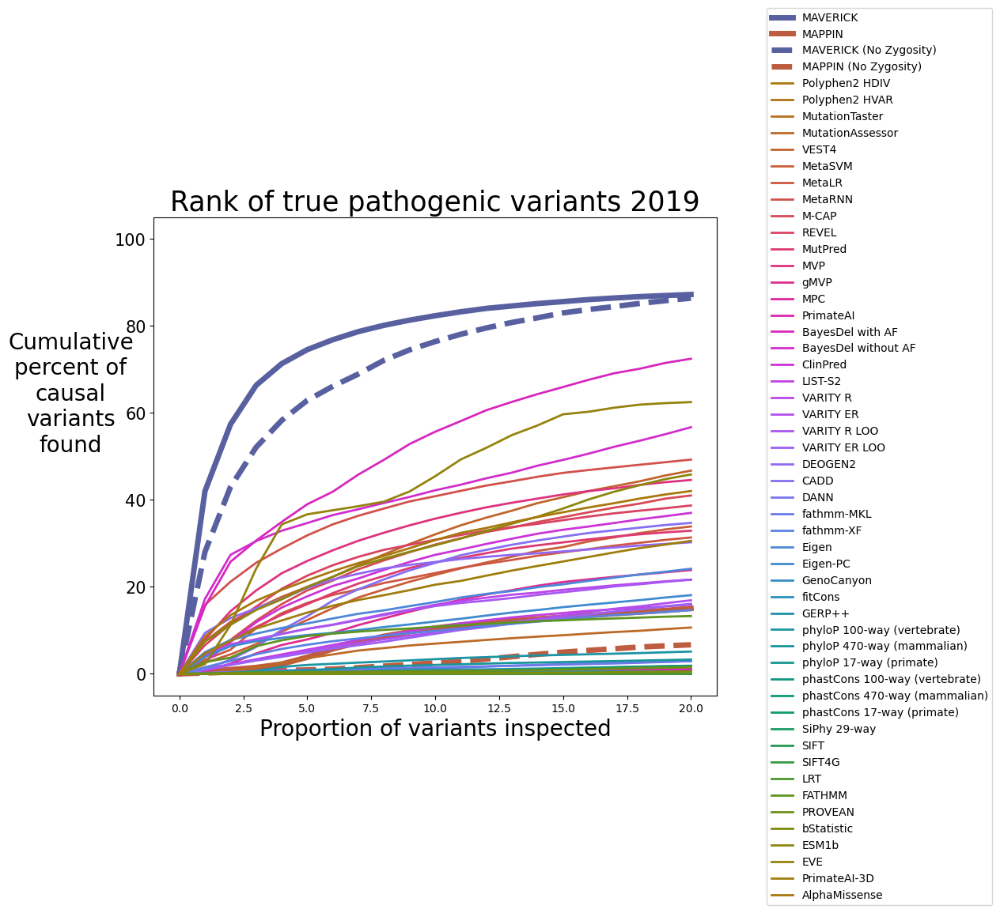

In [116]:
plotRanksNonNorm(database,description="Rank of true pathogenic variants " + str(year),
            fileName=year + '_107Samples_ranks20.png',maxSize=20)


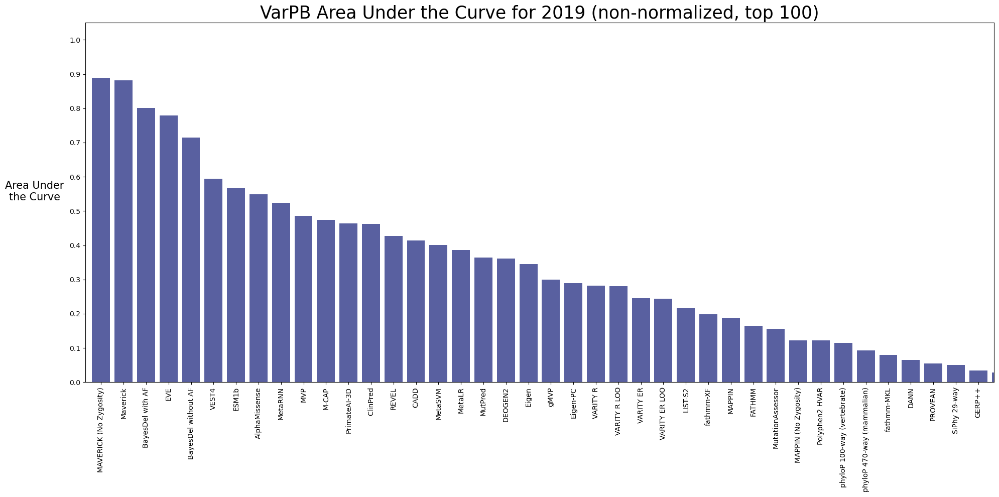

In [117]:
plotAUCScoresNonNorm(database,description="VarPB Area Under the Curve for " + str(year) + " (non-normalized, top 100)",
              fileName='AUC_barplots_' + year + '_107Samples_ranks100.png',maxSize=100)

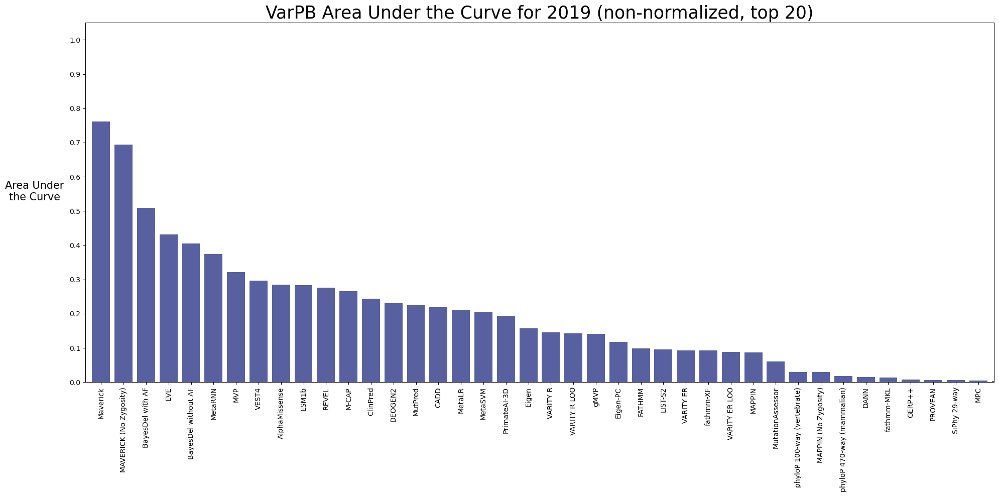

In [118]:
plotAUCScoresNonNorm(database,description="VarPB Area Under the Curve for " + str(year) + " (non-normalized, top 20)",
              fileName='AUC_barplots_' + year + '_107Samples_ranks20.png',maxSize=20)

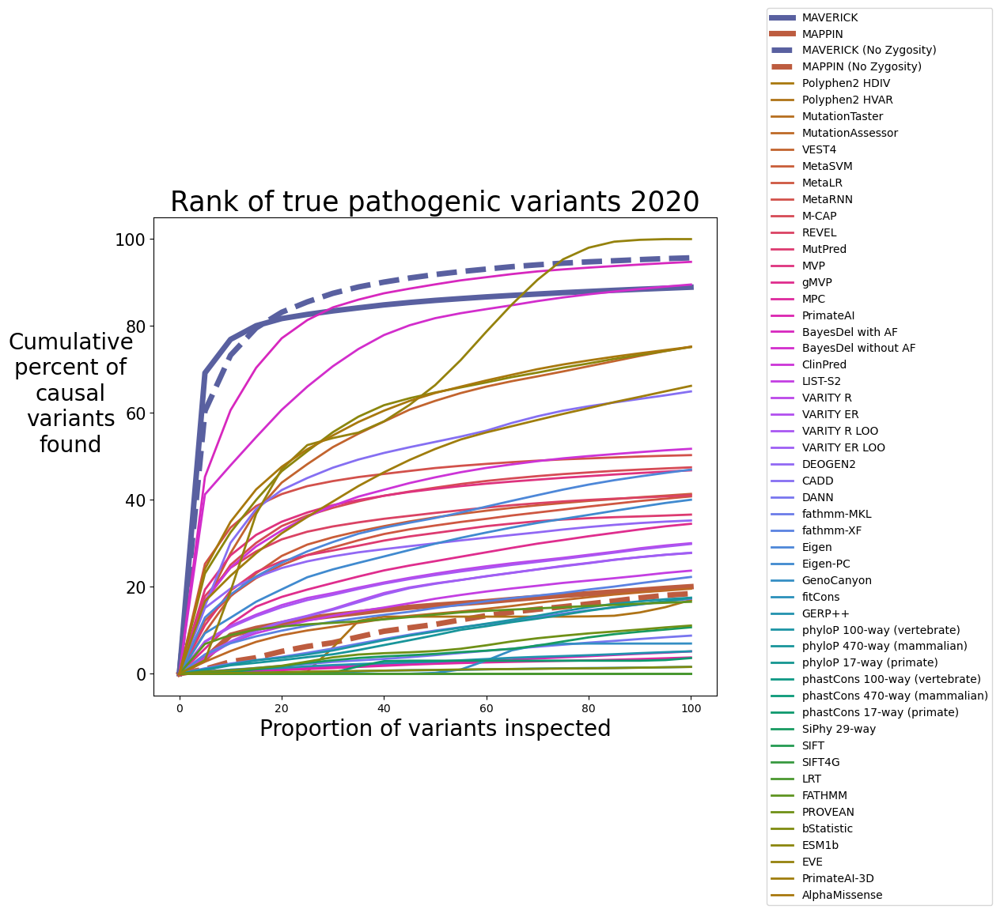

In [119]:
year="2020"
database=pandas.read_csv('Results/' + year + '_combinedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')

plotRanksNonNorm(database,description="Rank of true pathogenic variants " + str(year),
            fileName=year + '_107Samples_ranks100.png',maxSize=100)


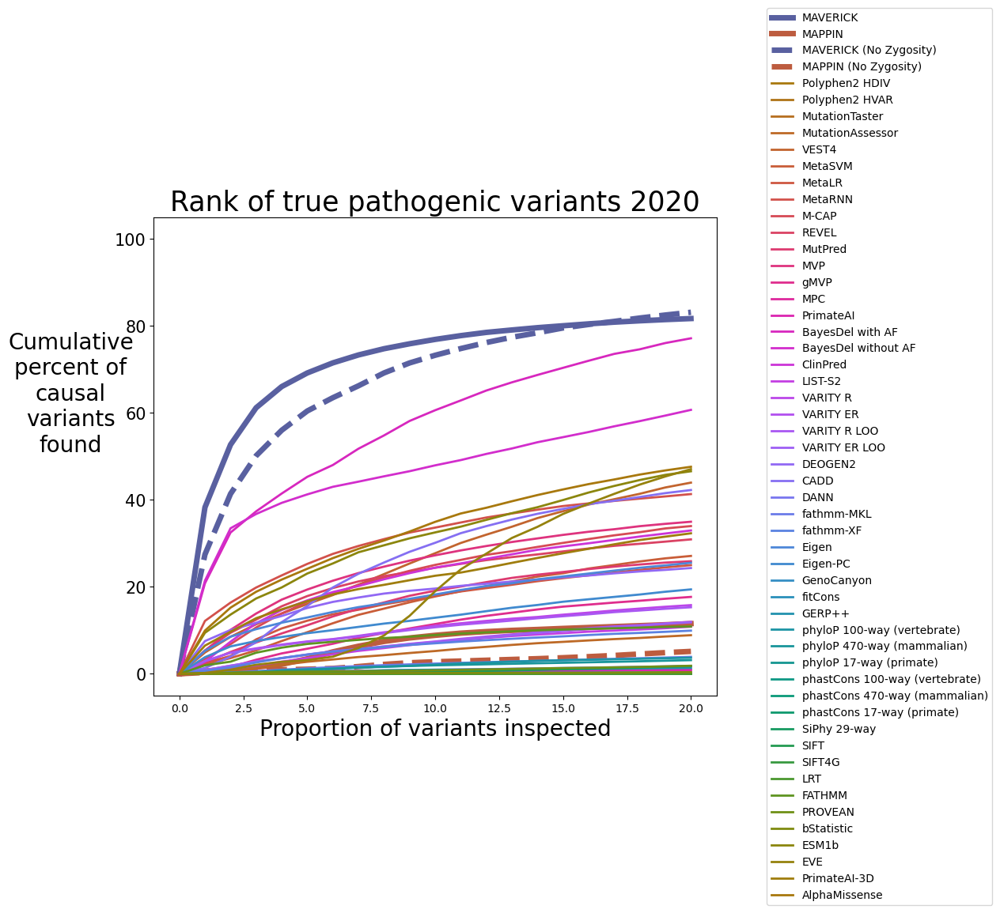

In [120]:
plotRanksNonNorm(database,description="Rank of true pathogenic variants " + str(year),
            fileName=year + '_107Samples_ranks20.png',maxSize=20)


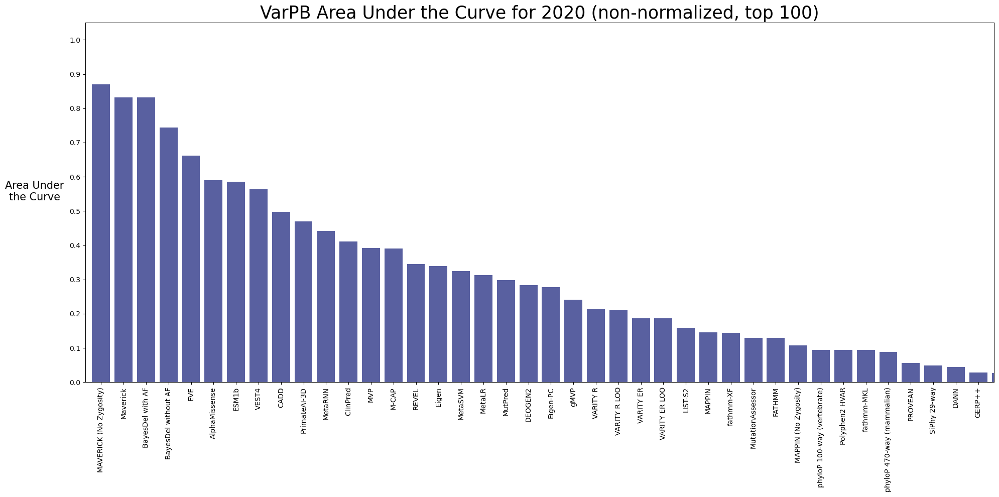

In [121]:
plotAUCScoresNonNorm(database,description="VarPB Area Under the Curve for " + str(year) + " (non-normalized, top 100)",
              fileName='AUC_barplots_' + year + '_107Samples_ranks100.png',maxSize=100)

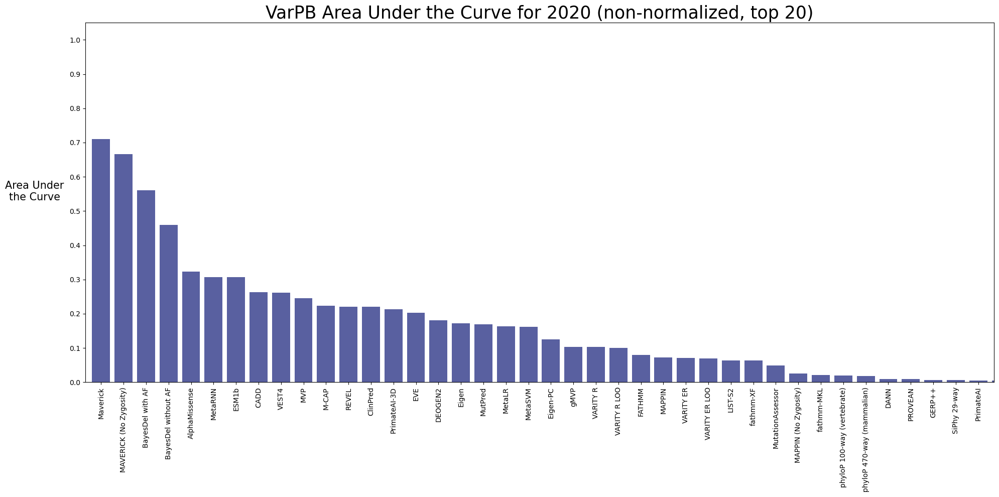

In [122]:
plotAUCScoresNonNorm(database,description="VarPB Area Under the Curve for " + str(year) + " (non-normalized, top 20)",
              fileName='AUC_barplots_' + year + '_107Samples_ranks20.png',maxSize=20)

## Plot rank variation over years

### Non-normalized

In [60]:
import pandas 
import numpy as np
import sklearn
import sklearn.metrics

years = ['2017','2018','2019','2020','2021','2022','2023']

standardToolsNameConverter={'Polyphen2_HDIV_score':'Polyphen2 HDIV','Polyphen2_HVAR_score':'Polyphen2 HVAR','MutationTaster_score':'MutationTaster','VEST4_score':'VEST4',
                            'MetaSVM_score':'MetaSVM','MetaLR_score':'MetaLR','M-CAP_score':'M-CAP','REVEL_score':'REVEL','MutPred_score':'MutPred','MVP_score':'MVP','MPC_score':'MPC',
                            'PrimateAI_score':'PrimateAI','DEOGEN2_score':'DEOGEN2','CADD_raw':'CADD','DANN_score':'DANN','fathmm-MKL_coding_score':'fathmm-MKL','fathmm-XF_coding_score':'fathmm-XF',
                            'GenoCanyon_score':'GenoCanyon','integrated_fitCons_score':'fitCons','GERP++_RS':'GERP++','phyloP100way_vertebrate':'phyloP 100-way (vertebrate)',
                            'phyloP470way_mammalian':'phyloP 470-way (mammalian)','phyloP17way_primate':'phyloP 17-way (primate)','phastCons100way_vertebrate':'phastCons 100-way (vertebrate)',
                            'phastCons470way_mammalian':'phastCons 470-way (mammalian)','phastCons17way_primate':'phastCons 17-way (primate)','SiPhy_29way_logOdds':'SiPhy 29-way',
                            'SIFT_score':'SIFT','SIFT4G_score':'SIFT4G','LRT_score':'LRT','FATHMM_score':'FATHMM','PROVEAN_score':'PROVEAN','bStatistic':'bStatistic',
                            'MutationAssessor_score':'MutationAssessor','Eigen-raw_coding':'Eigen','Eigen-PC-raw_coding':'Eigen-PC','Maverick_noZygosity':'MAVERICK (No Zygosity)',
                            'MAPPIN_noZygosity':'MAPPIN (No Zygosity)','BayesDel_addAF_score':'BayesDel with AF','BayesDel_noAF_score':'BayesDel without AF','ClinPred_score':'ClinPred',
                            'LIST-S2_score':'LIST-S2','VARITY_R_score':'VARITY R','VARITY_ER_score':'VARITY ER','VARITY_R_LOO_score':'VARITY R LOO','VARITY_ER_LOO_score':'VARITY ER LOO',
                            'AlphaMissense':'AlphaMissense','gMVP_score':'gMVP','MetaRNN_score':'MetaRNN','ESM1b':'ESM1b','Maverick':'Maverick','MAPPIN':'MAPPIN',
                            'EVE':'EVE','PrimateAI3D':'PrimateAI-3D'}
toolNames=list(standardToolsNameConverter.keys())
scoresOverYears=pandas.DataFrame(np.zeros((len(toolNames),len(years))),columns=years,index=toolNames)

yLabels=[]
for i in range(len(toolNames)):
    yLabels.append(standardToolsNameConverter[toolNames[i]])

for year in years:
    print('Starting year: ' + year)
    database=pandas.read_csv('Results/' + year + '_combinedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
    x=np.arange(0,21)
    totalSites=len(database)
    for toolType in toolNames:
        y=np.zeros((len(x)))
        for i in x:
            y[i]=len(database.loc[((database[toolType]>0) & (database[toolType]<=x[i])),:])/len(database.loc[(database[toolType]>0),:])
        scoresOverYears.loc[toolType,year]=np.round(sklearn.metrics.auc(x/20,y),4)
scoresOverYears        

Starting year: 2017
Starting year: 2018
Starting year: 2019
Starting year: 2020
Starting year: 2021
Starting year: 2022
Starting year: 2023


,2017,2018,2019,2020,2021,2022,2023
Polyphen2_HDIV_score,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Polyphen2_HVAR_score,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
MutationTaster_score,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
VEST4_score,0.3531,0.2428,0.2973,0.2619,0.2823,0.2702,0.2745
MetaSVM_score,0.2018,0.1449,0.2052,0.1618,0.1864,0.1814,0.2068
MetaLR_score,0.2210,0.1418,0.2094,0.1628,0.1961,0.1880,0.2056
M-CAP_score,0.3209,0.2176,0.2661,0.2240,0.2917,0.2590,0.2950
REVEL_score,0.2774,0.1842,0.2765,0.2199,0.2592,0.2371,0.2669
MutPred_score,0.2207,0.1840,0.2252,0.1693,0.1952,0.1683,0.1818
MVP_score,0.2825,0.2132,0.3213,0.2456,0.2717,0.2483,0.2807


In [61]:
scoresOverYears['mean']=scoresOverYears.mean(axis=1)
scoresOverYears['stdev']=scoresOverYears.iloc[:,:7].std(axis=1)
scoresOverYears

,2017,2018,2019,2020,2021,2022,2023,mean,stdev
Polyphen2_HDIV_score,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000
Polyphen2_HVAR_score,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000
MutationTaster_score,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000
VEST4_score,0.3531,0.2428,0.2973,0.2619,0.2823,0.2702,0.2745,0.283157,0.035157
MetaSVM_score,0.2018,0.1449,0.2052,0.1618,0.1864,0.1814,0.2068,0.184043,0.023524
MetaLR_score,0.2210,0.1418,0.2094,0.1628,0.1961,0.1880,0.2056,0.189243,0.027931
M-CAP_score,0.3209,0.2176,0.2661,0.2240,0.2917,0.2590,0.2950,0.267757,0.037968
REVEL_score,0.2774,0.1842,0.2765,0.2199,0.2592,0.2371,0.2669,0.245886,0.034416
MutPred_score,0.2207,0.1840,0.2252,0.1693,0.1952,0.1683,0.1818,0.192071,0.023026
MVP_score,0.2825,0.2132,0.3213,0.2456,0.2717,0.2483,0.2807,0.266186,0.034390


In [62]:
scoresOverYears.to_csv('Results/AUCs_nonNormalizedRanks20_2017-2023.txt',sep='\t',index=True)

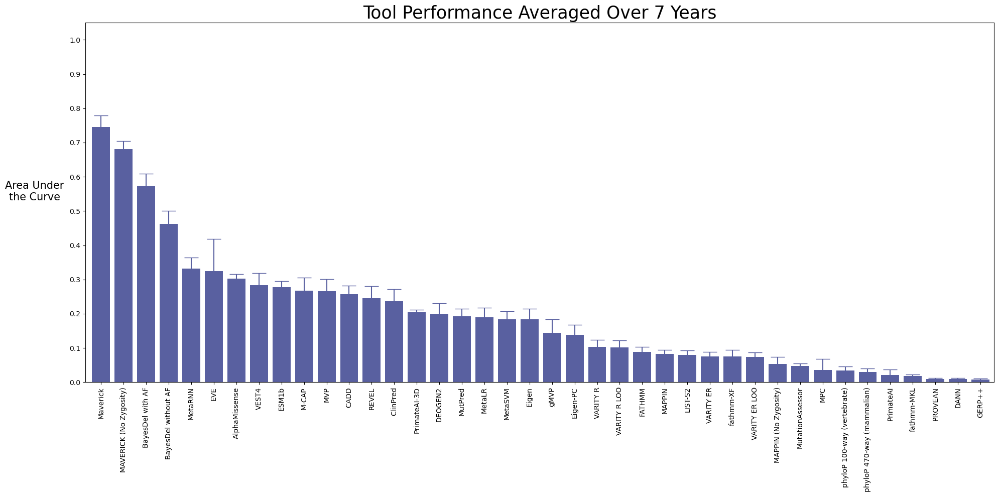

In [63]:
import matplotlib.pyplot as plt
scoresOverYears2=scoresOverYears.sort_values(by='mean',ascending=False)
aucs2=scoresOverYears2.loc[:,'mean'].values
errors=scoresOverYears2.loc[:,'stdev'].values
yLabels2=[]
for i in range(len(aucs2)):
    yLabels2.append(standardToolsNameConverter[scoresOverYears2.index[i]])
x=np.arange(len(aucs2))
plt.figure(figsize=(20, 10))
plt.bar(x,aucs2,align='center',color="#5960a0")
plt.xticks(x,yLabels2,fontsize=10,rotation=90)
plt.errorbar(x,aucs2,yerr=errors,ecolor='#5960a0',capsize=10,linestyle='none')
plt.ylim([0,1.05])
plt.xlim([-0.7,39.6])
plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=10)
plt.ylabel('Area Under\nthe Curve',fontsize=15,rotation=0,labelpad=50)
plt.title('Tool Performance Averaged Over 7 Years',fontsize=25)
plt.tight_layout()
plt.show()
#plt.savefig(fileName,bbox_inches='tight',pad_inches=3,dpi=600)

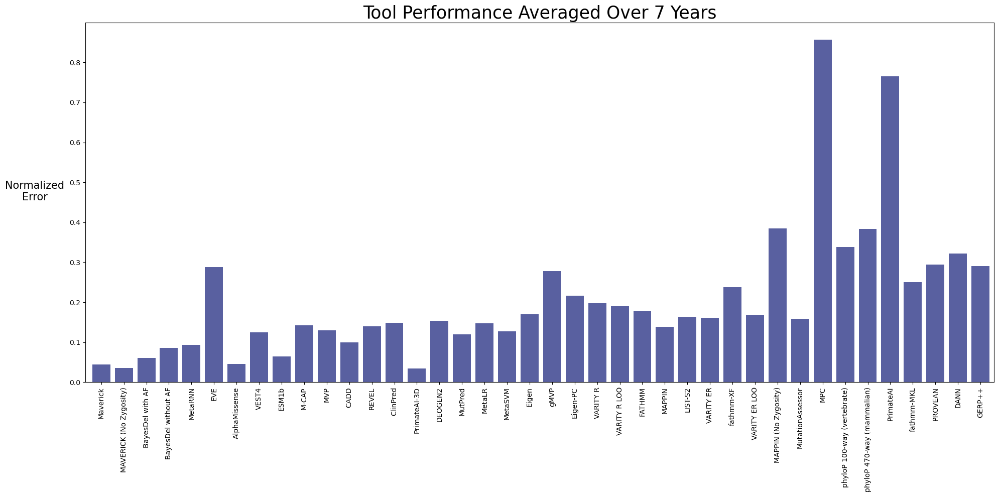

In [64]:
scoresOverYears2['normalizedError']=scoresOverYears2.loc[:,'stdev']/scoresOverYears2.loc[:,'mean']
plt.figure(figsize=(20, 10))
plt.bar(x,scoresOverYears2.loc[:,'normalizedError'].values,align='center',color="#5960a0")
plt.xticks(x,yLabels2,fontsize=10,rotation=90)
plt.xlim([-0.7,39.6])
plt.ylabel('Normalized\nError',fontsize=15,rotation=0,labelpad=50)
plt.title('Tool Performance Averaged Over 7 Years',fontsize=25)
plt.tight_layout()
plt.show()


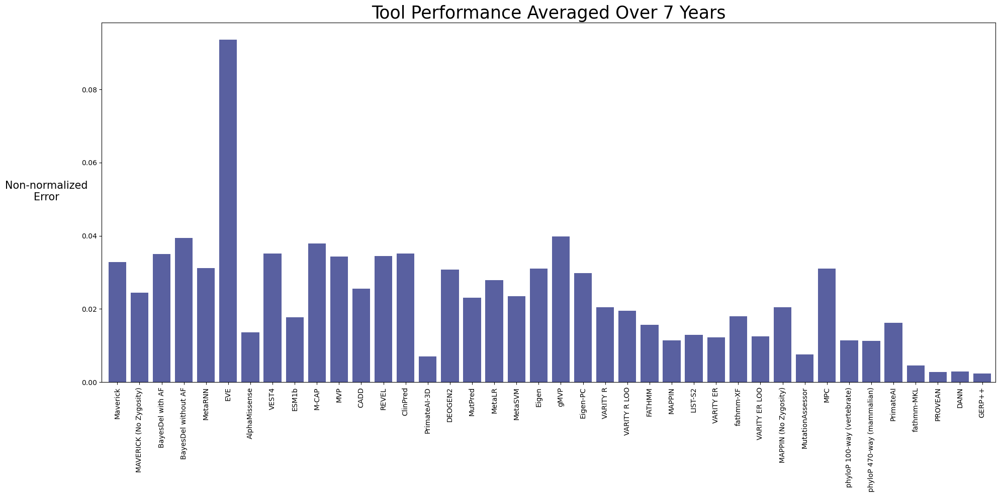

In [65]:
plt.figure(figsize=(20, 10))
plt.bar(x,scoresOverYears2.loc[:,'stdev'].values,align='center',color="#5960a0")
plt.xticks(x,yLabels2,fontsize=10,rotation=90)
plt.xlim([-0.7,39.6])
plt.ylabel('Non-normalized\nError',fontsize=15,rotation=0,labelpad=50)
plt.title('Tool Performance Averaged Over 7 Years',fontsize=25)
plt.tight_layout()
plt.show()


### Normalized

In [70]:
import pandas 
import numpy as np
import sklearn
import sklearn.metrics

years = ['2017','2018','2019','2020','2021','2022','2023']
maxSize=0.003

standardToolsNameConverter={'Polyphen2_HDIV_score':'Polyphen2 HDIV','Polyphen2_HVAR_score':'Polyphen2 HVAR','MutationTaster_score':'MutationTaster','VEST4_score':'VEST4',
                            'MetaSVM_score':'MetaSVM','MetaLR_score':'MetaLR','M-CAP_score':'M-CAP','REVEL_score':'REVEL','MutPred_score':'MutPred','MVP_score':'MVP','MPC_score':'MPC',
                            'PrimateAI_score':'PrimateAI','DEOGEN2_score':'DEOGEN2','CADD_raw':'CADD','DANN_score':'DANN','fathmm-MKL_coding_score':'fathmm-MKL','fathmm-XF_coding_score':'fathmm-XF',
                            'GenoCanyon_score':'GenoCanyon','integrated_fitCons_score':'fitCons','GERP++_RS':'GERP++','phyloP100way_vertebrate':'phyloP 100-way (vertebrate)',
                            'phyloP470way_mammalian':'phyloP 470-way (mammalian)','phyloP17way_primate':'phyloP 17-way (primate)','phastCons100way_vertebrate':'phastCons 100-way (vertebrate)',
                            'phastCons470way_mammalian':'phastCons 470-way (mammalian)','phastCons17way_primate':'phastCons 17-way (primate)','SiPhy_29way_logOdds':'SiPhy 29-way',
                            'SIFT_score':'SIFT','SIFT4G_score':'SIFT4G','LRT_score':'LRT','FATHMM_score':'FATHMM','PROVEAN_score':'PROVEAN','bStatistic':'bStatistic',
                            'MutationAssessor_score':'MutationAssessor','Eigen-raw_coding':'Eigen','Eigen-PC-raw_coding':'Eigen-PC','Maverick_noZygosity':'MAVERICK (No Zygosity)',
                            'MAPPIN_noZygosity':'MAPPIN (No Zygosity)','BayesDel_addAF_score':'BayesDel with AF','BayesDel_noAF_score':'BayesDel without AF','ClinPred_score':'ClinPred',
                            'LIST-S2_score':'LIST-S2','VARITY_R_score':'VARITY R','VARITY_ER_score':'VARITY ER','VARITY_R_LOO_score':'VARITY R LOO','VARITY_ER_LOO_score':'VARITY ER LOO',
                            'AlphaMissense':'AlphaMissense','gMVP_score':'gMVP','MetaRNN_score':'MetaRNN','ESM1b':'ESM1b','Maverick':'Maverick','MAPPIN':'MAPPIN',
                            'EVE':'EVE','PrimateAI3D':'PrimateAI-3D'}
toolNames=list(standardToolsNameConverter.keys())
scoresOverYears=pandas.DataFrame(np.zeros((len(toolNames),len(years))),columns=years,index=toolNames)

yLabels=[]
for i in range(len(toolNames)):
    yLabels.append(standardToolsNameConverter[toolNames[i]])

for year in years:
    print('Starting year: ' + year)
    database=pandas.read_csv('Results/' + year + '_combinedNormalizedResults.txt.gz',sep='\t',low_memory=False,compression='gzip')
    x=np.arange(0,maxSize+0.0001,0.0001)
    totalSites=len(database)
    for toolType in toolNames:
        y=np.zeros((len(x)))
        for i in range(len(x)):
            y[i]=len(database.loc[((database[toolType]>0) & (database[toolType]<=x[i])),:])/len(database.loc[(database[toolType]>0),:])
        scoresOverYears.loc[toolType,year]=np.round(sklearn.metrics.auc(x/maxSize,y),4)
scoresOverYears['mean']=scoresOverYears.mean(axis=1)
scoresOverYears['stdev']=scoresOverYears.iloc[:,:7].std(axis=1)
scoresOverYears.to_csv('Results/AUCs_normalizedRanks_0.3Percent_2017-2023.txt',sep='\t',index=True)
scoresOverYears        

Starting year: 2017
Starting year: 2018
Starting year: 2019
Starting year: 2020
Starting year: 2021
Starting year: 2022
Starting year: 2023


,2017,2018,2019,2020,2021,2022,2023,mean,stdev
Polyphen2_HDIV_score,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000
Polyphen2_HVAR_score,0.0003,0.0005,0.0007,0.0006,0.0006,0.0005,0.0005,0.000529,0.000125
MutationTaster_score,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000
VEST4_score,0.3955,0.2798,0.3337,0.3004,0.3212,0.3103,0.3122,0.321871,0.036560
MetaSVM_score,0.2272,0.1632,0.2332,0.1848,0.2114,0.2035,0.2311,0.207771,0.026185
MetaLR_score,0.2378,0.1573,0.2302,0.1807,0.2140,0.2044,0.2253,0.207100,0.028981
M-CAP_score,0.3390,0.2383,0.2947,0.2466,0.3134,0.2781,0.3160,0.289443,0.037288
REVEL_score,0.2928,0.1977,0.2969,0.2365,0.2769,0.2524,0.2842,0.262486,0.035955
MutPred_score,0.2382,0.1974,0.2447,0.1868,0.2139,0.1856,0.2004,0.209571,0.023797
MVP_score,0.3033,0.2307,0.3428,0.2645,0.2927,0.2669,0.3017,0.286086,0.035828


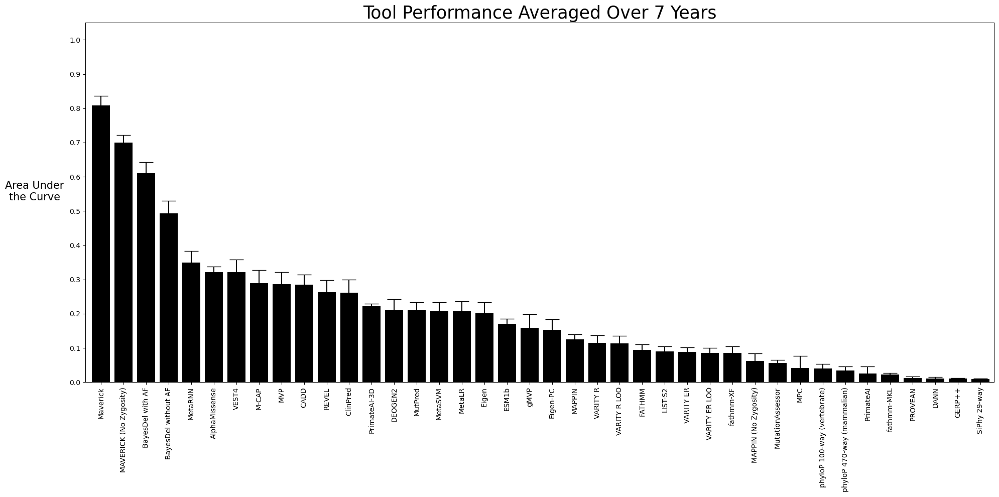

<Figure size 640x480 with 0 Axes>

In [71]:
import pandas
import numpy as np
scoresOverYears=pandas.read_csv('Results/AUCs_normalizedRanks_0.3Percent_2017-2023.txt',sep='\t',low_memory=False,index_col=0)
standardToolsNameConverter={'Polyphen2_HDIV_score':'Polyphen2 HDIV','Polyphen2_HVAR_score':'Polyphen2 HVAR','MutationTaster_score':'MutationTaster','VEST4_score':'VEST4',
                            'MetaSVM_score':'MetaSVM','MetaLR_score':'MetaLR','M-CAP_score':'M-CAP','REVEL_score':'REVEL','MutPred_score':'MutPred','MVP_score':'MVP','MPC_score':'MPC',
                            'PrimateAI_score':'PrimateAI','DEOGEN2_score':'DEOGEN2','CADD_raw':'CADD','DANN_score':'DANN','fathmm-MKL_coding_score':'fathmm-MKL','fathmm-XF_coding_score':'fathmm-XF',
                            'GenoCanyon_score':'GenoCanyon','integrated_fitCons_score':'fitCons','GERP++_RS':'GERP++','phyloP100way_vertebrate':'phyloP 100-way (vertebrate)',
                            'phyloP470way_mammalian':'phyloP 470-way (mammalian)','phyloP17way_primate':'phyloP 17-way (primate)','phastCons100way_vertebrate':'phastCons 100-way (vertebrate)',
                            'phastCons470way_mammalian':'phastCons 470-way (mammalian)','phastCons17way_primate':'phastCons 17-way (primate)','SiPhy_29way_logOdds':'SiPhy 29-way',
                            'SIFT_score':'SIFT','SIFT4G_score':'SIFT4G','LRT_score':'LRT','FATHMM_score':'FATHMM','PROVEAN_score':'PROVEAN','bStatistic':'bStatistic',
                            'MutationAssessor_score':'MutationAssessor','Eigen-raw_coding':'Eigen','Eigen-PC-raw_coding':'Eigen-PC','Maverick_noZygosity':'MAVERICK (No Zygosity)',
                            'MAPPIN_noZygosity':'MAPPIN (No Zygosity)','BayesDel_addAF_score':'BayesDel with AF','BayesDel_noAF_score':'BayesDel without AF','ClinPred_score':'ClinPred',
                            'LIST-S2_score':'LIST-S2','VARITY_R_score':'VARITY R','VARITY_ER_score':'VARITY ER','VARITY_R_LOO_score':'VARITY R LOO','VARITY_ER_LOO_score':'VARITY ER LOO',
                            'AlphaMissense':'AlphaMissense','gMVP_score':'gMVP','MetaRNN_score':'MetaRNN','ESM1b':'ESM1b','Maverick':'Maverick','MAPPIN':'MAPPIN',
                            'EVE':'EVE','PrimateAI3D':'PrimateAI-3D'}

import matplotlib.pyplot as plt
scoresOverYears2=scoresOverYears.sort_values(by='mean',ascending=False)
aucs2=scoresOverYears2.loc[:,'mean'].values
errors=scoresOverYears2.loc[:,'stdev'].values
yLabels2=[]
for i in range(len(aucs2)):
    yLabels2.append(standardToolsNameConverter[scoresOverYears2.index[i]])
x=np.arange(len(aucs2))
plt.figure(figsize=(20, 10))
plt.bar(x,aucs2,align='center',color="k")
plt.xticks(x,yLabels2,fontsize=10,rotation=90)
plt.errorbar(x,aucs2,yerr=errors,ecolor='k',capsize=10,linestyle='none')
plt.ylim([0,1.05])
plt.xlim([-0.7,39.6])
plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=10)
plt.ylabel('Area Under\nthe Curve',fontsize=15,rotation=0,labelpad=50)
plt.title('Tool Performance Averaged Over 7 Years',fontsize=25)
plt.tight_layout()
plt.show()
plt.savefig('AUC_barplots_2017-2023_107Samples_normalizedRanks0.3Percent_top40.png',bbox_inches='tight',pad_inches=3,dpi=600)

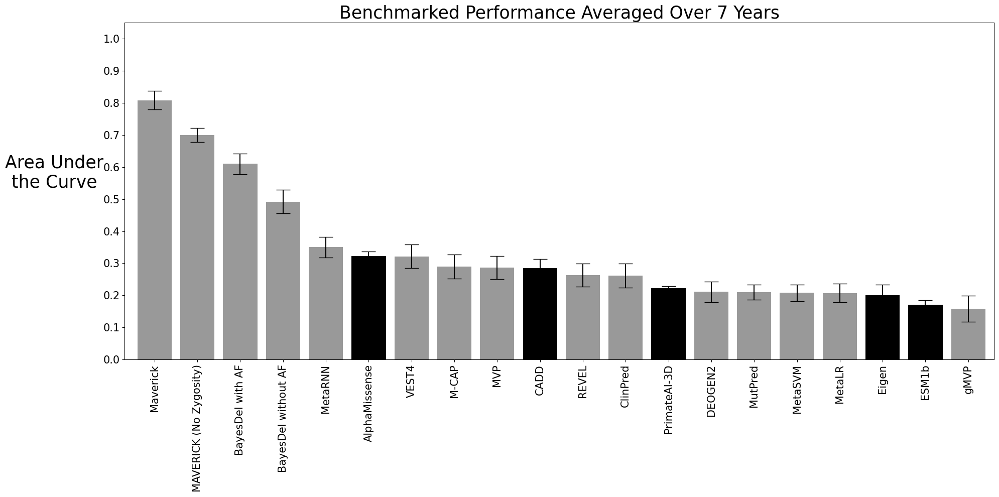

In [73]:
import pandas
import numpy as np
scoresOverYears=pandas.read_csv('Results/AUCs_normalizedRanks_0.3Percent_2017-2023.txt',sep='\t',low_memory=False,index_col=0)
standardToolsNameConverter={'Polyphen2_HDIV_score':'Polyphen2 HDIV','Polyphen2_HVAR_score':'Polyphen2 HVAR','MutationTaster_score':'MutationTaster','VEST4_score':'VEST4',
                            'MetaSVM_score':'MetaSVM','MetaLR_score':'MetaLR','M-CAP_score':'M-CAP','REVEL_score':'REVEL','MutPred_score':'MutPred','MVP_score':'MVP','MPC_score':'MPC',
                            'PrimateAI_score':'PrimateAI','DEOGEN2_score':'DEOGEN2','CADD_raw':'CADD','DANN_score':'DANN','fathmm-MKL_coding_score':'fathmm-MKL','fathmm-XF_coding_score':'fathmm-XF',
                            'GenoCanyon_score':'GenoCanyon','integrated_fitCons_score':'fitCons','GERP++_RS':'GERP++','phyloP100way_vertebrate':'phyloP 100-way (vertebrate)',
                            'phyloP470way_mammalian':'phyloP 470-way (mammalian)','phyloP17way_primate':'phyloP 17-way (primate)','phastCons100way_vertebrate':'phastCons 100-way (vertebrate)',
                            'phastCons470way_mammalian':'phastCons 470-way (mammalian)','phastCons17way_primate':'phastCons 17-way (primate)','SiPhy_29way_logOdds':'SiPhy 29-way',
                            'SIFT_score':'SIFT','SIFT4G_score':'SIFT4G','LRT_score':'LRT','FATHMM_score':'FATHMM','PROVEAN_score':'PROVEAN','bStatistic':'bStatistic',
                            'MutationAssessor_score':'MutationAssessor','Eigen-raw_coding':'Eigen','Eigen-PC-raw_coding':'Eigen-PC','Maverick_noZygosity':'MAVERICK (No Zygosity)',
                            'MAPPIN_noZygosity':'MAPPIN (No Zygosity)','BayesDel_addAF_score':'BayesDel with AF','BayesDel_noAF_score':'BayesDel without AF','ClinPred_score':'ClinPred',
                            'LIST-S2_score':'LIST-S2','VARITY_R_score':'VARITY R','VARITY_ER_score':'VARITY ER','VARITY_R_LOO_score':'VARITY R LOO','VARITY_ER_LOO_score':'VARITY ER LOO',
                            'AlphaMissense':'AlphaMissense','gMVP_score':'gMVP','MetaRNN_score':'MetaRNN','ESM1b':'ESM1b','Maverick':'Maverick','MAPPIN':'MAPPIN',
                            'EVE':'EVE','PrimateAI3D':'PrimateAI-3D'}

import matplotlib.pyplot as plt
scoresOverYears2=scoresOverYears.sort_values(by='mean',ascending=False)
aucs2=scoresOverYears2.loc[:,'mean'].values[:20]
errors=scoresOverYears2.loc[:,'stdev'].values[:20]
yLabels2=[]
for i in range(len(aucs2)):
    yLabels2.append(standardToolsNameConverter[scoresOverYears2.index[i]])
x=np.arange(len(aucs2))
plt.figure(figsize=(20, 10))
supervision=['0.6','0.6','0.6','0.6','0.6','k','0.6','0.6','0.6','k','0.6','0.6','k','0.6','0.6','0.6','0.6','k','k','0.6']
plt.bar(x,aucs2,align='center',color=supervision)
plt.xticks(x,yLabels2,fontsize=15,rotation=90)
plt.errorbar(x,aucs2,yerr=errors,ecolor='k',capsize=10,linestyle='none')
plt.ylim([0,1.05])
plt.xlim([-0.7,19.6])
plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=15)
plt.ylabel('Area Under\nthe Curve',fontsize=25,rotation=0,labelpad=70)
#for ticklabel, tickcolor in zip(plt.gca().get_xticklabels(), my_colors):
#    ticklabel.set_color(tickcolor)
plt.title('Benchmarked Performance Averaged Over 7 Years',fontsize=25)
plt.tight_layout()
plt.savefig('AUC_barplots_2017-2023_107Samples_normalizedRanks0.3Percent_top20.png',bbox_inches='tight',dpi=600)